In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dataset DateTime Setting**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
from tensorflow import keras

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from keras.callbacks import ModelCheckpoint


In [ ]:
matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25)
plt.rc('axes', labelsize=30)
plt.rc('axes', titlesize=30)
plt.rc('legend', fontsize=25)

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 20)

In [ ]:
sns.set(rc = {'figure.figsize':(15,8)})

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/FYP complete files/New York_40.73_-74.02_1998-2020 (1).csv')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
0,1998,1,1,0,0,0,0,0,-12.0,162.28,7.5,0.219,317.5,73.43,-9.0
1,1998,1,1,0,30,0,0,0,-12.0,161.15,7.5,0.219,317.5,73.47,-9.0
2,1998,1,1,1,0,0,0,0,-13.0,158.19,7.6,0.219,315.8,76.58,-10.0
3,1998,1,1,1,30,0,0,0,-13.0,154.01,7.6,0.216,315.8,76.60,-10.0
4,1998,1,1,2,0,0,0,0,-13.0,149.13,7.7,0.214,314.4,80.81,-10.0


In [ ]:
df.dtypes

Year                    int64
Month                   int64
Day                     int64
Hour                    int64
Minute                  int64
GHI                     int64
Clearsky GHI            int64
Cloud Type              int64
Dew Point             float64
Solar Zenith Angle    float64
Wind Speed            float64
Precipitable Water    float64
Wind Direction        float64
Relative Humidity     float64
Temperature           float64
dtype: object

In [ ]:
df['Date']=df['Year'].astype(str) + df['Month'].astype(str).str.zfill(2) + df['Day'].astype(str).str.zfill(2) + df['Hour'].astype(str).str.zfill(2)+ df['Minute'].astype(str).str.zfill(2)
df.Date

0         199801010000
1         199801010030
2         199801010100
3         199801010130
4         199801010200
              ...     
402955    202012312130
402956    202012312200
402957    202012312230
402958    202012312300
402959    202012312330
Name: Date, Length: 402960, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d%H%M')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Date
0,1998,1,1,0,0,0,0,0,-12.0,162.28,7.5,0.219,317.5,73.43,-9.0,1998-01-01 00:00:00
1,1998,1,1,0,30,0,0,0,-12.0,161.15,7.5,0.219,317.5,73.47,-9.0,1998-01-01 00:30:00
2,1998,1,1,1,0,0,0,0,-13.0,158.19,7.6,0.219,315.8,76.58,-10.0,1998-01-01 01:00:00
3,1998,1,1,1,30,0,0,0,-13.0,154.01,7.6,0.216,315.8,76.60,-10.0,1998-01-01 01:30:00
4,1998,1,1,2,0,0,0,0,-13.0,149.13,7.7,0.214,314.4,80.81,-10.0,1998-01-01 02:00:00


In [ ]:
df = df.drop(labels = ['Year', 'Month',	'Day',	'Hour',	'Minute'], axis=1)

In [ ]:
df.set_index('Date', inplace = True)
df.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
Date,,,,,,,,,,
1998-01-01 00:00:00,0,0,0,-12.0,162.28,7.5,0.219,317.5,73.43,-9.0
1998-01-01 00:30:00,0,0,0,-12.0,161.15,7.5,0.219,317.5,73.47,-9.0
1998-01-01 01:00:00,0,0,0,-13.0,158.19,7.6,0.219,315.8,76.58,-10.0
1998-01-01 01:30:00,0,0,0,-13.0,154.01,7.6,0.216,315.8,76.60,-10.0
1998-01-01 02:00:00,0,0,0,-13.0,149.13,7.7,0.214,314.4,80.81,-10.0


In [ ]:
#df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')
#df['GHI'][:17520].plot(figsize=(25,12), label='GHI')
#plt.legend()
#plt.savefig('/content/drive/MyDrive/FYP complete files/Images Hawaii/Hawaii Data plot 1998.png', dpi = 120)

In [ ]:
#df['Clearsky GHI'][1488:2832].plot(figsize=(25,12), label='Clearsky GHI')
#df['GHI'][1488:2832].plot(figsize=(25,12), label='GHI')
#plt.legend()

In [ ]:
#df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')

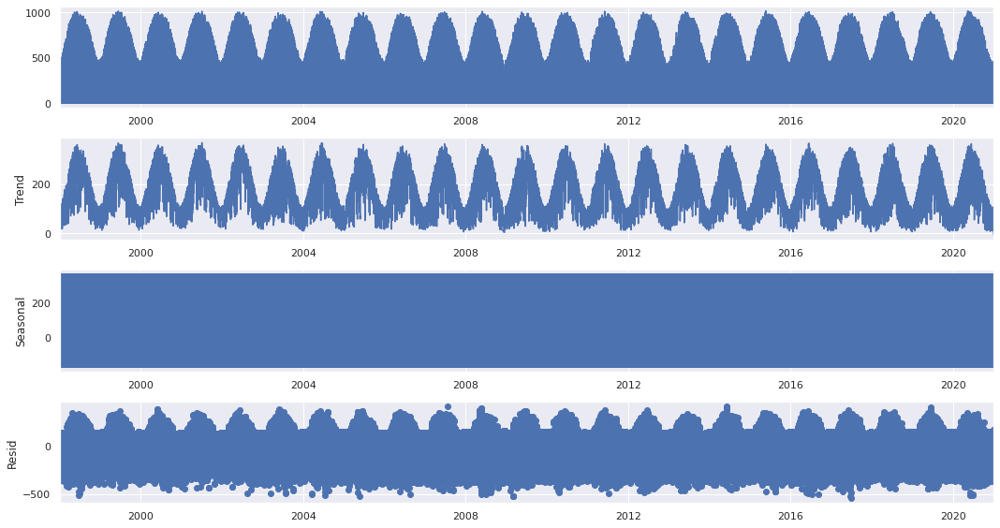

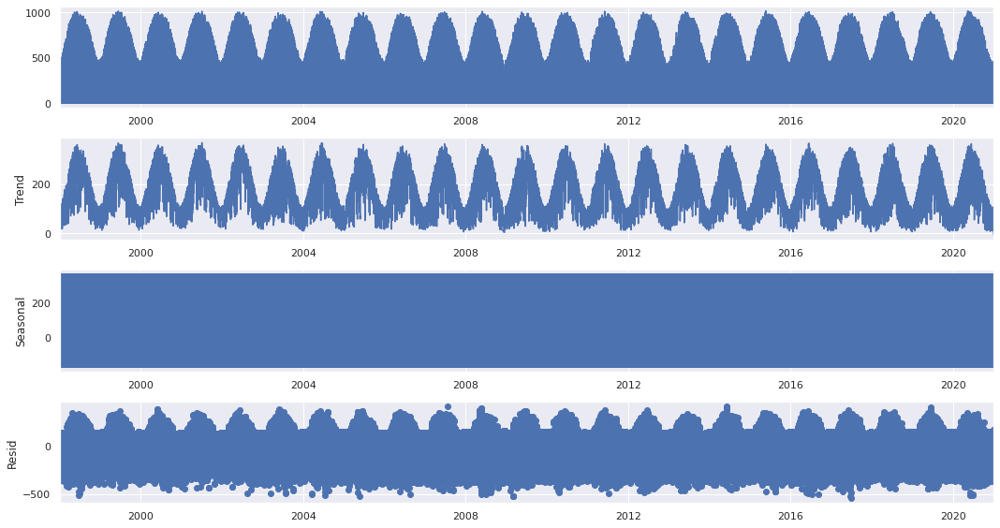

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

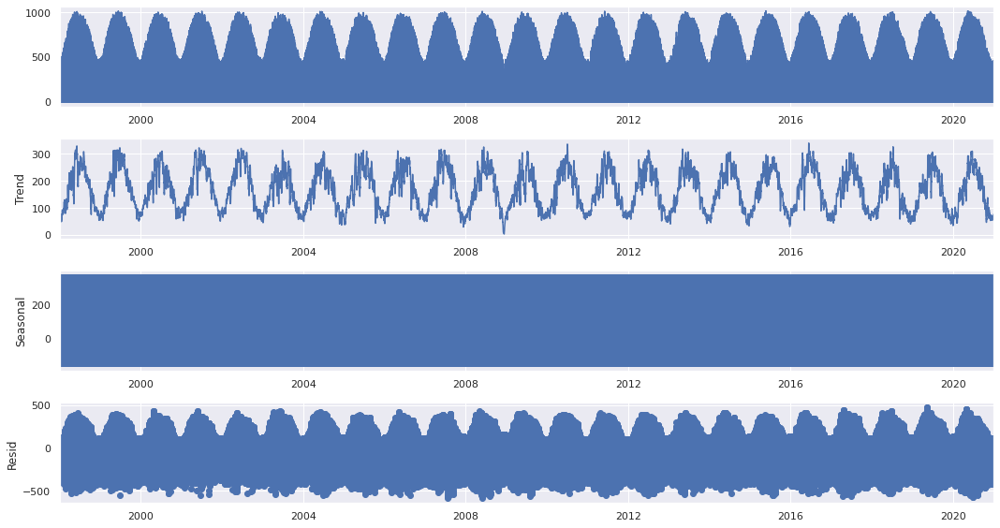

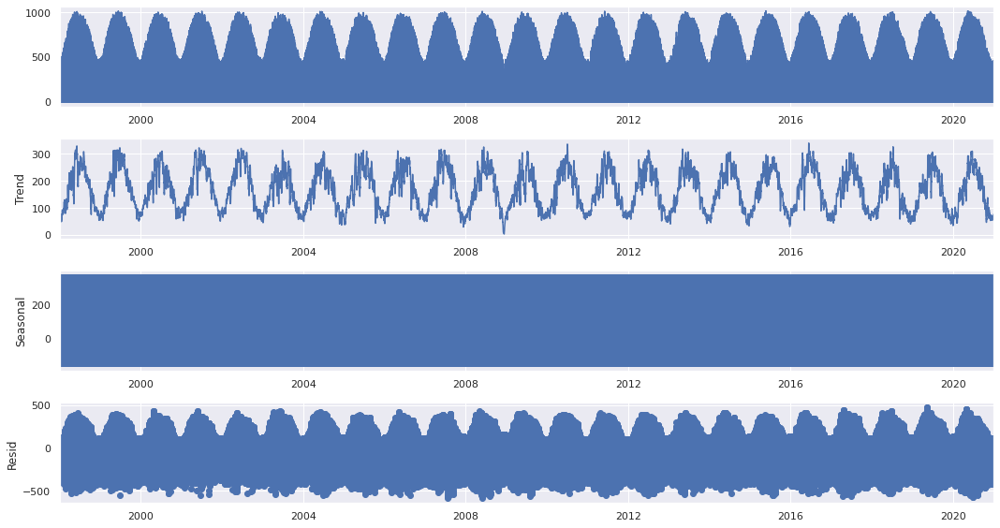

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

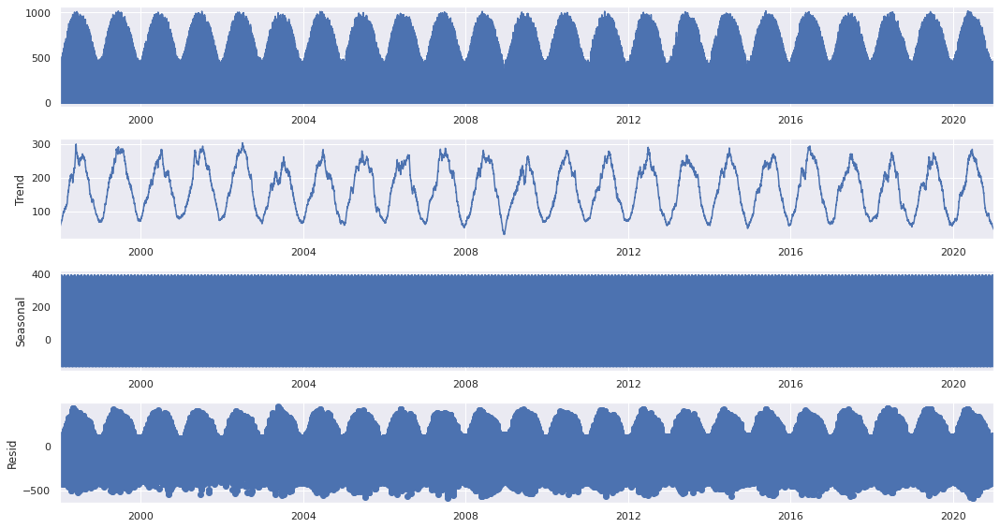

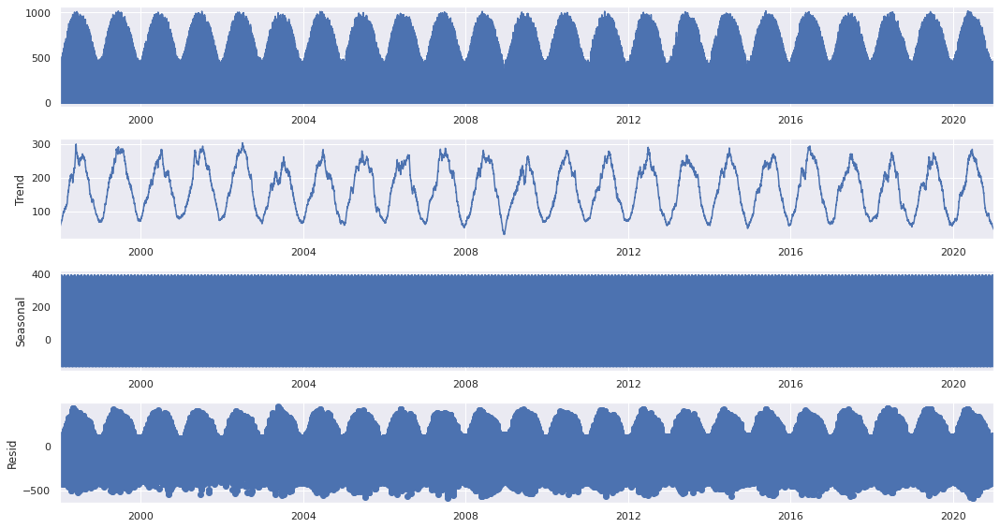

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

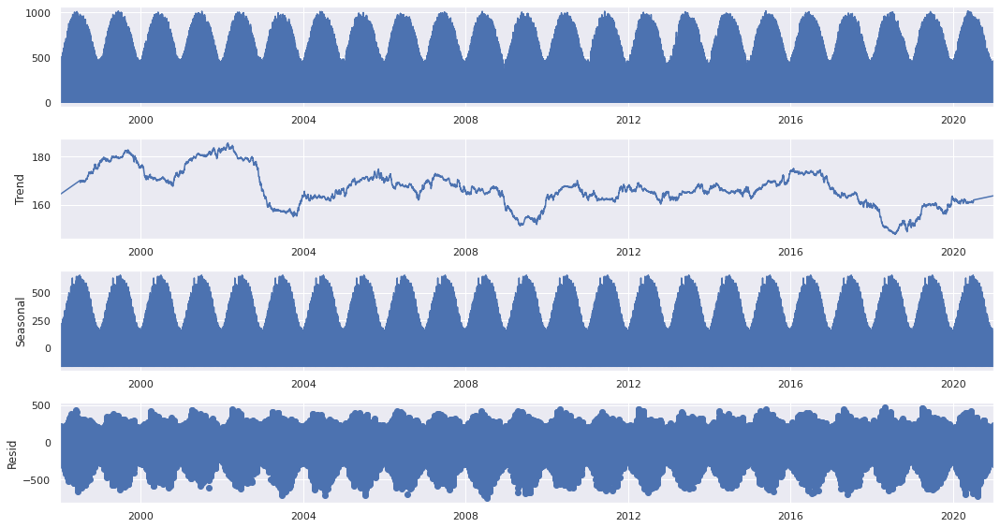

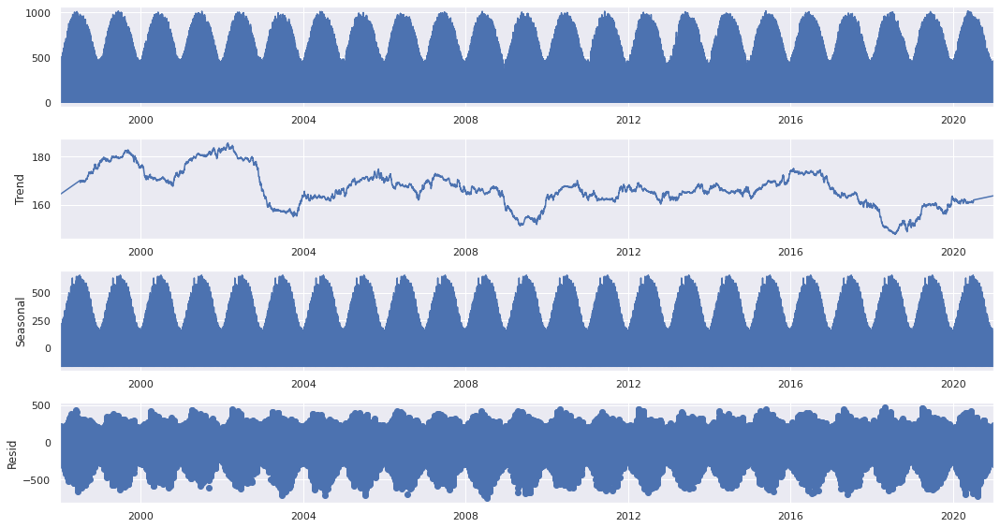

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*365)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

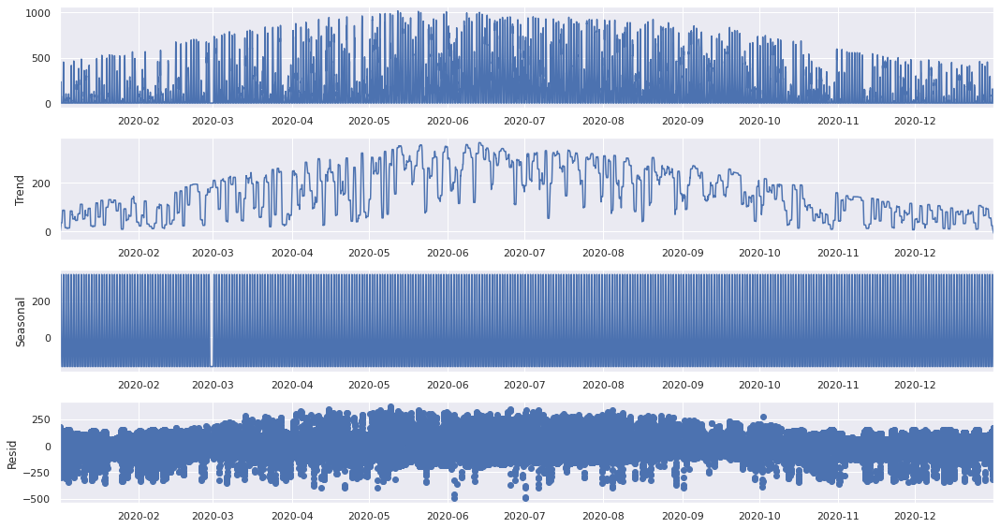

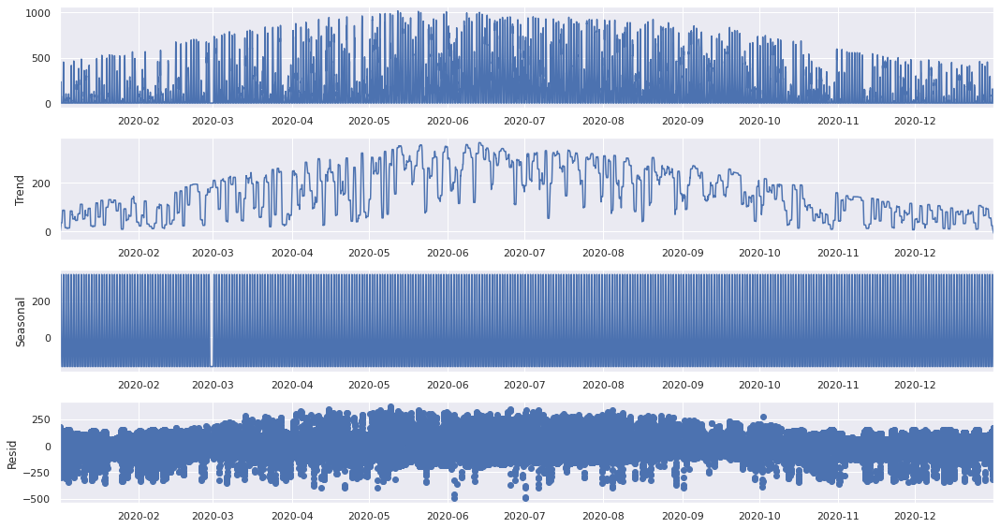

In [ ]:
maskd = (df.index > '2020-01-01') & (df.index <= '2021-01-01')
seasonality = df.loc[maskd]
seasonality = seasonality.dropna()
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

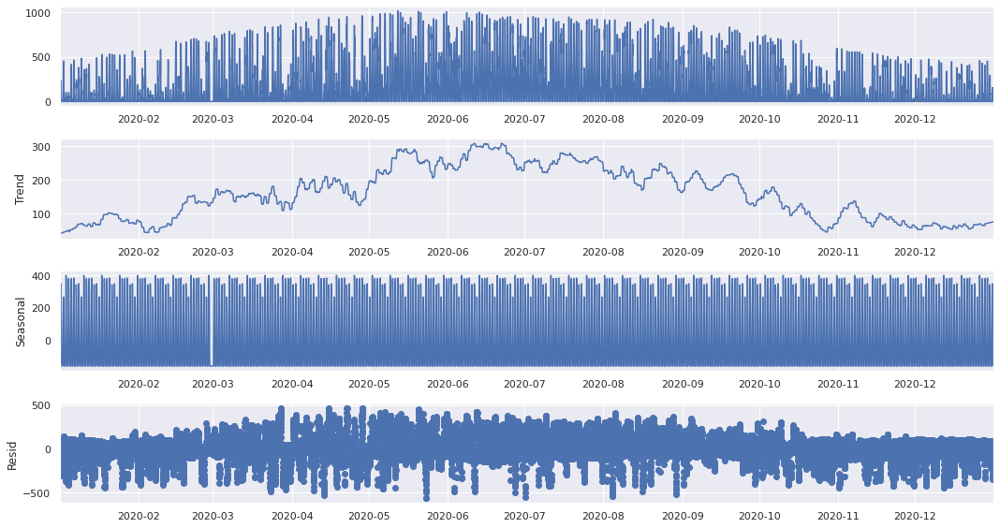

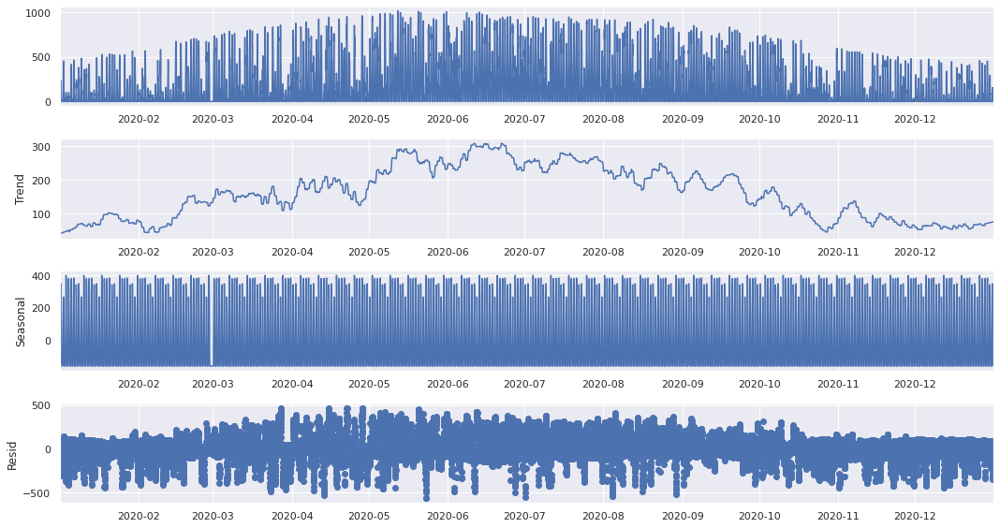

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

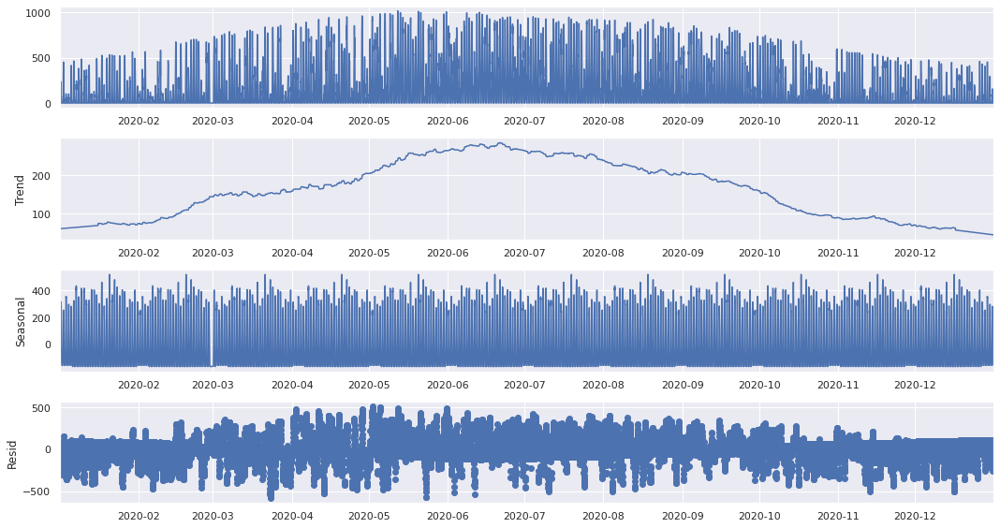

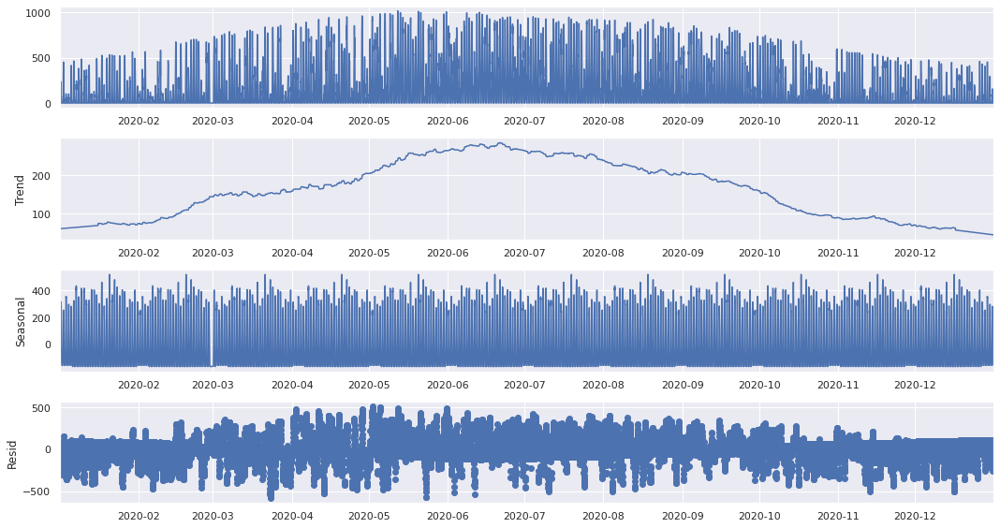

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

# **Box Plot and Histogram**

In [ ]:
Dailybox = df
Dailybox = Dailybox.reset_index()
Dailybox=Dailybox.resample('H',on='Date').mean()
Dailybox = Dailybox.reset_index()
Dailybox = Dailybox.resample('D', on='Date').sum()
Dailybox['Month'] = Dailybox.index.month_name()
Dailybox.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Month
Date,,,,,,,,,,,
1998-01-01,2462.0,2573.5,48.5,-232.5,2592.060,170.05,12.3670,6528.1,1786.185,-142.5,January
1998-01-02,1977.0,2468.0,100.5,-16.0,2590.470,136.10,26.5030,5769.0,2162.740,30.5,January
1998-01-03,1580.5,2459.0,98.0,71.5,2588.745,131.90,43.8655,5533.4,2312.250,99.5,January
1998-01-04,1667.0,2312.0,108.5,122.0,2586.900,57.70,59.4615,5312.3,2306.495,160.0,January
1998-01-05,1715.0,2491.0,84.0,127.5,2584.865,59.95,39.6905,3968.3,2399.035,145.5,January


<function matplotlib.pyplot.show(*args, **kw)>

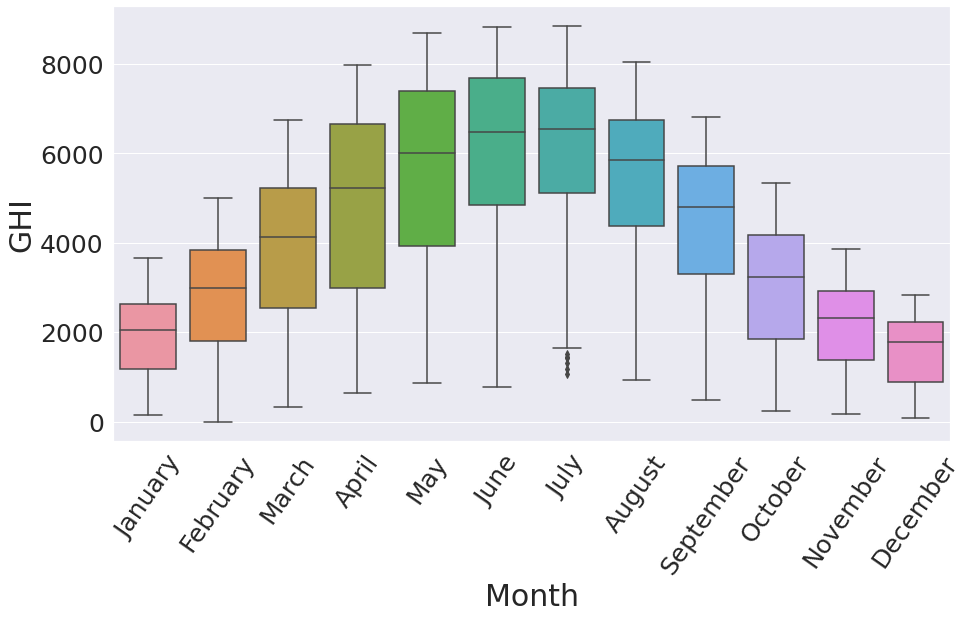

In [ ]:
q=sns.boxplot(x="Month",y="GHI",data=Dailybox)
q.set_xlabel("Month",fontsize=30)
q.set_ylabel("GHI",fontsize=30)
q.tick_params(labelsize=25, axis='x', rotation=55)
q.tick_params(labelsize=25, axis='y')
plt.show

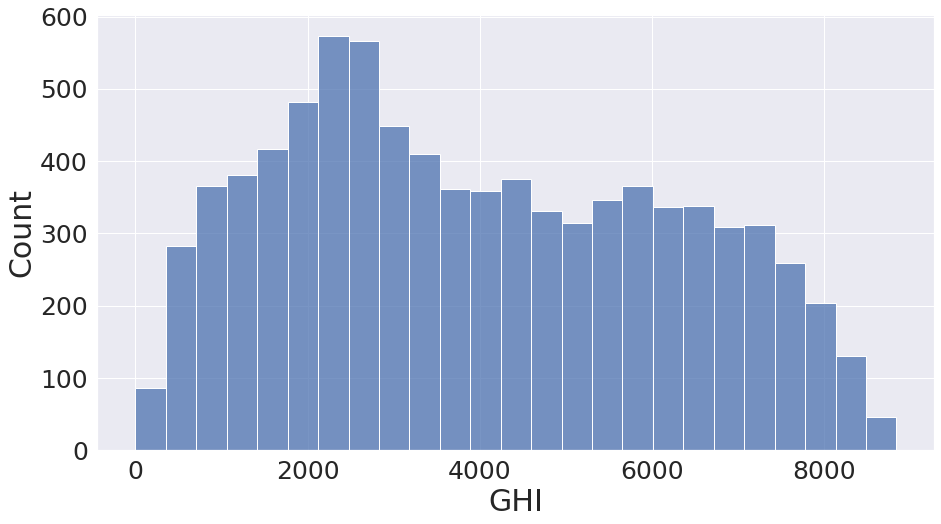

In [ ]:
q=sns.histplot(x='GHI', data=Dailybox, )
q.set_xlabel("GHI",fontsize=30)
q.set_ylabel("Count",fontsize=30)
q.tick_params(labelsize=25)
plt.show()

# **Feature Selection and Correlation Matrix**

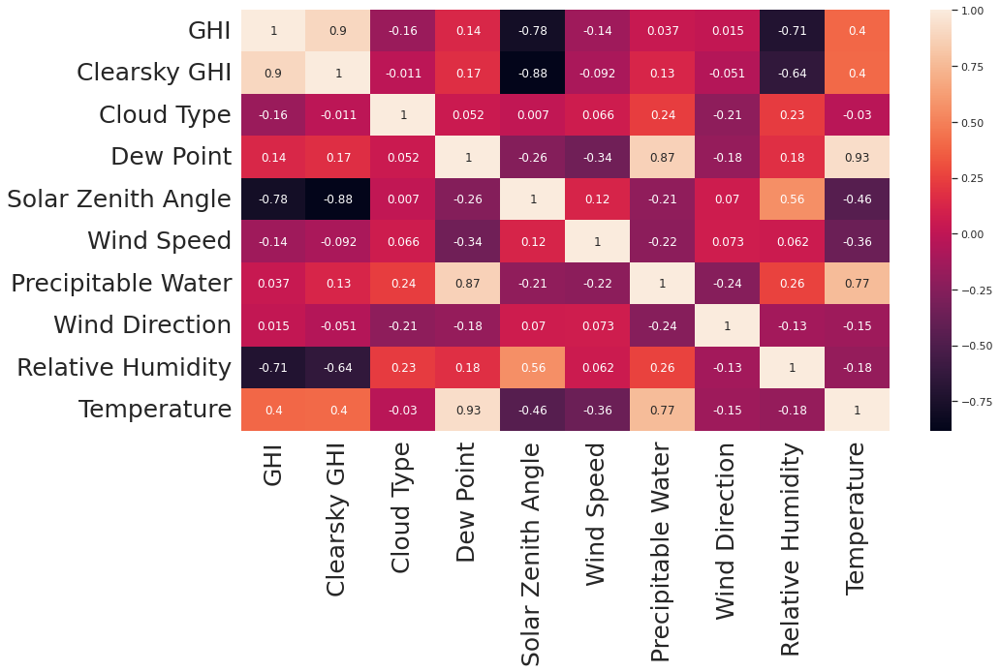

In [ ]:
corrMatrix = df.corr()
a = sns.heatmap(corrMatrix, annot=True)
a.tick_params(labelsize=25, axis='x')
a.tick_params(labelsize=25, axis='y')
plt.show()

In [ ]:
df = df.drop(labels = ['Dew Point',	'Wind Speed',	'Precipitable Water',	'Wind Direction'], axis=1)
df.head()

,GHI,Clearsky GHI,Cloud Type,Solar Zenith Angle,Relative Humidity,Temperature
Date,,,,,,
1998-01-01 00:00:00,0,0,0,162.28,73.43,-9.0
1998-01-01 00:30:00,0,0,0,161.15,73.47,-9.0
1998-01-01 01:00:00,0,0,0,158.19,76.58,-10.0
1998-01-01 01:30:00,0,0,0,154.01,76.60,-10.0
1998-01-01 02:00:00,0,0,0,149.13,80.81,-10.0


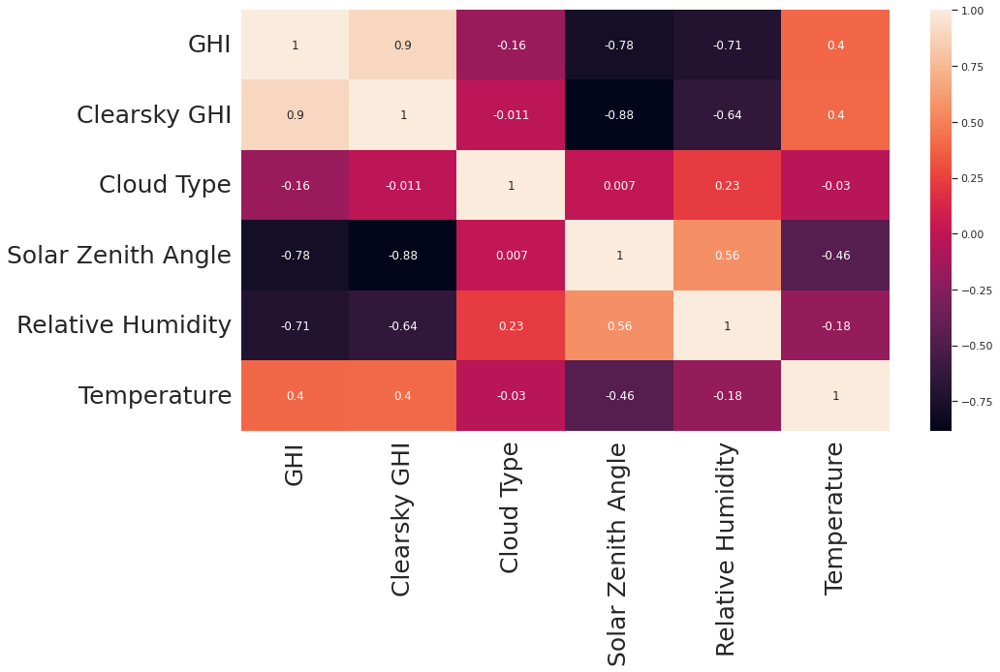

In [ ]:
corrMatrixUpdate = df.corr()
b = sns.heatmap(corrMatrixUpdate, annot=True)
b.tick_params(labelsize=25, axis='x', rotation=90 )
b.tick_params(labelsize=25, axis='y')
plt.show()

# **ONE HOT ENCODING**

In [ ]:
ohe = pd.get_dummies(df['Cloud Type'], drop_first=True)
ohe.columns = ['Probably Clear', 'Fog', 'Water', 'Super-Cooled Water', 'Mixed', 'Opaque Ice', 'Cirrus', 'Overlapping', 'Overshooting'] 
# (Clear Sky) is the first column which is dropped.  
ohe.head()

,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,
1998-01-01 00:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,0,0,0,0,0,0,0


In [ ]:
dfohe = pd.concat([df,ohe], axis = 'columns')
dfohe = dfohe.drop(['Cloud Type'], axis = 'columns')
dfohe.head(10)

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,,,,,,
1998-01-01 00:00:00,0,0,162.28,73.43,-9.0,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,161.15,73.47,-9.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,158.19,76.58,-10.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,154.01,76.60,-10.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,149.13,80.81,-10.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:30:00,0,0,143.85,80.83,-10.0,0,0,0,0,0,0,0,0,0
1998-01-01 03:00:00,0,0,138.35,79.32,-11.0,0,0,0,0,0,0,0,0,0
1998-01-01 03:30:00,0,0,132.73,79.35,-11.0,0,0,0,0,0,0,0,0,0
1998-01-01 04:00:00,0,0,127.05,77.95,-11.0,0,0,0,0,0,0,0,0,0


# **Clearness Index**

In [ ]:
df1 = dfohe
df1['clearness-index'] = df1['GHI'].astype(float) / df1['Clearsky GHI'].astype(float)
#df2=df1.between_time('08:00','16:30')
print(df1['clearness-index'].isna().sum())

202818


In [ ]:
dftemp = df1
df1 = df1.dropna()
df1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 08:00:00,73,73,84.55,77.94,-11.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 08:30:00,89,150,80.17,72.02,-9.0,0,0,0,1,0,0,0,0,0,0.593333
1998-01-01 09:00:00,225,225,76.15,75.47,-8.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 09:30:00,295,295,72.58,69.80,-7.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 10:00:00,354,354,69.51,71.77,-6.0,0,0,0,0,0,0,0,0,0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 14:30:00,53,270,72.66,87.27,4.2,0,0,0,0,0,1,0,0,0,0.196296
2020-12-31 15:00:00,61,204,76.23,86.14,4.0,0,0,0,0,0,1,0,0,0,0.299020
2020-12-31 15:30:00,31,134,80.22,88.68,3.6,0,0,0,0,0,1,0,0,0,0.231343


# **Seasonality Analysis**

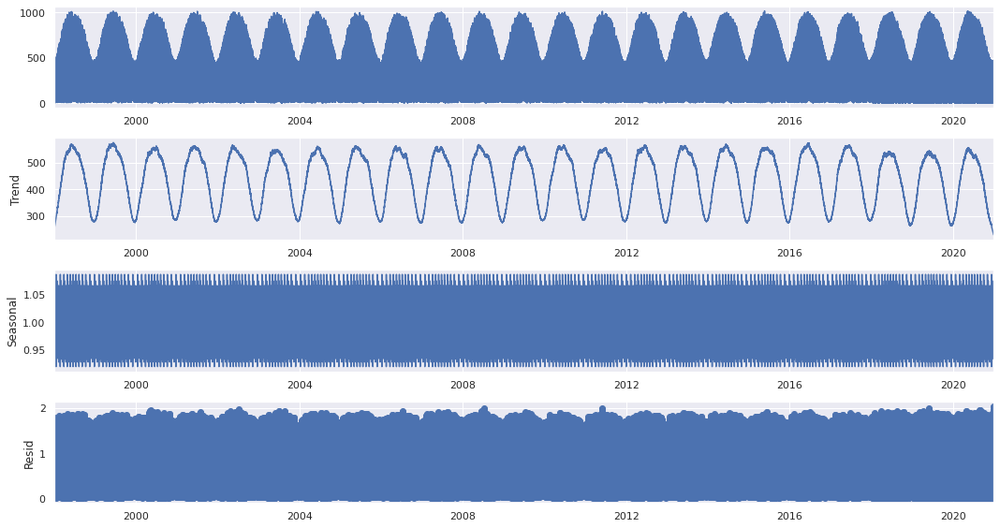

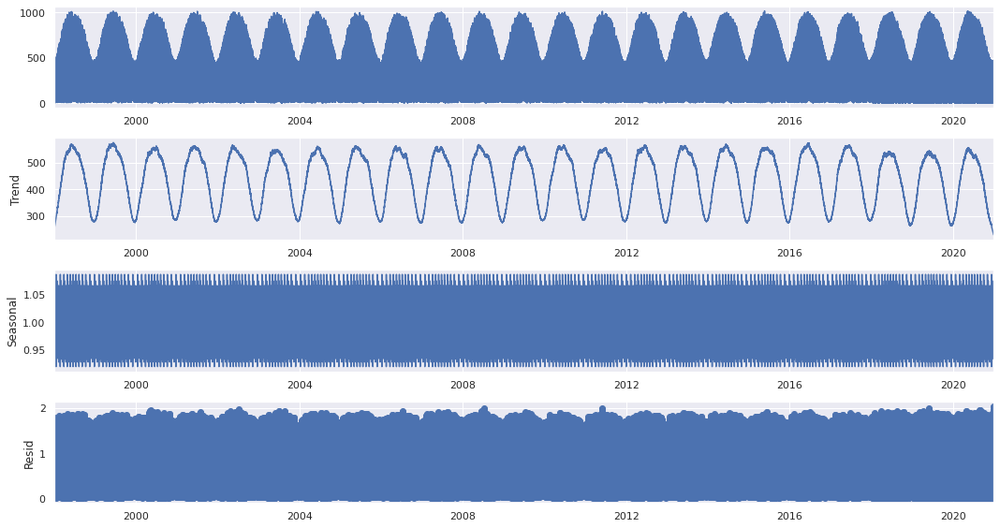

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df1[['Clearsky GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='multiplicative', extrapolate_trend='freq', period=25*30)

#trend = decompose_result_mult.trend
#seasonal = decompose_result_mult.seasonal
#residual = decompose_result_mult.resid

decompose_result_mult.plot()

<function matplotlib.pyplot.show(*args, **kw)>

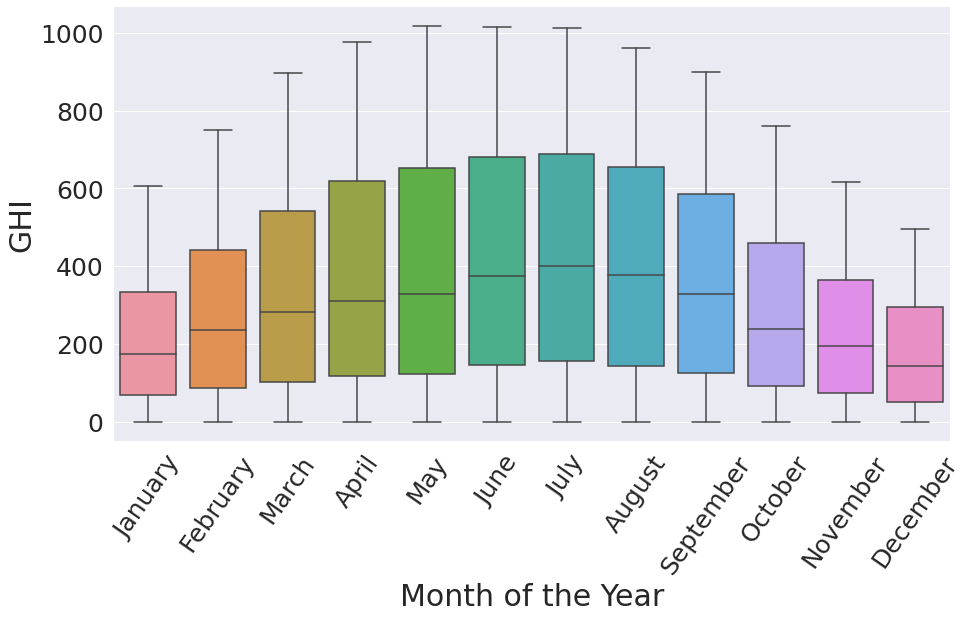

In [ ]:
df1box = dftemp
df1box['Month'] = df1box.index.month_name()
df1box = df1box.dropna()
r=sns.boxplot(x="Month",y="GHI",data=df1box)
r.set_xlabel("Month of the Year",fontsize=30)
r.set_ylabel("GHI",fontsize=30)
r.tick_params(labelsize=25, axis='x', rotation=55)
r.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

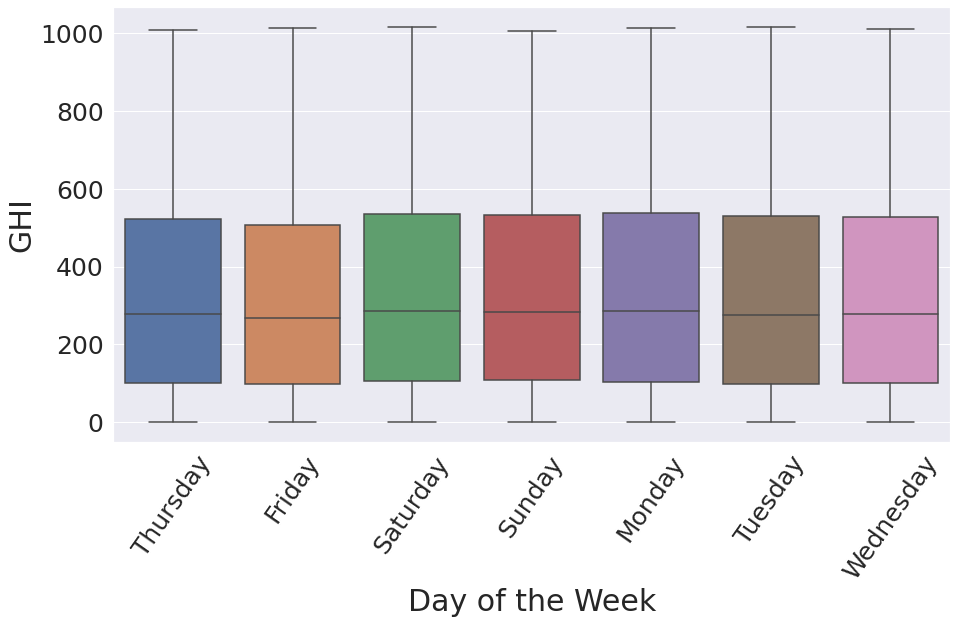

In [ ]:
df3box = dftemp
df3box['Month'] = df3box.index.day_name()
df3box = df3box.dropna()
t=sns.boxplot(x="Month",y="GHI",data=df3box)
t.set_xlabel("Day of the Week",fontsize=30)
t.set_ylabel("GHI",fontsize=30)
t.tick_params(labelsize=25, axis='x', rotation=55)
t.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

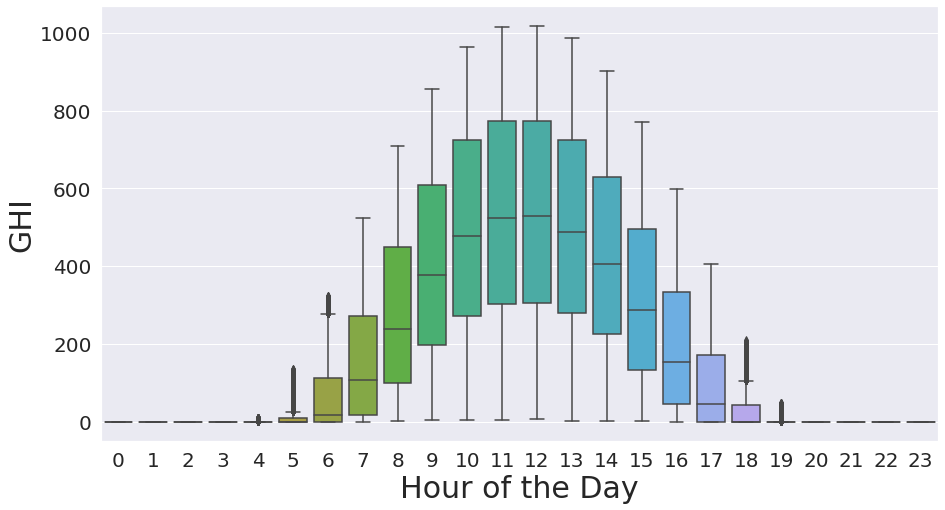

In [ ]:
df4box = df
df4box['Hour'] = df4box.index.hour
df4box = df4box.dropna()
u=sns.boxplot(x="Hour",y="GHI",data=df4box)
u.set_xlabel("Hour of the Day",fontsize=30)
u.set_ylabel("GHI",fontsize=30)
u.tick_params(labelsize=20)
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

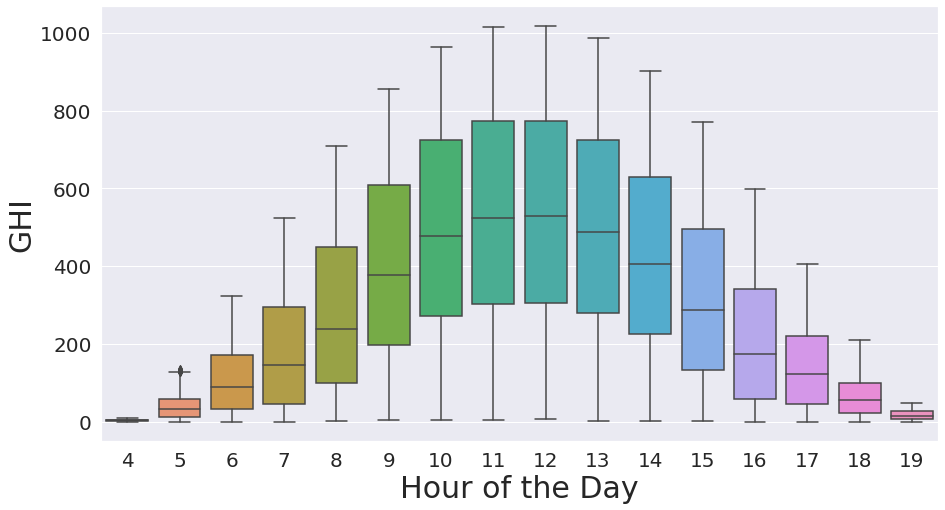

In [ ]:
df2box = dftemp
df2box['Hour'] = df2box.index.hour
df2box = df2box.dropna()
s=sns.boxplot(x="Hour",y="GHI",data=df2box)
s.set_xlabel("Hour of the Day",fontsize=30)
s.set_ylabel("GHI",fontsize=30)
s.tick_params(labelsize=20)
plt.show


# **Train Test Validation Split**

In [ ]:
#df1 = df1.drop(['Month'], axis = 'columns')
mask1 = (df1.index > '1998-01-01') & (df1.index <= '2018-12-29')
dftrain = df1.loc[mask1]
traindates = dftrain.index
dftrain.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 08:00:00,73,73,84.55,77.94,-11.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 08:30:00,89,150,80.17,72.02,-9.0,0,0,0,1,0,0,0,0,0,0.593333
1998-01-01 09:00:00,225,225,76.15,75.47,-8.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 09:30:00,295,295,72.58,69.80,-7.0,0,0,0,0,0,0,0,0,0,1.000000
1998-01-01 10:00:00,354,354,69.51,71.77,-6.0,0,0,0,0,0,0,0,0,0,1.000000


In [ ]:
mask2 = (df1.index > '2018-12-29') & (df1.index <= '2019-12-29')
dfval = df1.loc[mask2]
valdates = dfval.index
dfval.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2018-12-29 07:30:00,19,19,88.76,93.89,7.4,0,0,0,0,0,0,0,0,0,1.0
2018-12-29 08:00:00,76,76,84.32,89.55,7.6,0,0,0,0,0,0,0,0,0,1.0
2018-12-29 08:30:00,149,149,80.03,89.03,7.7,0,0,0,0,0,0,0,0,0,1.0
2018-12-29 09:00:00,222,222,76.07,82.08,7.8,0,0,0,0,0,0,0,0,0,1.0
2018-12-29 09:30:00,289,289,72.54,81.52,7.9,0,0,0,0,0,0,0,0,0,1.0


In [ ]:
mask3 = (df1.index > '2019-12-29') & (df1.index <= '2021-01-01')
dftest = df1.loc[mask3]
testdates = dftest.index
dftest.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2019-12-29 07:30:00,7,15,88.75,90.33,1.7,0,0,0,1,0,0,0,0,0,0.466667
2019-12-29 08:00:00,27,72,84.31,88.51,2.5,0,0,0,1,0,0,0,0,0,0.375000
2019-12-29 08:30:00,56,142,80.02,85.43,3.0,0,0,0,1,0,0,0,0,0,0.394366
2019-12-29 09:00:00,94,212,76.07,83.76,3.5,0,0,0,1,0,0,0,0,0,0.443396
2019-12-29 09:30:00,161,275,72.54,82.02,3.8,0,0,0,0,0,1,0,0,0,0.585455


# **K-means clustering**

In [ ]:
mask4 = (df1.index > '2020-01-01') & (df1.index <= '2021-01-01')
Daily = df1.loc[mask4]
Dailydates = Daily.index
testyear = Daily
Daily = Daily.reset_index()
Daily=Daily.resample('H',on='Date').mean()
testyear.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333
2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222
2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556
2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642
2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657


In [ ]:
Daily = Daily.reset_index()
Daily=Daily.resample('D',on='Date').sum()
Daily = Daily.drop(['clearness-index'], axis = 1)
Daily['clearness-index'] = Daily['GHI'].astype(float) / Daily['Clearsky GHI'].astype(float)
#print(Daily['clearness-index'].isna().sum())
Daily = Daily.dropna()
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01,845.0,2579.0,744.250,710.475,25.85,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.327646
2020-01-02,2109.0,2611.5,743.530,795.040,47.60,0.0,0.0,0.0,1.0,0.0,3.5,0.0,0.0,0.0,0.807582
2020-01-03,370.5,2379.5,742.795,942.535,73.25,0.0,0.0,0.0,8.0,0.0,0.5,1.5,0.0,0.0,0.155705
2020-01-04,347.5,2410.5,741.990,959.235,87.70,0.0,0.0,0.0,5.5,0.0,3.5,1.0,0.0,0.0,0.144161
2020-01-05,2034.5,2696.0,741.070,669.940,34.80,0.0,1.5,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.754636


[]

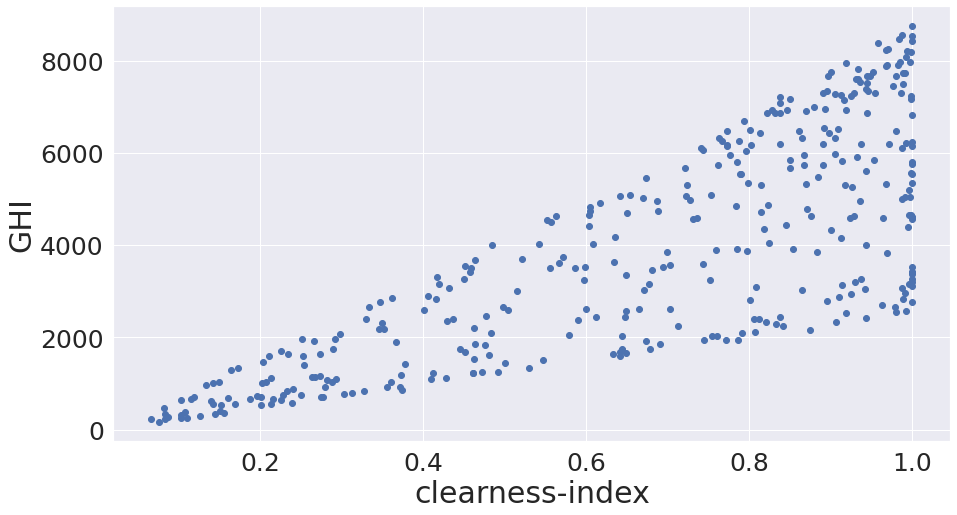

In [ ]:
from sklearn.cluster import KMeans
plt.scatter(Daily['clearness-index'], Daily['GHI'])
plt.xlabel('clearness-index')
plt.ylabel('GHI')
plt.plot()

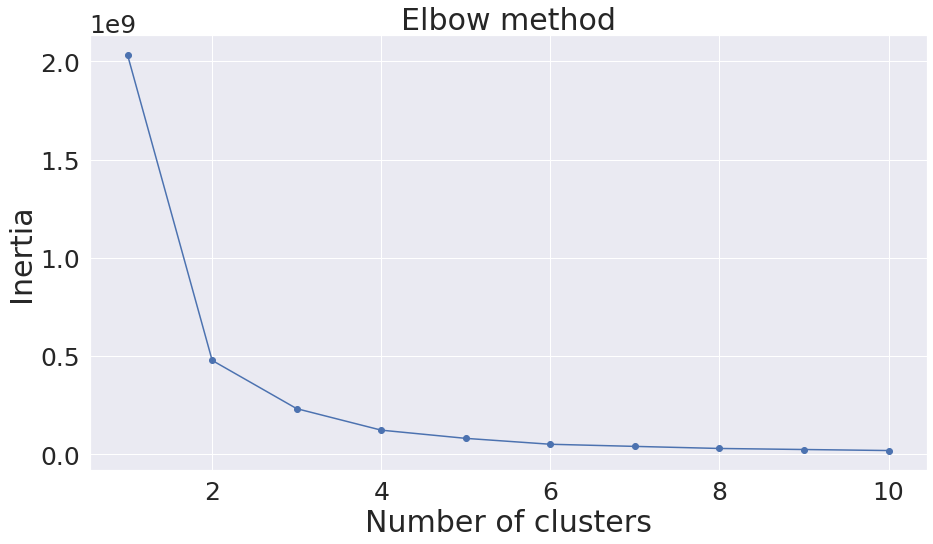

In [ ]:
data = list(zip(Daily['clearness-index'], Daily['GHI']))
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
km = KMeans(n_clusters=3)
clusters = km.fit_predict(Daily[['clearness-index', 'GHI']])
Daily['cluster'] = clusters
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,cluster
Date,,,,,,,,,,,,,,,,
2020-01-01,845.0,2579.0,744.250,710.475,25.85,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.327646,1
2020-01-02,2109.0,2611.5,743.530,795.040,47.60,0.0,0.0,0.0,1.0,0.0,3.5,0.0,0.0,0.0,0.807582,1
2020-01-03,370.5,2379.5,742.795,942.535,73.25,0.0,0.0,0.0,8.0,0.0,0.5,1.5,0.0,0.0,0.155705,1
2020-01-04,347.5,2410.5,741.990,959.235,87.70,0.0,0.0,0.0,5.5,0.0,3.5,1.0,0.0,0.0,0.144161,1
2020-01-05,2034.5,2696.0,741.070,669.940,34.80,0.0,1.5,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.754636,1


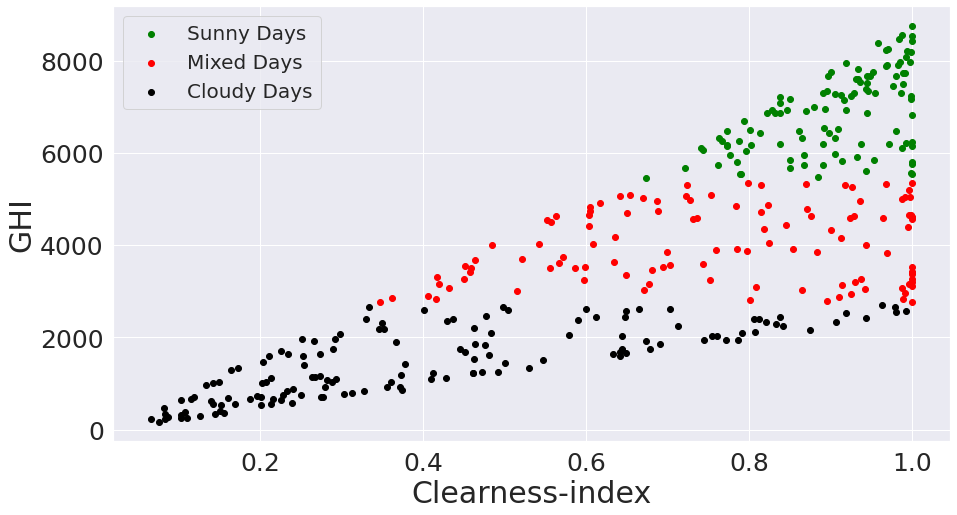

In [ ]:
cluster0 = Daily[Daily.cluster == 0]
cluster1 = Daily[Daily.cluster == 1]
cluster2 = Daily[Daily.cluster == 2]
grn = plt.scatter(cluster0['clearness-index'], cluster0['GHI'], color = 'green')
blk = plt.scatter(cluster1['clearness-index'], cluster1['GHI'], color = 'black')
red = plt.scatter(cluster2['clearness-index'], cluster2['GHI'], color = 'red')
plt.xlabel('Clearness-index')
plt.ylabel('GHI')
plt.legend((grn, red, blk),
           ('Sunny Days', 'Mixed Days', 'Cloudy Days'),
           scatterpoints=1,
           loc='upper left',
           ncol=1,
           fontsize=20)

In [ ]:
clus = 0
clum = 2
cluc = 1

In [ ]:
print(cluster0['cluster'].value_counts())
print(cluster1['cluster'].value_counts())
print(cluster2['cluster'].value_counts())

0    109
Name: cluster, dtype: int64
1    142
Name: cluster, dtype: int64
2    114
Name: cluster, dtype: int64


# **Data Normalization**

In [ ]:
cols1 = list(dftrain)[:]
cols2 = list(dfval)[:]
cols3 = list(dftest)[:]
dftrain = dftrain[cols1].astype(float)
dfval = dfval[cols2].astype(float)
dftest = dftest[cols3].astype(float)
dftrain.dtypes #, dfval.dtypes, dftest.dtypes

GHI                   float64
Clearsky GHI          float64
Solar Zenith Angle    float64
Relative Humidity     float64
Temperature           float64
Probably Clear        float64
Fog                   float64
Water                 float64
Super-Cooled Water    float64
Mixed                 float64
Opaque Ice            float64
Cirrus                float64
Overlapping           float64
Overshooting          float64
clearness-index       float64
dtype: object

In [ ]:
from sklearn.preprocessing import MinMaxScaler

Scaler = MinMaxScaler()
#Scalertr = Scaler.fit(dftrain)
#dftrain_scaled = Scalertr.transform(dftrain)
Scaler = Scaler.fit(dftrain)
dftrain_scaled = Scaler.transform(dftrain)

#Scalervl = Scaler.fit(dfval)
#dfval_scaled = Scalervl.transform(dfval)
dfval_scaled = Scaler.transform(dfval)

#Scalerts = Scaler.fit(dftest)
#dftest_scaled = Scalerts.transform(dftest)
dftest_scaled = Scaler.transform(dftest)

dftrain_scaled.shape, dfval_scaled.shape, dftest_scaled.shape

((181902, 15), (9093, 15), (9147, 15))

# **Tensors for models**

In [ ]:
n_past = 69

n_future = 1 
X_train = []
y_train = []

for i in range(n_past, len(dftrain_scaled) - n_future +1):
    X_train.append(dftrain_scaled[i - n_past:i, 0:dftrain_scaled.shape[1]])
    y_train.append(dftrain_scaled[i + n_future - 1:i + n_future, 0])

X_train, y_train = np.array(X_train), np.array(y_train)

print('X_train shape == {}.'.format(X_train.shape))
print('y_train shape == {}.'.format(y_train.shape))

n_future = 1 
X_val = []
y_val = []

for i in range(n_past, len(dfval_scaled) - n_future +1):
    X_val.append(dfval_scaled[i - n_past:i, 0:dfval_scaled.shape[1]])
    y_val.append(dfval_scaled[i + n_future - 1:i + n_future, 0])

X_val, y_val = np.array(X_val), np.array(y_val)

print('X_val shape == {}.'.format(X_val.shape))
print('y_val shape == {}.'.format(y_val.shape))

n_future = 1 
X_test = []
y_test = []

for i in range(n_past, len(dftest_scaled) - n_future +1):
    X_test.append(dftest_scaled[i - n_past:i, 0:dftest_scaled.shape[1]])
    y_test.append(dftest_scaled[i + n_future - 1:i + n_future, 0])

X_test, y_test = np.array(X_test), np.array(y_test)

print('X_test shape == {}.'.format(X_test.shape))
print('y_test shape == {}.'.format(y_test.shape))

X_train shape == (181833, 69, 15).
y_train shape == (181833, 1).
X_val shape == (9024, 69, 15).
y_val shape == (9024, 1).
X_test shape == (9078, 69, 15).
y_test shape == (9078, 1).


# **LSTM**

In [ ]:
from keras.callbacks import ModelCheckpoint
# define the Autoencoder model

model = Sequential()
model.add(LSTM(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.1))
model.add(Dense(32))
#model.add(Dense(16))
#model.add(Dense(8))
model.add(Dense(y_train.shape[1]))
cp1 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/LSTMH7/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 69, 64)            20480     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 33,985
Trainable params: 33,985
Non-trainable params: 0
_________________________________________________________________


Epoch 1/30
45/45 [==============================] - ETA: 0s - loss: 0.2161 - mape: 381397.5625 - root_mean_squared_error: 0.2714
Epoch 1: val_loss improved from inf to 0.17581, saving model to /content/drive/MyDrive/FYP complete files/LSTMH7/
45/45 [==============================] - 21s 374ms/step - loss: 0.2161 - mape: 381397.5625 - root_mean_squared_error: 0.2714 - val_loss: 0.1758 - val_mape: 338346.8750 - val_root_mean_squared_error: 0.2128
Epoch 2/30
45/45 [==============================] - ETA: 0s - loss: 0.1282 - mape: 184065.9688 - root_mean_squared_error: 0.1649
Epoch 2: val_loss improved from 0.17581 to 0.08012, saving model to /content/drive/MyDrive/FYP complete files/LSTMH7/
45/45 [==============================] - 18s 396ms/step - loss: 0.1282 - mape: 184065.9688 - root_mean_squared_error: 0.1649 - val_loss: 0.0801 - val_mape: 91690.5391 - val_root_mean_squared_error: 0.1055
Epoch 3/30
45/45 [==============================] - ETA: 0s - loss: 0.0798 - mape: 63983.4414 - roo

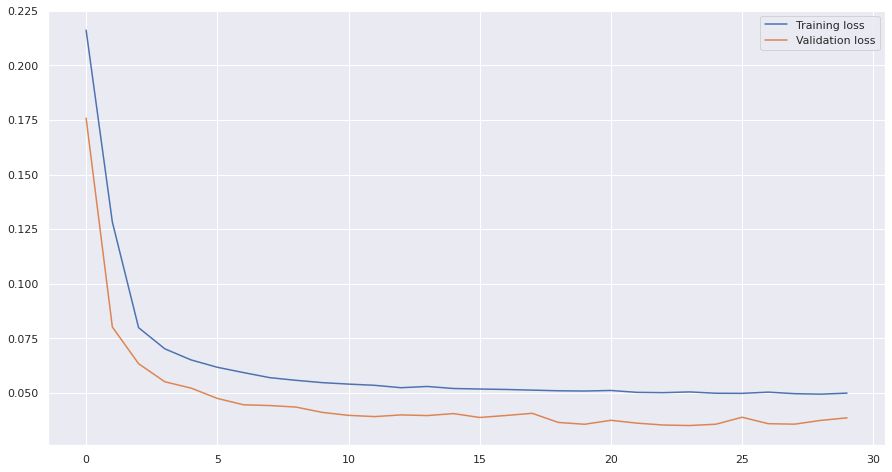

In [ ]:
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae' , metrics=['mape' ,tf.keras.metrics.RootMeanSquaredError()])

# fit the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp1])
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

# **LSTM analysis**

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/FYP complete files/LSTMH7/')

dftrain1 = dftrain
X_train1 = X_train
train_predictions1 = model.predict(X_train1)
prediction_copies1 = np.repeat(train_predictions1, dftrain1.shape[1], axis=-1)
#train_predictions1 = Scalertr.inverse_transform(prediction_copies1)[:,0]
train_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]

y_train1 = y_train
actual_copies1 = np.repeat(y_train1, dftrain1.shape[1], axis=-1)
#y_train1 = Scalertr.inverse_transform(actual_copies1)[:,0]
y_train1 = Scaler.inverse_transform(actual_copies1)[:,0]

train_predictions1 = train_predictions1.flatten()
y_train1 = y_train1.flatten()


5683/5683 [==============================] - 110s 19ms/step


In [ ]:
train_results1 = pd.DataFrame(data={'Train Predictions':train_predictions1, 'Actuals':y_train1, 'Date':traindates[69:]})
train_results1.set_index('Date', inplace = True)
train_results1.head()

,Train Predictions,Actuals
Date,,
1998-01-05 08:00:00,33.094597,62.0
1998-01-05 08:30:00,128.685104,132.0
1998-01-05 09:00:00,207.128357,57.0
1998-01-05 09:30:00,123.054779,105.0
1998-01-05 10:00:00,137.078461,121.0


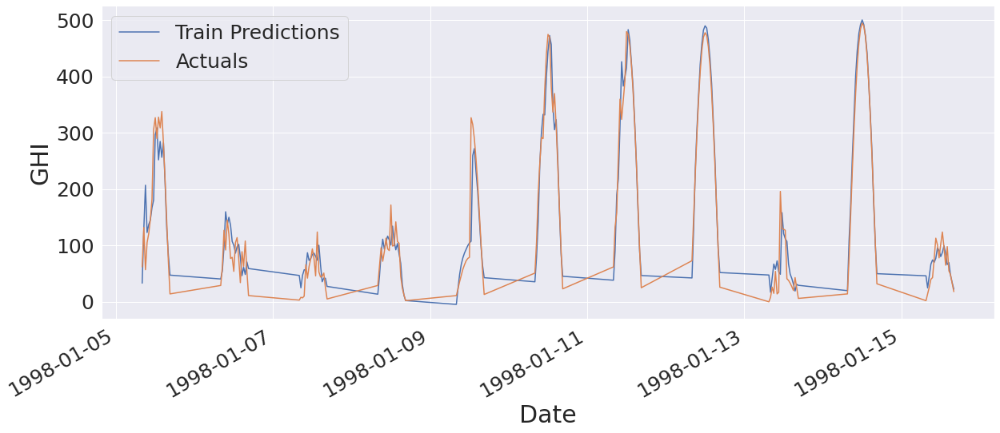

In [ ]:
train_results1['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval1 = dfval
X_val1 = X_val
val_predictions1 = model.predict(X_val1)
prediction_copies1 = np.repeat(val_predictions1, dfval1.shape[1], axis=-1)
#val_predictions1 = Scalervl.inverse_transform(prediction_copies1)[:,0]
val_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_val1 = y_val
actual_copies1 = np.repeat(y_val1, dfval1.shape[1], axis=-1)
#y_val1 = Scalervl.inverse_transform(actual_copies1)[:,0]
y_val1 = Scaler.inverse_transform(actual_copies1)[:,0]

val_predictions1 = val_predictions1.flatten()
y_val1 = y_val1.flatten()

val_results1 = pd.DataFrame(data={'Val Predictions':val_predictions1, 'Actuals':y_val1, 'Date':valdates[69:]})
val_results1.set_index('Date', inplace = True)
val_results1.head()

282/282 [==============================] - 5s 19ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 13:30:00,387.172211,353.0
2019-01-01 14:00:00,309.305969,248.0
2019-01-01 14:30:00,221.674072,190.0
2019-01-01 15:00:00,145.130890,143.0
2019-01-01 15:30:00,101.781097,90.0


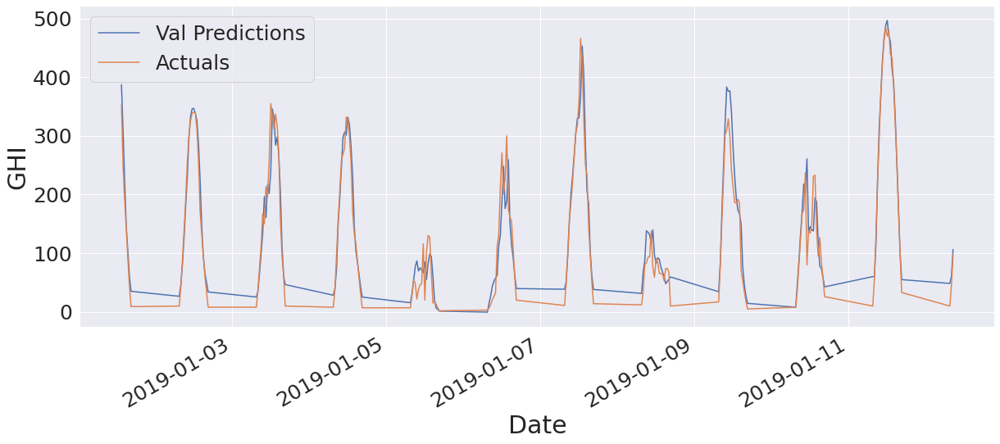

In [ ]:
val_results1['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest1 = dftest
X_test1 = X_test
test_predictions1 = model.predict(X_test1)
prediction_copies1 = np.repeat(test_predictions1, dftest1.shape[1], axis=-1)
#test_predictions1 = Scalerts.inverse_transform(prediction_copies1)[:,0]
test_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_test1 = y_test
actual_copies1 = np.repeat(y_test1, dftest1.shape[1], axis=-1)
#y_test1 = Scalerts.inverse_transform(actual_copies1)[:,0]
y_test1 = Scaler.inverse_transform(actual_copies1)[:,0]


y_test1 = y_test1.flatten()

test_results1 = pd.DataFrame(data={'Test Predictions':test_predictions1, 'Actuals':y_test1.flatten(), 'Date':testdates[69:]})
test_results1.set_index('Date', inplace = True)
Rsquared1 =r2_score(y_test1, test_predictions1)
mape1 = tf.keras.metrics.mean_absolute_percentage_error(y_test1, test_predictions1)
mae1 = tf.keras.metrics.mean_absolute_error(y_test1, test_predictions1)

m1 = tf.keras.metrics.RootMeanSquaredError()
m1.update_state(y_test1, test_predictions1)
rmse1 = m1.result().numpy()

#rmse1 =  tf.keras.metrics.RootMeanSquaredError(y_test1, test_predictions1)
mean1 =np.mean(y_test1)
test_results1, print('Rsqrared: ', Rsquared1), print('MAPE: ',mape1), print('MAE: ',mae1), print('RMSE: ',rmse1), print('Mean: ',mean1)

284/284 [==============================] - 5s 17ms/step
Rsqrared:  0.9542948584932354
MAPE:  tf.Tensor(33840780.0, shape=(), dtype=float32)
MAE:  tf.Tensor(36.306416, shape=(), dtype=float32)
RMSE:  57.676876
Mean:  311.24653007270325


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 13:30:00         95.348328     69.0
 2020-01-01 14:00:00         82.276222     68.0
 2020-01-01 14:30:00         70.685349     76.0
 2020-01-01 15:00:00         63.540375     58.0
 2020-01-01 15:30:00         46.463943     35.0
 ...                               ...      ...
 2020-12-31 14:30:00         93.348999     53.0
 2020-12-31 15:00:00         51.835098     61.0
 2020-12-31 15:30:00         41.797104     31.0
 2020-12-31 16:00:00         22.275105     15.0
 2020-12-31 16:30:00          9.507863      4.0
 
 [9078 rows x 2 columns], None, None, None, None, None)

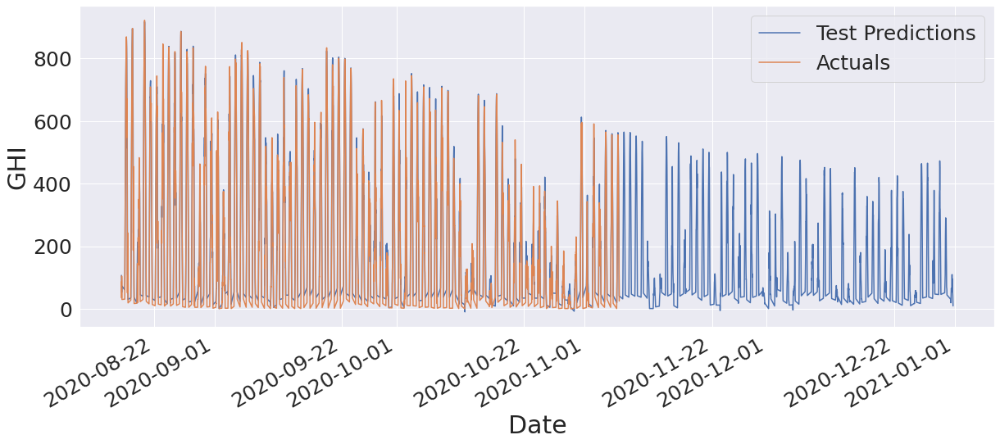

In [ ]:
test_results1['Test Predictions'][6000:].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][6000:8000].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

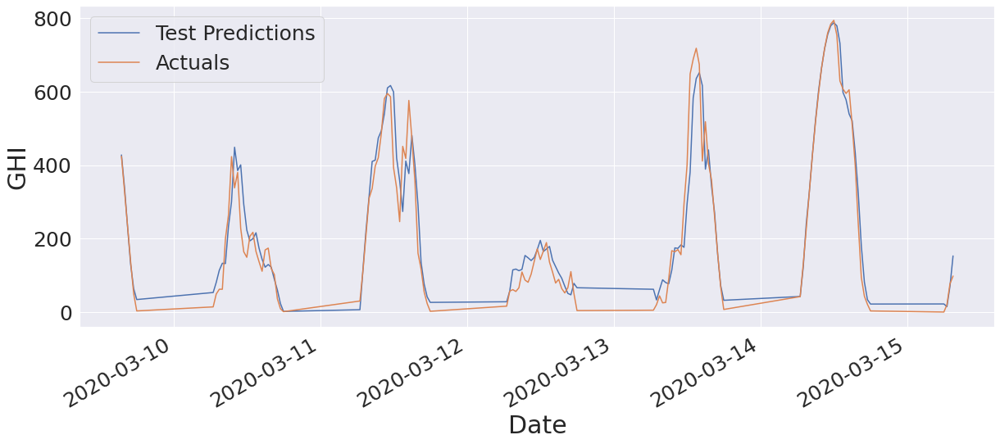

In [ ]:
test_results1['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

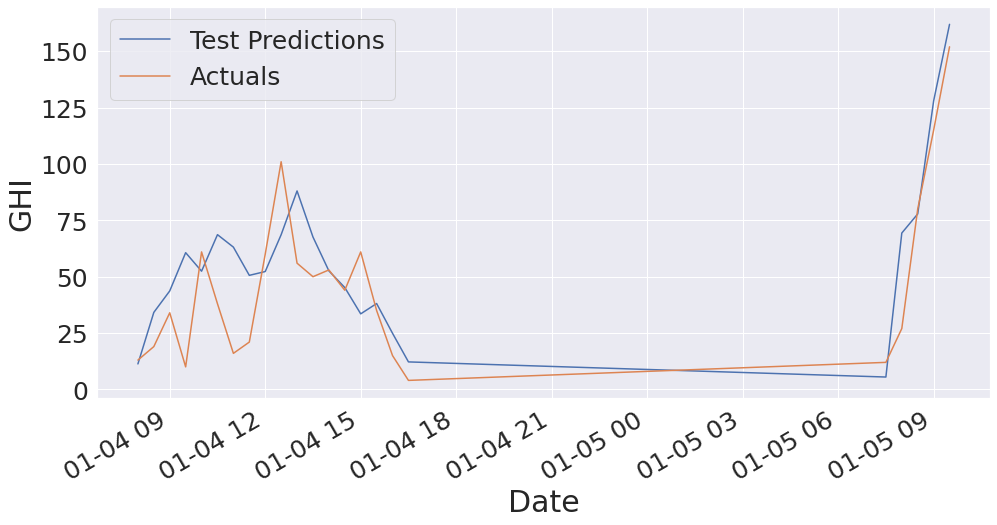

In [ ]:
test_results1['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results1['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results10 = test_results1
test_results1 = test_results1.reset_index()
test_results1 = test_results1.drop(['Date'], axis = 'columns')

In [ ]:
testyear = testyear.reset_index()
testyear

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
0,2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333
1,2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222
2,2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556
3,2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642
4,2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9085,2020-12-31 14:30:00,53,270,72.66,87.27,4.2,0,0,0,0,0,1,0,0,0,0.196296
9086,2020-12-31 15:00:00,61,204,76.23,86.14,4.0,0,0,0,0,0,1,0,0,0,0.299020
9087,2020-12-31 15:30:00,31,134,80.22,88.68,3.6,0,0,0,0,0,1,0,0,0,0.231343
9088,2020-12-31 16:00:00,15,65,84.55,87.41,3.2,0,0,0,0,0,1,0,0,0,0.230769


# **Daily Reults 1**

In [ ]:
testyear1 = pd.concat([testyear,test_results1], axis = 'columns')
testyear1.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333,95.348328,69.0
1,2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222,82.276222,68.0
2,2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556,70.685349,76.0
3,2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642,63.540375,58.0
4,2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657,46.463943,35.0


In [ ]:
testyear1 = testyear1.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4003.110596,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1587.806030,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,872.588806,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2836.265137,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3205.254883,3099.0


In [ ]:
#testyear1 = testyear1.dropna()
testyear1 = testyear1.drop("2020-02-29")
testyear1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4003.110596,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1587.806030,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,872.588806,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2836.265137,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3205.254883,3099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,4833,5121,1404.19,1210.05,22.3,0,0,0,2,0,2,0,0,0,17.109916,3039.053467,3109.0
2020-12-28,3184,4958,1403.37,1665.58,122.5,0,0,1,9,0,1,0,0,0,12.876131,4807.279785,4558.0
2020-12-29,4474,5312,1402.29,1195.87,34.1,0,1,0,6,0,0,0,0,0,16.264681,3467.092773,3307.0


In [ ]:
testyear1['cluster'] = clusters
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4003.110596,3695.0,1
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1587.806030,1349.0,1
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,872.588806,656.0,1
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2836.265137,2867.0,1
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3205.254883,3099.0,1


# **Dividing days according to clusters**

In [ ]:
 Fullyear1= testyear1[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap1 =  Fullyear1['Test Predictions'].to_numpy()
Fullyearac1 =  Fullyear1['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear1 =r2_score(Fullyearac1, Fullyeararrap1)
mapeFullyear1 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac1, Fullyeararrap1)
maeFullyear1 = tf.keras.metrics.mean_absolute_error(Fullyearac1, Fullyeararrap1)

mFullyear1 = tf.keras.metrics.RootMeanSquaredError()
mFullyear1.update_state(Fullyearac1, Fullyeararrap1)
rmseFullyear1 = mFullyear1.result().numpy()
meanFullyear1 =np.mean(Fullyearac1)
print('Rsqrared: ', RsquaredFullyear1), print('MAPE: ',mapeFullyear1), print('MAE: ',maeFullyear1), print('RMSE: ',rmseFullyear1), print('Mean: ',meanFullyear1)



Rsqrared:  0.9899451303797298
MAPE:  tf.Tensor(7.4577374, shape=(), dtype=float32)
MAE:  tf.Tensor(346.7509, shape=(), dtype=float32)
RMSE:  429.7411
Mean:  7741.084931506849


(None, None, None, None, None)

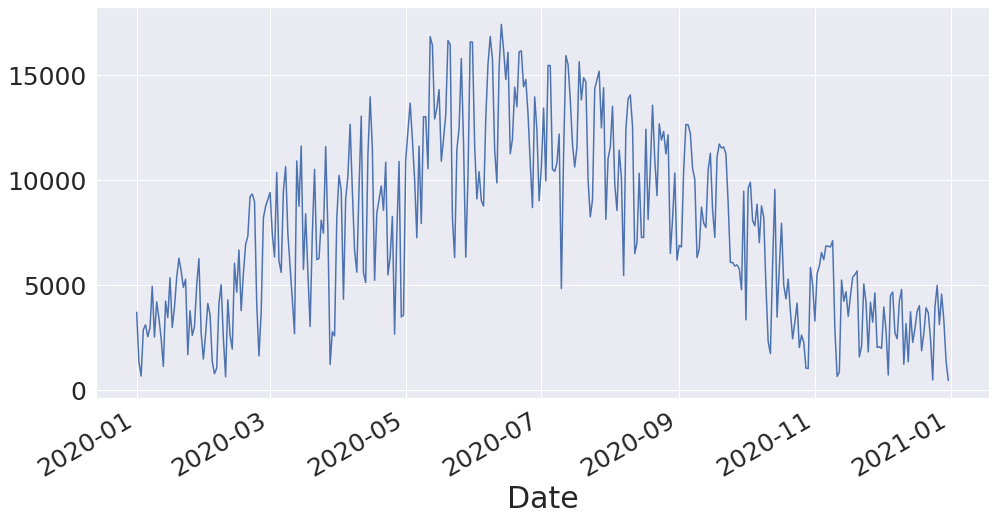

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')

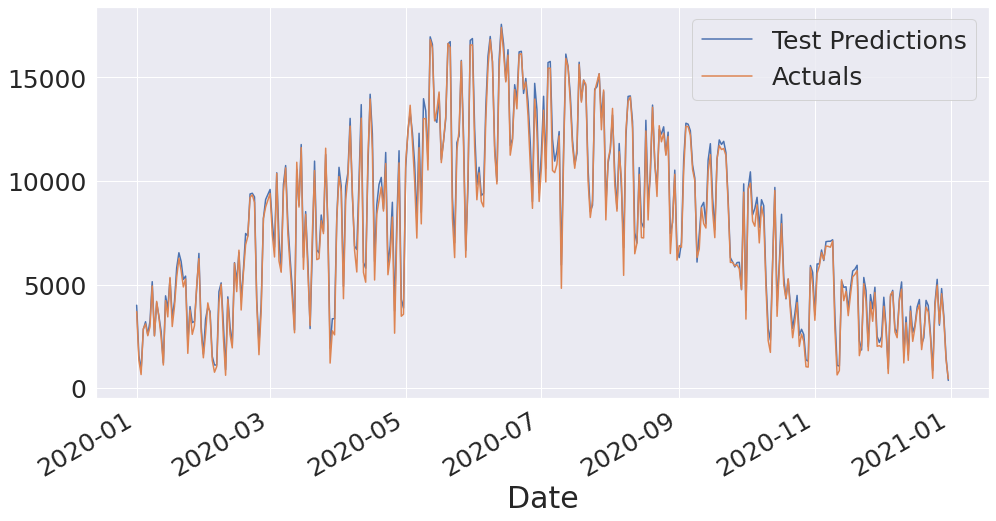

In [ ]:
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Clusters Sorting

In [ ]:
sunnydays1 = testyear1[testyear1.cluster == clus]
mixeddays1 = testyear1[testyear1.cluster == clum]
cloudydays1 = testyear1[testyear1.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-03-24,8359.119141,8081.0
2020-03-26,11280.944336,11583.0
2020-03-27,7806.396484,7635.0
2020-04-01,10660.000000,10215.0
2020-04-02,9743.969727,9489.0
2020-04-06,13022.356445,12651.0
2020-04-07,9309.625000,9473.0
2020-04-11,13687.242188,13035.0
2020-04-14,10689.446289,11178.0


In [ ]:
sunnyarrap1 = sunnydays1['Test Predictions'].to_numpy()
sunnyac1 = sunnydays1['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny1 =r2_score(sunnyac1, sunnyarrap1)
mapesunny1 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac1, sunnyarrap1)
maesunny1 = tf.keras.metrics.mean_absolute_error(sunnyac1, sunnyarrap1)

msunny1 = tf.keras.metrics.RootMeanSquaredError()
msunny1.update_state(sunnyac1, sunnyarrap1)
rmsesunny1 = msunny1.result().numpy()
meansunny1 =np.mean(sunnyac1)
print('Rsqrared: ', Rsquaredsunny1), print('MAPE: ',mapesunny1), print('MAE: ',maesunny1), print('RMSE: ',rmsesunny1), print('Mean: ',meansunny1)



Rsqrared:  0.963692388574068
MAPE:  tf.Tensor(3.0531104, shape=(), dtype=float32)
MAE:  tf.Tensor(352.13654, shape=(), dtype=float32)
RMSE:  449.19803
Mean:  12701.165137614678


(None, None, None, None, None)

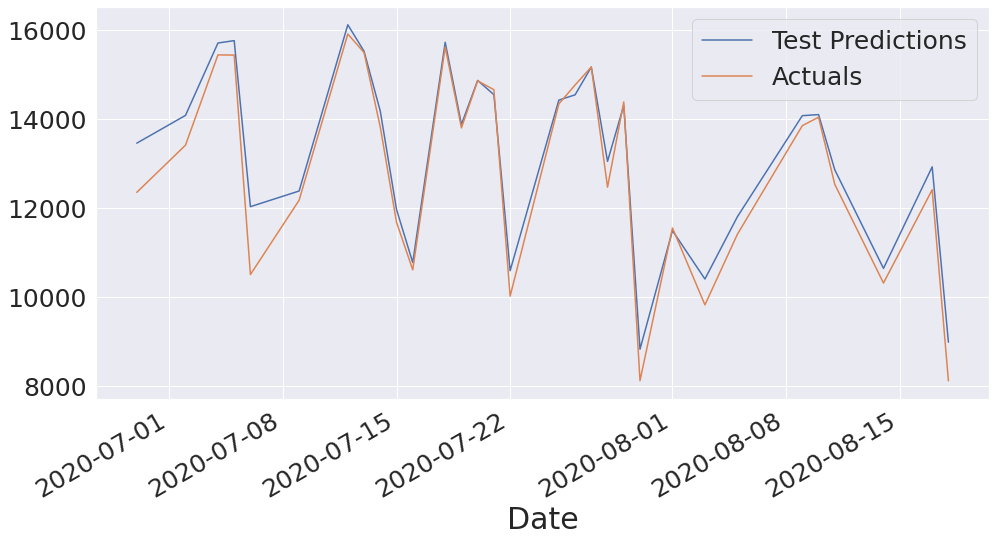

In [ ]:
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays1 = mixeddays1[['Test Predictions',	'Actuals']]
mixdays1

,Test Predictions,Actuals
Date,,
2020-01-15,3840.888916,3441.0
2020-01-17,3407.774170,2973.0
2020-01-20,6537.051270,6268.0
2020-01-21,6116.687500,5679.0
2020-01-22,5249.568359,4884.0
2020-01-24,2152.271729,1680.0
2020-01-29,6504.919922,6251.0
2020-01-30,2990.181641,2729.0
2020-02-03,3710.959961,3588.0


In [ ]:
mixarrap1 = mixeddays1['Test Predictions'].to_numpy()
mixac1 = mixeddays1['Actuals'].to_numpy()

In [ ]:
Rsquaredmix1 =r2_score(mixac1, mixarrap1)
mapemix1 = tf.keras.metrics.mean_absolute_percentage_error(mixac1, mixarrap1)
maemix1 = tf.keras.metrics.mean_absolute_error(mixac1, mixarrap1)

mmix1 = tf.keras.metrics.RootMeanSquaredError()
mmix1.update_state(mixac1, mixarrap1)
rmsemix1 = mmix1.result().numpy()
meanmix1 =np.mean(mixac1)
print('Rsqrared: ', Rsquaredmix1), print('MAPE: ',mapemix1), print('MAE: ',maemix1), print('RMSE: ',rmsemix1), print('Mean: ',meanmix1)



Rsqrared:  0.9670881667645169
MAPE:  tf.Tensor(6.4339595, shape=(), dtype=float32)
MAE:  tf.Tensor(401.88068, shape=(), dtype=float32)
RMSE:  471.94217
Mean:  7682.105263157895


(None, None, None, None, None)

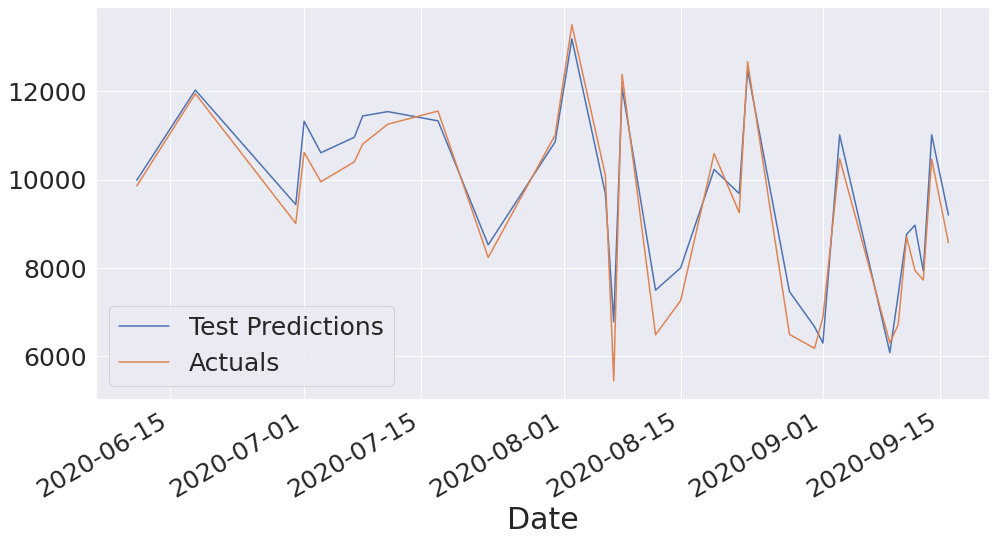

In [ ]:
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays1 = cloudydays1[['Test Predictions',	'Actuals']]
cloudydays1

,Test Predictions,Actuals
Date,,
2020-01-01,4003.110596,3695.0
2020-01-02,1587.806030,1349.0
2020-01-03,872.588806,656.0
2020-01-04,2836.265137,2867.0
2020-01-05,3205.254883,3099.0
2020-01-06,2583.932861,2531.0
2020-01-07,3239.221924,2969.0
2020-01-08,5139.974609,4935.0
2020-01-09,2540.682861,2518.0


In [ ]:
cloudyarrap1 = cloudydays1['Test Predictions'].to_numpy()
cloudyac1 = cloudydays1['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy1 =r2_score(cloudyac1, cloudyarrap1)
mapecloudy1 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac1, cloudyarrap1)
maecloudy1 = tf.keras.metrics.mean_absolute_error(cloudyac1, cloudyarrap1)

mcloudy1 = tf.keras.metrics.RootMeanSquaredError()
mcloudy1.update_state(cloudyac1, cloudyarrap1)
rmsecloudy1 = mcloudy1.result().numpy()
meancloudy1 =np.mean(cloudyac1)
print('Rsqrared: ', Rsquaredcloudy1), print('MAPE: ',mapecloudy1), print('MAE: ',maecloudy1), print('RMSE: ',rmsecloudy1), print('Mean: ',meancloudy1)

Rsqrared:  0.9685704881750063
MAPE:  tf.Tensor(11.660661, shape=(), dtype=float32)
MAE:  tf.Tensor(298.3576, shape=(), dtype=float32)
RMSE:  375.50162
Mean:  3981.049295774648


(None, None, None, None, None)

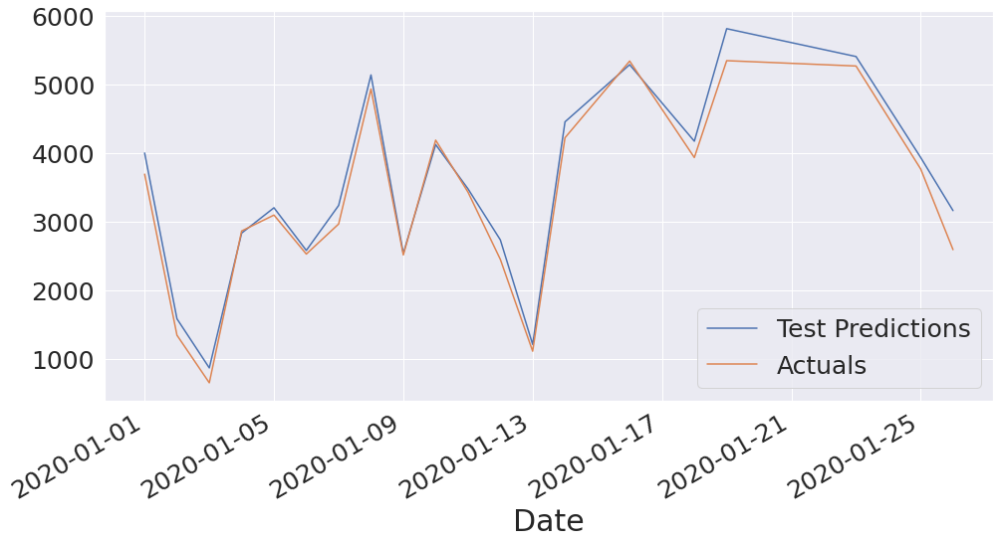

In [ ]:
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **GRU**

In [ ]:
from keras.layers import GRU
model2 = Sequential()
model2.add(GRU(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model2.add(GRU(32, activation='relu', return_sequences=False))
model2.add(Dropout(0.1))
model2.add(Dense(32))
#model2.add(Dense(16))
#model2.add(Dense(8))
model2.add(Dense(y_train.shape[1]))
cp2 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/GRU2/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model2.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 69, 64)            15552     
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 26,049
Trainable params: 26,049
Non-trainable params: 0
_________________________________________________________________


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 69, 64)            15552     
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 26,049
Trainable params: 26,049
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
45/45 [==============================] 

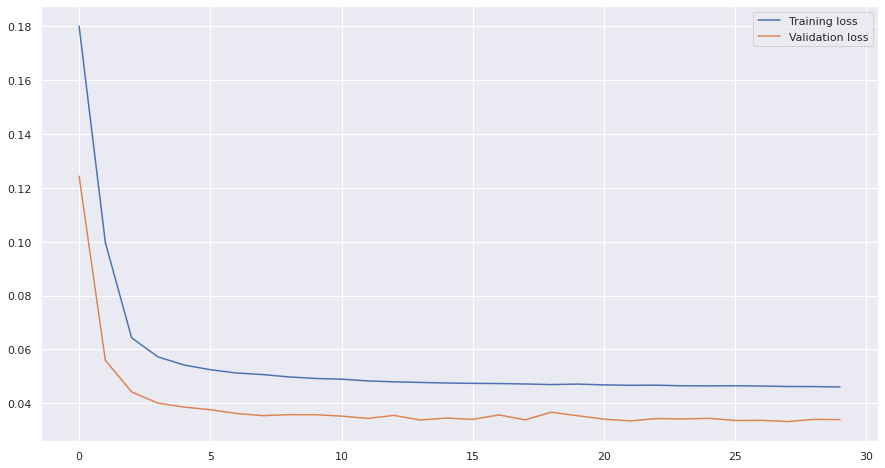

In [ ]:
model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model2.summary()
# fit the model
history2 = model2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp2])
plt.plot(history2.history['loss'], label='Training loss')
plt.plot(history2.history['val_loss'], label='Validation loss')
plt.legend()

# **GRU analysis**

In [ ]:
from keras.models import load_model
model2 = load_model('/content/drive/MyDrive/FYP complete files/GRU2/')

dftrain2 = dftrain
X_train2 = X_train
train_predictions2 = model2.predict(X_train2)
prediction_copies2 = np.repeat(train_predictions2, dftrain2.shape[1], axis=-1)
train_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]

y_train2 = y_train
actual_copies2 = np.repeat(y_train2, dftrain2.shape[1], axis=-1)
y_train2 = Scaler.inverse_transform(actual_copies2)[:,0]

train_predictions2 = train_predictions2.flatten()
y_train2 = y_train2.flatten()


5683/5683 [==============================] - 86s 15ms/step


In [ ]:
train_results2 = pd.DataFrame(data={'Train Predictions':train_predictions2, 'Actuals':y_train2, 'Date':traindates[69:]})
train_results2.set_index('Date', inplace = True)
train_results2.head()

,Train Predictions,Actuals
Date,,
1998-01-05 08:00:00,18.436392,62.0
1998-01-05 08:30:00,147.050278,132.0
1998-01-05 09:00:00,215.544937,57.0
1998-01-05 09:30:00,118.646339,105.0
1998-01-05 10:00:00,123.580971,121.0


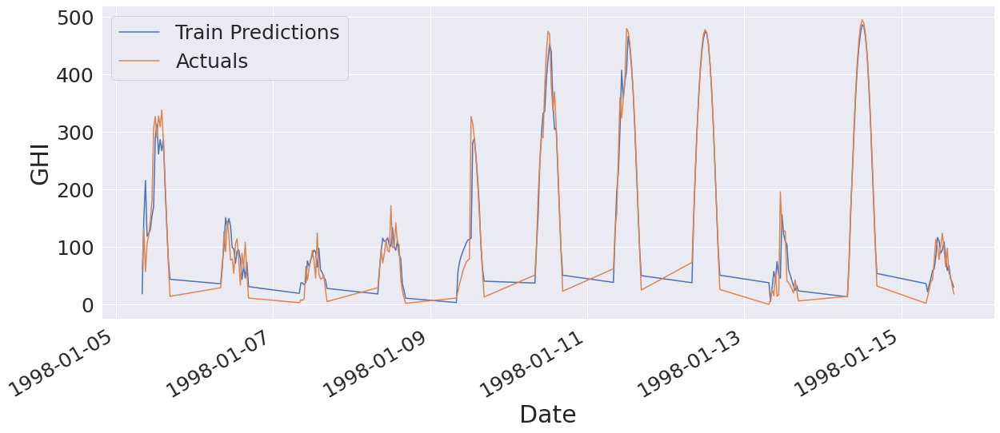

In [ ]:
train_results2['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval2 = dfval
X_val2 = X_val
val_predictions2 = model2.predict(X_val2)
prediction_copies2 = np.repeat(val_predictions2, dfval2.shape[1], axis=-1)
#val_predictions2 = Scalervl.inverse_transform(prediction_copies2)[:,0]
val_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_val2 = y_val
actual_copies2 = np.repeat(y_val2, dfval2.shape[1], axis=-1)
#y_val2 = Scalervl.inverse_transform(actual_copies2)[:,0]
y_val2 = Scaler.inverse_transform(actual_copies2)[:,0]

val_predictions2 = val_predictions2.flatten()
y_val2 = y_val2.flatten()

val_results2 = pd.DataFrame(data={'Val Predictions':val_predictions2, 'Actuals':y_val2, 'Date':valdates[69:]})
val_results2.set_index('Date', inplace = True)
val_results2.head()

282/282 [==============================] - 6s 22ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 13:30:00,384.856140,353.0
2019-01-01 14:00:00,315.667328,248.0
2019-01-01 14:30:00,225.039917,190.0
2019-01-01 15:00:00,149.286804,143.0
2019-01-01 15:30:00,83.105400,90.0


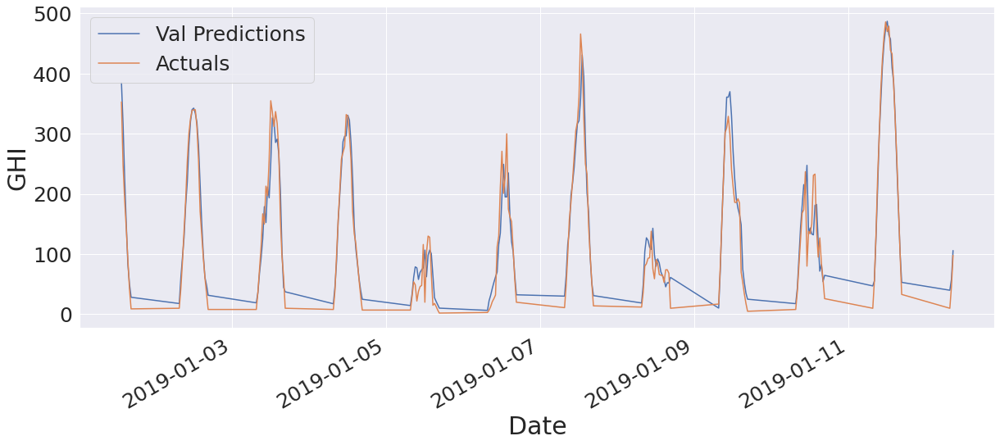

In [ ]:
val_results2['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest2 = dftest
X_test2 = X_test
test_predictions2 = model2.predict(X_test2)
prediction_copies2 = np.repeat(test_predictions2, dftest2.shape[1], axis=-1)
#test_predictions2 = Scalerts.inverse_transform(prediction_copies2)[:,0]
test_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_test2 = y_test
actual_copies2 = np.repeat(y_test2, dftest2.shape[1], axis=-1)
#y_test2 = Scalerts.inverse_transform(actual_copies2)[:,0]
y_test2 = Scaler.inverse_transform(actual_copies2)[:,0]


y_test2 = y_test2.flatten()

test_results2 = pd.DataFrame(data={'Test Predictions':test_predictions2, 'Actuals':y_test2.flatten(), 'Date':testdates[69:]})
test_results2.set_index('Date', inplace = True)
Rsquared2 =r2_score(y_test2, test_predictions2)
mape2 = tf.keras.metrics.mean_absolute_percentage_error(y_test2, test_predictions2)
mae2 = tf.keras.metrics.mean_absolute_error(y_test2, test_predictions2)

m2 = tf.keras.metrics.RootMeanSquaredError()
m2.update_state(y_test2, test_predictions2)
rmse2 = m2.result().numpy()

#rmse2 =  tf.keras.metrics.RootMeanSquaredError(y_test2, test_predictions2)
mean2 =np.mean(y_test2)
test_results2, print('Rsqrared: ', Rsquared2), print('MAPE: ',mape2), print('MAE: ',mae2), print('RMSE: ',rmse2), print('Mean: ',mean2)

284/284 [==============================] - 4s 14ms/step
Rsqrared:  0.9569719242946743
MAPE:  tf.Tensor(25899224.0, shape=(), dtype=float32)
MAE:  tf.Tensor(34.61481, shape=(), dtype=float32)
RMSE:  55.96225
Mean:  311.24653007270325


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 13:30:00         90.000053     69.0
 2020-01-01 14:00:00         82.428856     68.0
 2020-01-01 14:30:00         75.290672     76.0
 2020-01-01 15:00:00         72.739372     58.0
 2020-01-01 15:30:00         57.312115     35.0
 ...                               ...      ...
 2020-12-31 14:30:00         98.994041     53.0
 2020-12-31 15:00:00         51.289623     61.0
 2020-12-31 15:30:00         49.872250     31.0
 2020-12-31 16:00:00         26.250656     15.0
 2020-12-31 16:30:00         15.500977      4.0
 
 [9078 rows x 2 columns], None, None, None, None, None)

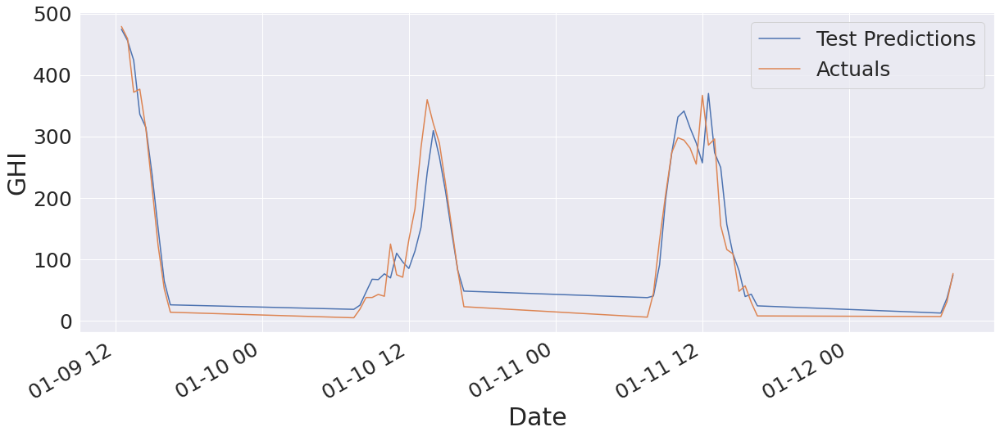

In [ ]:
test_results2['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

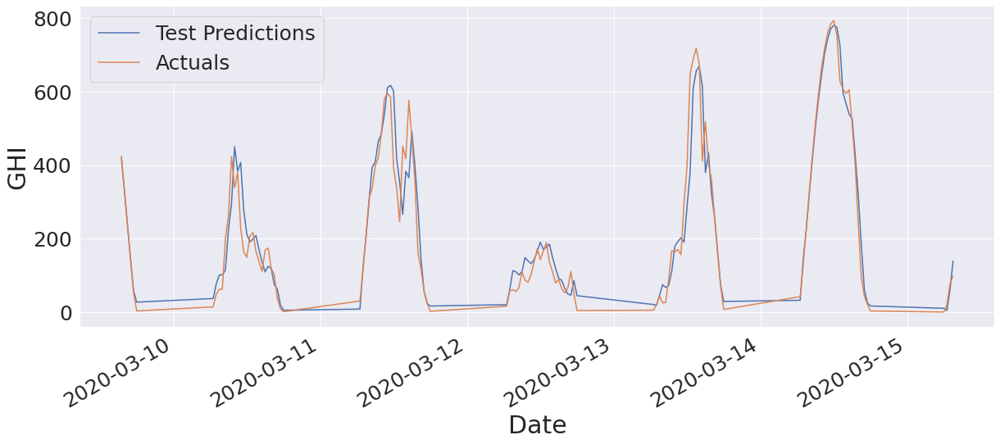

In [ ]:
test_results2['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

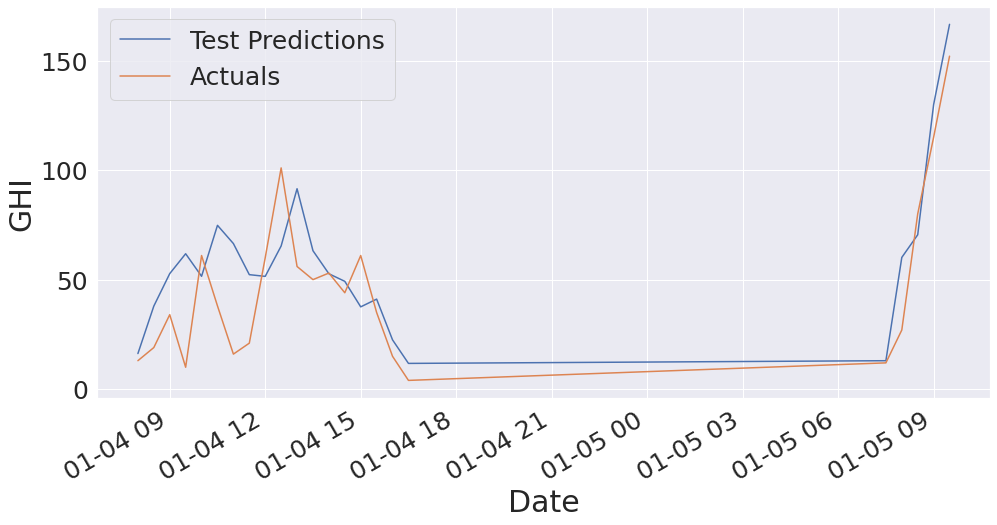

In [ ]:
test_results2['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results2['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results20 = test_results2
test_results2 = test_results2.reset_index()
test_results2 = test_results2.drop(['Date'], axis = 'columns')

# **Daily Reults GRU**

In [ ]:
testyear2 = pd.concat([testyear,test_results2], axis = 'columns')
testyear2.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333,90.000053,69.0
1,2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222,82.428856,68.0
2,2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556,75.290672,76.0
3,2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642,72.739372,58.0
4,2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657,57.312115,35.0


In [ ]:
testyear2 = testyear2.resample('D',on='Date').sum()

In [ ]:
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3969.075439,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1602.753784,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,908.123108,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2779.355225,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3178.451416,3099.0


In [ ]:
#testyear2 = testyear2.dropna()
testyear2 = testyear2.drop("2020-02-29")
testyear2

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3969.075439,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1602.753784,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,908.123108,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2779.355225,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3178.451416,3099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,4833,5121,1404.19,1210.05,22.3,0,0,0,2,0,2,0,0,0,17.109916,2983.952881,3109.0
2020-12-28,3184,4958,1403.37,1665.58,122.5,0,0,1,9,0,1,0,0,0,12.876131,4723.832520,4558.0
2020-12-29,4474,5312,1402.29,1195.87,34.1,0,1,0,6,0,0,0,0,0,16.264681,3313.642334,3307.0


In [ ]:
testyear2['cluster'] = clusters
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3969.075439,3695.0,1
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1602.753784,1349.0,1
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,908.123108,656.0,1
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2779.355225,2867.0,1
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3178.451416,3099.0,1


# **Dividing days according to clusters GRU**

In [ ]:
 Fullyear2= testyear2[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap2 =  Fullyear2['Test Predictions'].to_numpy()
Fullyearac2 =  Fullyear2['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear2 =r2_score(Fullyearac2, Fullyeararrap2)
mapeFullyear2 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac2, Fullyeararrap2)
maeFullyear2 = tf.keras.metrics.mean_absolute_error(Fullyearac2, Fullyeararrap2)

mFullyear2 = tf.keras.metrics.RootMeanSquaredError()
mFullyear2.update_state(Fullyearac2, Fullyeararrap2)
rmseFullyear2 = mFullyear2.result().numpy()
meanFullyear2 =np.mean(Fullyearac2)
print('Rsqrared: ', RsquaredFullyear2), print('MAPE: ',mapeFullyear2), print('MAE: ',maeFullyear2), print('RMSE: ',rmseFullyear2), print('Mean: ',meanFullyear2)



Rsqrared:  0.9940665771146731
MAPE:  tf.Tensor(5.870481, shape=(), dtype=float32)
MAE:  tf.Tensor(258.20538, shape=(), dtype=float32)
RMSE:  330.11963
Mean:  7741.084931506849


(None, None, None, None, None)

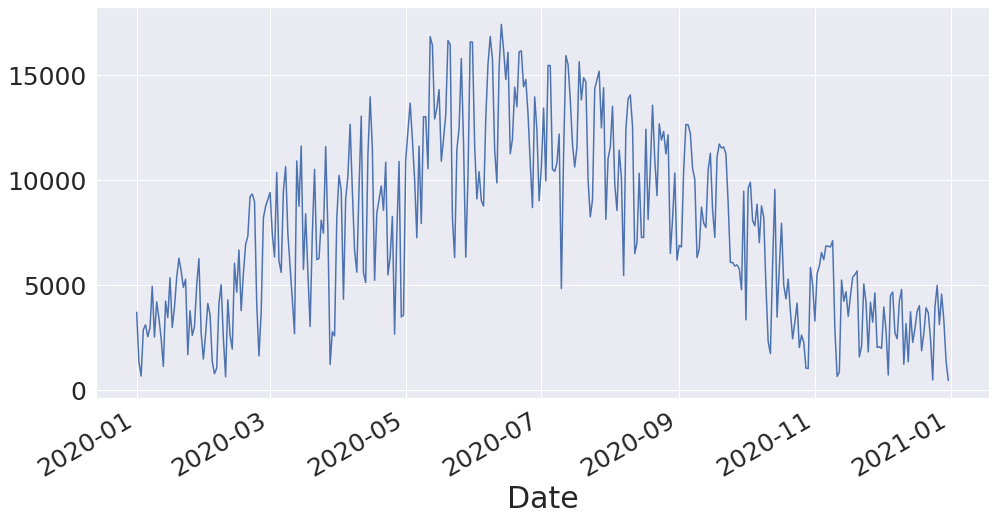

In [ ]:
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')

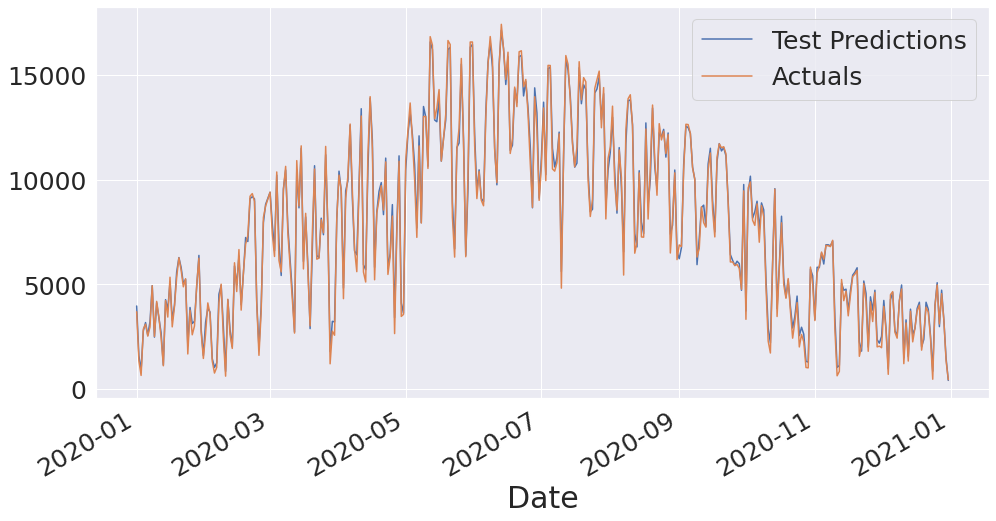

In [ ]:
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays2 = testyear2[testyear2.cluster == clus]
mixeddays2 = testyear2[testyear2.cluster == clum]
cloudydays2 = testyear2[testyear2.cluster == cluc]

In [ ]:
sunnydays2 = sunnydays2[['Test Predictions',	'Actuals']]
sunnydays2

,Test Predictions,Actuals
Date,,
2020-03-24,8158.971191,8081.0
2020-03-26,11184.411133,11583.0
2020-03-27,7661.166016,7635.0
2020-04-01,10402.608398,10215.0
2020-04-02,9463.726562,9489.0
2020-04-06,12597.697266,12651.0
2020-04-07,9113.894531,9473.0
2020-04-11,13382.115234,13035.0
2020-04-14,10489.971680,11178.0


In [ ]:
sunnyarrap2 = sunnydays2['Test Predictions'].to_numpy()
sunnyac2 = sunnydays2['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny2 =r2_score(sunnyac2, sunnyarrap2)
mapesunny2 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac2, sunnyarrap2)
maesunny2 = tf.keras.metrics.mean_absolute_error(sunnyac2, sunnyarrap2)

msunny2 = tf.keras.metrics.RootMeanSquaredError()
msunny2.update_state(sunnyac2, sunnyarrap2)
rmsesunny2 = msunny2.result().numpy()
meansunny2 =np.mean(sunnyac2)
print('Rsqrared: ', Rsquaredsunny2), print('MAPE: ',mapesunny2), print('MAE: ',maesunny2), print('RMSE: ',rmsesunny2), print('Mean: ',meansunny2)



Rsqrared:  0.9805561098926412
MAPE:  tf.Tensor(2.1623096, shape=(), dtype=float32)
MAE:  tf.Tensor(258.20358, shape=(), dtype=float32)
RMSE:  328.7234
Mean:  12701.165137614678


(None, None, None, None, None)

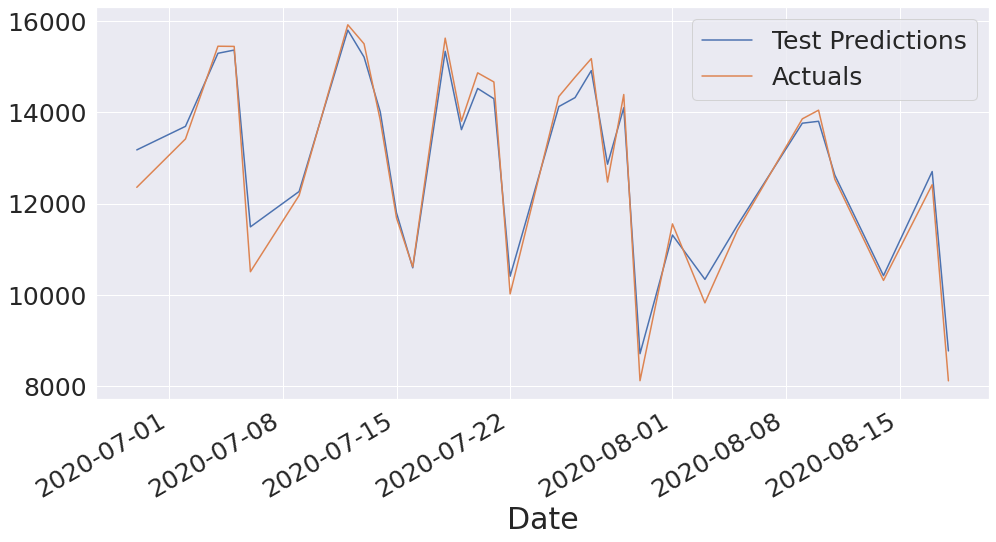

In [ ]:
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays2['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays2 = mixeddays2[['Test Predictions',	'Actuals']]
mixdays2

,Test Predictions,Actuals
Date,,
2020-01-15,3800.985107,3441.0
2020-01-17,3292.292236,2973.0
2020-01-20,6279.011719,6268.0
2020-01-21,5810.485840,5679.0
2020-01-22,5040.719238,4884.0
2020-01-24,2083.471924,1680.0
2020-01-29,6383.511719,6251.0
2020-01-30,2869.161133,2729.0
2020-02-03,3678.538086,3588.0


In [ ]:
mixarrap2 = mixeddays2['Test Predictions'].to_numpy()
mixac2 = mixeddays2['Actuals'].to_numpy()

In [ ]:
Rsquaredmix2 =r2_score(mixac2, mixarrap2)
mapemix2 = tf.keras.metrics.mean_absolute_percentage_error(mixac2, mixarrap2)
maemix2 = tf.keras.metrics.mean_absolute_error(mixac2, mixarrap2)

mmix2 = tf.keras.metrics.RootMeanSquaredError()
mmix2.update_state(mixac2, mixarrap2)
rmsemix2 = mmix2.result().numpy()
meanmix2 =np.mean(mixac2)
print('Rsqrared: ', Rsquaredmix2), print('MAPE: ',mapemix2), print('MAE: ',maemix2), print('RMSE: ',rmsemix2), print('Mean: ',meanmix2)



Rsqrared:  0.9799770832890207
MAPE:  tf.Tensor(4.641704, shape=(), dtype=float32)
MAE:  tf.Tensor(293.324, shape=(), dtype=float32)
RMSE:  368.109
Mean:  7682.105263157895


(None, None, None, None, None)

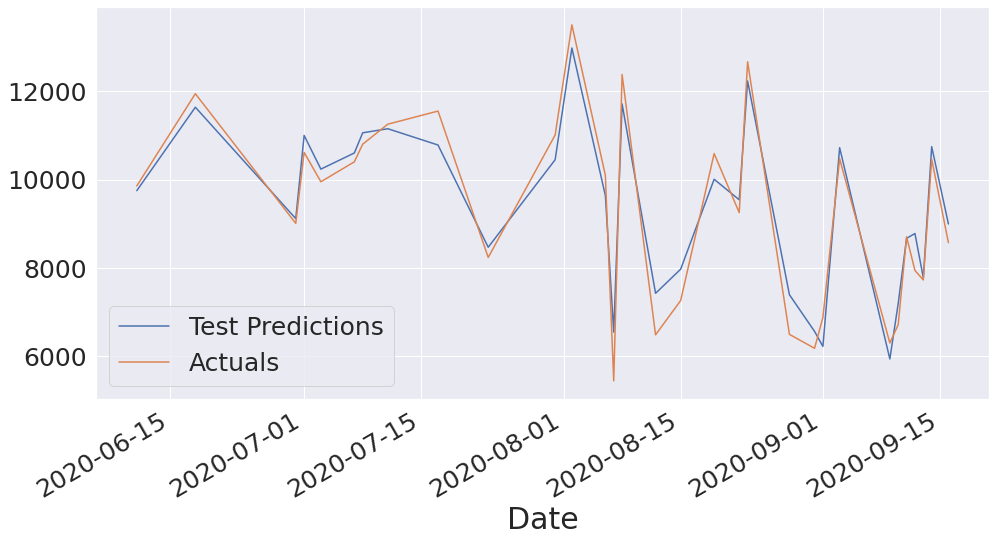

In [ ]:
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays2['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays2 = cloudydays2[['Test Predictions',	'Actuals']]
cloudydays2

,Test Predictions,Actuals
Date,,
2020-01-01,3969.075439,3695.0
2020-01-02,1602.753784,1349.0
2020-01-03,908.123108,656.0
2020-01-04,2779.355225,2867.0
2020-01-05,3178.451416,3099.0
2020-01-06,2571.265137,2531.0
2020-01-07,3230.592285,2969.0
2020-01-08,4938.738770,4935.0
2020-01-09,2482.870117,2518.0


In [ ]:
cloudyarrap2 = cloudydays2['Test Predictions'].to_numpy()
cloudyac2 = cloudydays2['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy2 =r2_score(cloudyac2, cloudyarrap2)
mapecloudy2 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac2, cloudyarrap2)
maecloudy2 = tf.keras.metrics.mean_absolute_error(cloudyac2, cloudyarrap2)

mcloudy2 = tf.keras.metrics.RootMeanSquaredError()
mcloudy2.update_state(cloudyac2, cloudyarrap2)
rmsecloudy2 = mcloudy2.result().numpy()
meancloudy2 =np.mean(cloudyac2)
print('Rsqrared: ', Rsquaredcloudy2), print('MAPE: ',mapecloudy2), print('MAE: ',maecloudy2), print('RMSE: ',rmsecloudy2), print('Mean: ',meancloudy2)

Rsqrared:  0.9802976566532762
MAPE:  tf.Tensor(9.703377, shape=(), dtype=float32)
MAE:  tf.Tensor(230.01292, shape=(), dtype=float32)
RMSE:  297.3048
Mean:  3981.049295774648


(None, None, None, None, None)

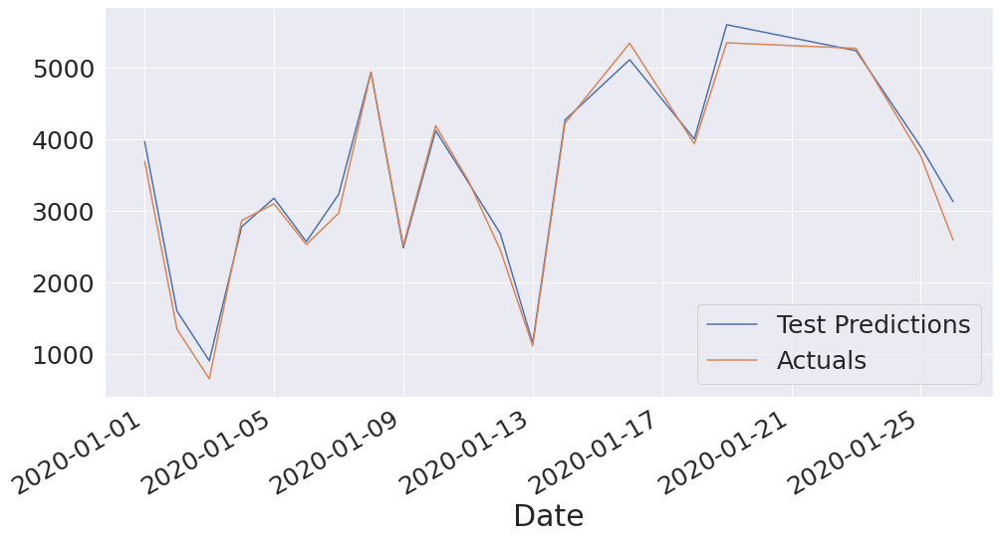

In [ ]:
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays2['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **1D CONVOLUTIONAL**

In [ ]:
from keras.layers import *
model3 = Sequential()
model3.add(Conv1D(64, kernel_size=3, activation='relu',input_shape=(X_train.shape[1], X_train.shape[2])))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.1))
model3.add(Flatten())
model3.add(Dense(8, 'relu'))
model3.add(Dense(1))

cp3 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/1DCONV3/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 67, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 33, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 33, 64)            0         
                                                                 
 flatten (Flatten)           (None, 2112)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 16904     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 67, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 33, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 33, 64)            0         
                                                                 
 flatten (Flatten)           (None, 2112)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 16904     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

45/45 [==============================] - 8s 46ms/step - loss: 0.1553 - mape: 206618.7344 - root_mean_squared_error: 0.1981 - val_loss: 0.1143 - val_mape: 83683.4531 - val_root_mean_squared_error: 0.1504
Epoch 2/30
45/45 [==============================] - ETA: 0s - loss: 0.1054 - mape: 90124.3438 - root_mean_squared_error: 0.1390
Epoch 2: val_loss improved from 0.11425 to 0.09244, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 40ms/step - loss: 0.1054 - mape: 90124.3438 - root_mean_squared_error: 0.1390 - val_loss: 0.0924 - val_mape: 71564.0625 - val_root_mean_squared_error: 0.1245
Epoch 3/30
44/45 [============================>.] - ETA: 0s - loss: 0.0905 - mape: 74483.0938 - root_mean_squared_error: 0.1226
Epoch 3: val_loss improved from 0.09244 to 0.07976, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 40ms/step - loss: 0.0905 - mape: 73918.3438 - root_mean_squared_error: 0.1226 - val_loss: 0.0798 - val_mape: 53718.2500 - val_root_mean_squared_error: 0.1096
Epoch 4/30
44/45 [============================>.] - ETA: 0s - loss: 0.0819 - mape: 66745.5703 - root_mean_squared_error: 0.1137
Epoch 4: val_loss improved from 0.07976 to 0.07454, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 50ms/step - loss: 0.0819 - mape: 66773.1016 - root_mean_squared_error: 0.1137 - val_loss: 0.0745 - val_mape: 57798.6914 - val_root_mean_squared_error: 0.1033
Epoch 5/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0769 - mape: 62410.0859 - root_mean_squared_error: 0.1086
Epoch 5: val_loss improved from 0.07454 to 0.07089, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0769 - mape: 62656.0820 - root_mean_squared_error: 0.1086 - val_loss: 0.0709 - val_mape: 60503.2617 - val_root_mean_squared_error: 0.0986
Epoch 6/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0735 - mape: 62507.8555 - root_mean_squared_error: 0.1051
Epoch 6: val_loss improved from 0.07089 to 0.06870, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0735 - mape: 61331.9688 - root_mean_squared_error: 0.1051 - val_loss: 0.0687 - val_mape: 61003.2891 - val_root_mean_squared_error: 0.0969
Epoch 7/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0712 - mape: 56436.5742 - root_mean_squared_error: 0.1030
Epoch 7: val_loss improved from 0.06870 to 0.06716, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 40ms/step - loss: 0.0711 - mape: 56115.6523 - root_mean_squared_error: 0.1028 - val_loss: 0.0672 - val_mape: 59845.3398 - val_root_mean_squared_error: 0.0949
Epoch 8/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0691 - mape: 53611.3789 - root_mean_squared_error: 0.1012
Epoch 8: val_loss improved from 0.06716 to 0.06697, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0691 - mape: 53899.9258 - root_mean_squared_error: 0.1012 - val_loss: 0.0670 - val_mape: 58065.7812 - val_root_mean_squared_error: 0.0953
Epoch 9/30
44/45 [============================>.] - ETA: 0s - loss: 0.0676 - mape: 51831.0039 - root_mean_squared_error: 0.0998
Epoch 9: val_loss improved from 0.06697 to 0.06537, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0676 - mape: 51708.4727 - root_mean_squared_error: 0.0997 - val_loss: 0.0654 - val_mape: 56720.4609 - val_root_mean_squared_error: 0.0927
Epoch 10/30
44/45 [============================>.] - ETA: 0s - loss: 0.0663 - mape: 50063.3164 - root_mean_squared_error: 0.0987
Epoch 10: val_loss improved from 0.06537 to 0.06422, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0663 - mape: 50171.9453 - root_mean_squared_error: 0.0986 - val_loss: 0.0642 - val_mape: 55309.4102 - val_root_mean_squared_error: 0.0913
Epoch 11/30
44/45 [============================>.] - ETA: 0s - loss: 0.0653 - mape: 47568.4297 - root_mean_squared_error: 0.0976
Epoch 11: val_loss improved from 0.06422 to 0.06359, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0653 - mape: 47791.6406 - root_mean_squared_error: 0.0976 - val_loss: 0.0636 - val_mape: 52807.1445 - val_root_mean_squared_error: 0.0909
Epoch 12/30
45/45 [==============================] - ETA: 0s - loss: 0.0645 - mape: 46893.1094 - root_mean_squared_error: 0.0970
Epoch 12: val_loss improved from 0.06359 to 0.06216, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 39ms/step - loss: 0.0645 - mape: 46893.1094 - root_mean_squared_error: 0.0970 - val_loss: 0.0622 - val_mape: 51921.2500 - val_root_mean_squared_error: 0.0896
Epoch 13/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0636 - mape: 44045.6953 - root_mean_squared_error: 0.0963
Epoch 13: val_loss did not improve from 0.06216
45/45 [==============================] - 1s 25ms/step - loss: 0.0637 - mape: 44366.6055 - root_mean_squared_error: 0.0963 - val_loss: 0.0635 - val_mape: 54050.2539 - val_root_mean_squared_error: 0.0919
Epoch 14/30
44/45 [============================>.] - ETA: 0s - loss: 0.0633 - mape: 44494.5938 - root_mean_squared_error: 0.0959
Epoch 14: val_loss improved from 0.06216 to 0.06140, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0633 - mape: 44214.9102 - root_mean_squared_error: 0.0959 - val_loss: 0.0614 - val_mape: 49225.8516 - val_root_mean_squared_error: 0.0888
Epoch 15/30
44/45 [============================>.] - ETA: 0s - loss: 0.0625 - mape: 42383.8711 - root_mean_squared_error: 0.0952
Epoch 15: val_loss improved from 0.06140 to 0.06130, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 40ms/step - loss: 0.0625 - mape: 42346.7930 - root_mean_squared_error: 0.0952 - val_loss: 0.0613 - val_mape: 49373.6250 - val_root_mean_squared_error: 0.0885
Epoch 16/30
44/45 [============================>.] - ETA: 0s - loss: 0.0621 - mape: 40878.9805 - root_mean_squared_error: 0.0950
Epoch 16: val_loss improved from 0.06130 to 0.05974, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0622 - mape: 40811.1289 - root_mean_squared_error: 0.0950 - val_loss: 0.0597 - val_mape: 44892.6719 - val_root_mean_squared_error: 0.0866
Epoch 17/30
44/45 [============================>.] - ETA: 0s - loss: 0.0617 - mape: 40026.6094 - root_mean_squared_error: 0.0945
Epoch 17: val_loss did not improve from 0.05974
45/45 [==============================] - 1s 24ms/step - loss: 0.0617 - mape: 40156.8984 - root_mean_squared_error: 0.0945 - val_loss: 0.0611 - val_mape: 46385.3359 - val_root_mean_squared_error: 0.0886
Epoch 18/30
45/45 [==============================] - ETA: 0s - loss: 0.0613 - mape: 37800.4648 - root_mean_squared_error: 0.0943
Epoch 18: val_loss did not improve from 0.05974
45/45 [==============================] - 1s 25ms/step - loss: 0.0613 - mape: 37800.4648 - root_mean_squared_error: 0.0943 - val_loss: 0.0600 - val_mape: 44578.1055 - val_root_mean_squared_error: 0.0876
Epoch 19/30
45/45 [=====================

45/45 [==============================] - 2s 40ms/step - loss: 0.0601 - mape: 35028.9180 - root_mean_squared_error: 0.0932 - val_loss: 0.0587 - val_mape: 43313.0156 - val_root_mean_squared_error: 0.0873
Epoch 22/30
44/45 [============================>.] - ETA: 0s - loss: 0.0597 - mape: 34462.4883 - root_mean_squared_error: 0.0928
Epoch 22: val_loss did not improve from 0.05873
45/45 [==============================] - 1s 25ms/step - loss: 0.0597 - mape: 34158.1172 - root_mean_squared_error: 0.0928 - val_loss: 0.0593 - val_mape: 44366.1445 - val_root_mean_squared_error: 0.0876
Epoch 23/30
45/45 [==============================] - ETA: 0s - loss: 0.0593 - mape: 35369.0859 - root_mean_squared_error: 0.0926
Epoch 23: val_loss improved from 0.05873 to 0.05691, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0593 - mape: 35369.0859 - root_mean_squared_error: 0.0926 - val_loss: 0.0569 - val_mape: 40879.7305 - val_root_mean_squared_error: 0.0849
Epoch 24/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0591 - mape: 33374.1328 - root_mean_squared_error: 0.0924
Epoch 24: val_loss improved from 0.05691 to 0.05662, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 52ms/step - loss: 0.0591 - mape: 34314.4141 - root_mean_squared_error: 0.0924 - val_loss: 0.0566 - val_mape: 40503.8867 - val_root_mean_squared_error: 0.0853
Epoch 25/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0589 - mape: 33840.7266 - root_mean_squared_error: 0.0922
Epoch 25: val_loss did not improve from 0.05662
45/45 [==============================] - 1s 24ms/step - loss: 0.0589 - mape: 33764.9922 - root_mean_squared_error: 0.0923 - val_loss: 0.0577 - val_mape: 40798.8828 - val_root_mean_squared_error: 0.0860
Epoch 26/30
44/45 [============================>.] - ETA: 0s - loss: 0.0587 - mape: 33561.3359 - root_mean_squared_error: 0.0921
Epoch 26: val_loss did not improve from 0.05662
45/45 [==============================] - 1s 24ms/step - loss: 0.0587 - mape: 33629.6875 - root_mean_squared_error: 0.0921 - val_loss: 0.0571 - val_mape: 41043.1484 - val_root_mean_squared_error: 0.0847
Epoch 27/30
45/45 [=====================

45/45 [==============================] - 2s 40ms/step - loss: 0.0584 - mape: 32457.9609 - root_mean_squared_error: 0.0919 - val_loss: 0.0564 - val_mape: 39803.0000 - val_root_mean_squared_error: 0.0848
Epoch 28/30
45/45 [==============================] - ETA: 0s - loss: 0.0581 - mape: 33183.9766 - root_mean_squared_error: 0.0917
Epoch 28: val_loss improved from 0.05638 to 0.05575, saving model to /content/drive/MyDrive/FYP complete files/1DCONV3/


45/45 [==============================] - 2s 41ms/step - loss: 0.0581 - mape: 33183.9766 - root_mean_squared_error: 0.0917 - val_loss: 0.0557 - val_mape: 39828.1719 - val_root_mean_squared_error: 0.0844
Epoch 29/30
45/45 [==============================] - ETA: 0s - loss: 0.0579 - mape: 32398.7070 - root_mean_squared_error: 0.0915
Epoch 29: val_loss did not improve from 0.05575
45/45 [==============================] - 1s 25ms/step - loss: 0.0579 - mape: 32398.7070 - root_mean_squared_error: 0.0915 - val_loss: 0.0562 - val_mape: 40520.9609 - val_root_mean_squared_error: 0.0850
Epoch 30/30
44/45 [============================>.] - ETA: 0s - loss: 0.0578 - mape: 32700.6758 - root_mean_squared_error: 0.0914
Epoch 30: val_loss did not improve from 0.05575
45/45 [==============================] - 1s 25ms/step - loss: 0.0578 - mape: 32779.5547 - root_mean_squared_error: 0.0914 - val_loss: 0.0563 - val_mape: 41023.7578 - val_root_mean_squared_error: 0.0858


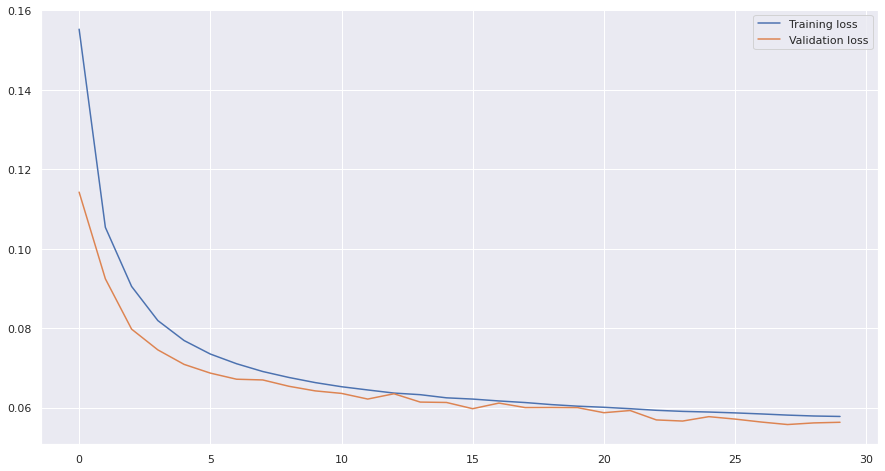

In [ ]:
model3.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model3.summary()
# fit the model
history3 = model3.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp3])
plt.plot(history3.history['loss'], label='Training loss')
plt.plot(history3.history['val_loss'], label='Validation loss')
plt.legend()

# **CNN analysis**

In [ ]:
from keras.models import load_model
model3 = load_model('/content/drive/MyDrive/FYP complete files/1DCONV3/')

dftrain3 = dftrain
X_train3 = X_train
train_predictions3 = model3.predict(X_train3)
prediction_copies3 = np.repeat(train_predictions3, dftrain3.shape[1], axis=-1)
train_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]

y_train3 = y_train
actual_copies3 = np.repeat(y_train3, dftrain3.shape[1], axis=-1)
y_train3 = Scaler.inverse_transform(actual_copies3)[:,0]

train_predictions3 = train_predictions3.flatten()
y_train3 = y_train3.flatten()


5683/5683 [==============================] - 14s 2ms/step


In [ ]:
train_results3 = pd.DataFrame(data={'Train Predictions':train_predictions3, 'Actuals':y_train3, 'Date':traindates[69:]})
train_results3.set_index('Date', inplace = True)
train_results3.head()

,Train Predictions,Actuals
Date,,
1998-01-05 08:00:00,16.644978,62.0
1998-01-05 08:30:00,23.477285,132.0
1998-01-05 09:00:00,122.600502,57.0
1998-01-05 09:30:00,230.874512,105.0
1998-01-05 10:00:00,194.705444,121.0


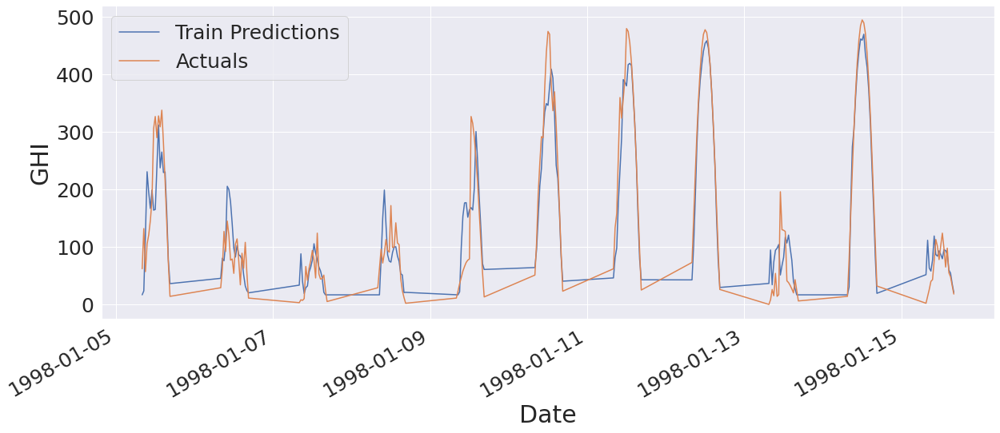

In [ ]:
train_results3['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results3['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval3 = dfval
X_val3 = X_val
val_predictions3 = model3.predict(X_val3)
prediction_copies3 = np.repeat(val_predictions3, dfval3.shape[1], axis=-1)
#val_predictions3 = Scalervl.inverse_transform(prediction_copies3)[:,0]
val_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_val3 = y_val
actual_copies3 = np.repeat(y_val3, dfval3.shape[1], axis=-1)
#y_val3 = Scalervl.inverse_transform(actual_copies3)[:,0]
y_val3 = Scaler.inverse_transform(actual_copies3)[:,0]

val_predictions3 = val_predictions3.flatten()
y_val3 = y_val3.flatten()

val_results3 = pd.DataFrame(data={'Val Predictions':val_predictions3, 'Actuals':y_val3, 'Date':valdates[69:]})
val_results3.set_index('Date', inplace = True)
val_results3.head()

282/282 [==============================] - 1s 3ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 13:30:00,336.429596,353.0
2019-01-01 14:00:00,339.463959,248.0
2019-01-01 14:30:00,272.256104,190.0
2019-01-01 15:00:00,171.320129,143.0
2019-01-01 15:30:00,104.420990,90.0


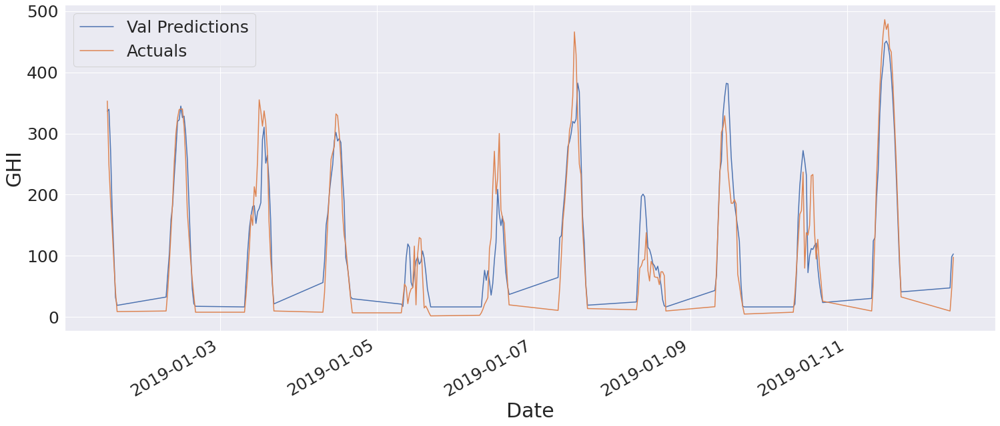

In [ ]:
val_results3['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results3['Actuals'][:200].plot(figsize=(25,10), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest3 = dftest
X_test3 = X_test
test_predictions3 = model3.predict(X_test3)
prediction_copies3 = np.repeat(test_predictions3, dftest3.shape[1], axis=-1)
#test_predictions3 = Scalerts.inverse_transform(prediction_copies3)[:,0]
test_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_test3 = y_test
actual_copies3 = np.repeat(y_test3, dftest3.shape[1], axis=-1)
#y_test3 = Scalerts.inverse_transform(actual_copies3)[:,0]
y_test3 = Scaler.inverse_transform(actual_copies3)[:,0]


y_test3 = y_test3.flatten()

test_results3 = pd.DataFrame(data={'Test Predictions':test_predictions3, 'Actuals':y_test3.flatten(), 'Date':testdates[69:]})
test_results3.set_index('Date', inplace = True)
Rsquared3 =r2_score(y_test3, test_predictions3)
mape3 = tf.keras.metrics.mean_absolute_percentage_error(y_test3, test_predictions3)
mae3 = tf.keras.metrics.mean_absolute_error(y_test3, test_predictions3)

m3 = tf.keras.metrics.RootMeanSquaredError()
m3.update_state(y_test3, test_predictions3)
rmse3 = m3.result().numpy()

#rmse3 =  tf.keras.metrics.RootMeanSquaredError(y_test3, test_predictions3)
mean3 =np.mean(y_test3)
test_results3, print('Rsqrared: ', Rsquared3), print('MAPE: ',mape3), print('MAE: ',mae3), print('RMSE: ',rmse3), print('Mean: ',mean3)

284/284 [==============================] - 1s 2ms/step
Rsqrared:  0.896929953546718
MAPE:  tf.Tensor(35787304.0, shape=(), dtype=float32)
MAE:  tf.Tensor(57.05123, shape=(), dtype=float32)
RMSE:  86.61347
Mean:  311.24653007270325


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 13:30:00        114.657555     69.0
 2020-01-01 14:00:00         91.480881     68.0
 2020-01-01 14:30:00         69.214149     76.0
 2020-01-01 15:00:00         44.376450     58.0
 2020-01-01 15:30:00         26.019350     35.0
 ...                               ...      ...
 2020-12-31 14:30:00         74.459122     53.0
 2020-12-31 15:00:00         46.560120     61.0
 2020-12-31 15:30:00         31.213398     31.0
 2020-12-31 16:00:00         21.657587     15.0
 2020-12-31 16:30:00         16.644978      4.0
 
 [9078 rows x 2 columns], None, None, None, None, None)

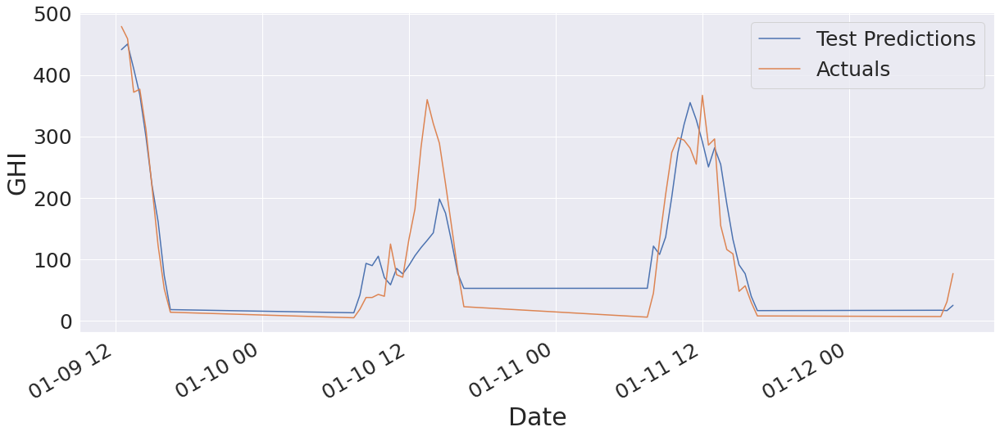

In [ ]:
test_results3['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

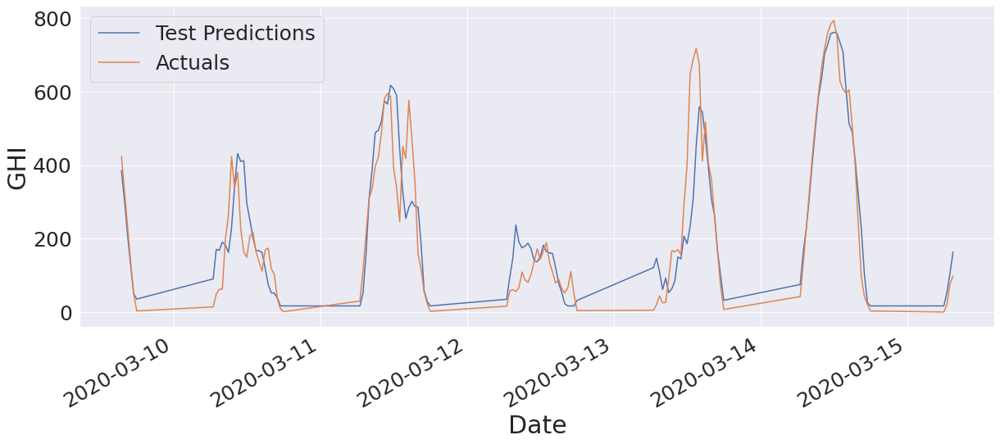

In [ ]:
test_results3['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

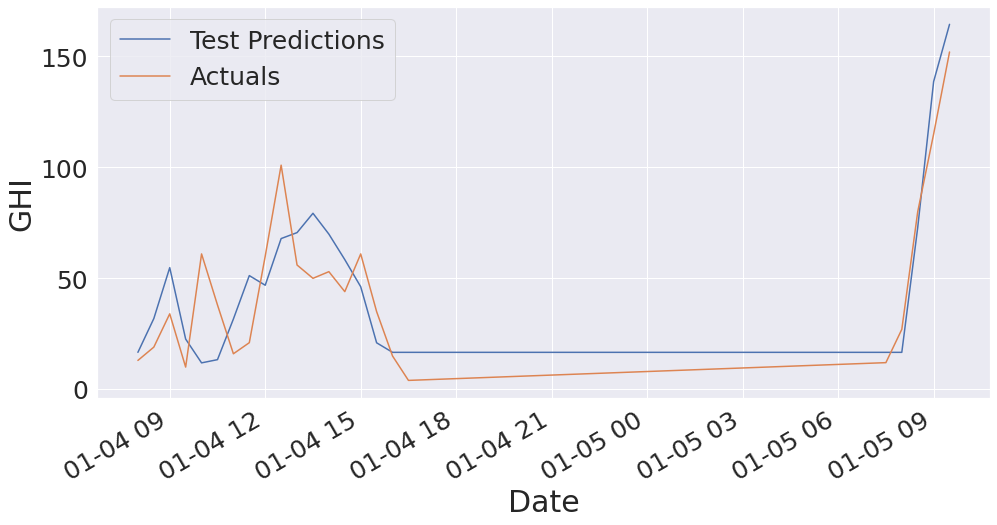

In [ ]:
test_results3['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results3['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results30 = test_results3
test_results3 = test_results3.reset_index()
test_results3 = test_results3.drop(['Date'], axis = 'columns')

# **Daily Reults CONV**

In [ ]:
testyear3 = pd.concat([testyear,test_results3], axis = 'columns')
testyear3.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333,114.657555,69.0
1,2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222,91.480881,68.0
2,2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556,69.214149,76.0
3,2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642,44.376450,58.0
4,2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657,26.019350,35.0


In [ ]:
testyear3 = testyear3.resample('D',on='Date').sum()

In [ ]:
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3709.034668,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1625.793701,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,744.099609,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2748.339355,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,2838.794189,3099.0


In [ ]:
#testyear3 = testyear3.dropna()
testyear3 = testyear3.drop("2020-02-29")
testyear3

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3709.034668,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1625.793701,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,744.099609,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2748.339355,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,2838.794189,3099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,4833,5121,1404.19,1210.05,22.3,0,0,0,2,0,2,0,0,0,17.109916,2791.292480,3109.0
2020-12-28,3184,4958,1403.37,1665.58,122.5,0,0,1,9,0,1,0,0,0,12.876131,4352.535645,4558.0
2020-12-29,4474,5312,1402.29,1195.87,34.1,0,1,0,6,0,0,0,0,0,16.264681,3508.964600,3307.0


In [ ]:
testyear3['cluster'] = clusters
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,3709.034668,3695.0,1
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1625.793701,1349.0,1
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,744.099609,656.0,1
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2748.339355,2867.0,1
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,2838.794189,3099.0,1


# **Dividing days according to clusters CONV**

In [ ]:
 Fullyear3= testyear3[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap3 =  Fullyear3['Test Predictions'].to_numpy()
Fullyearac3 =  Fullyear3['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear3 =r2_score(Fullyearac3, Fullyeararrap3)
mapeFullyear3 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac3, Fullyeararrap3)
maeFullyear3 = tf.keras.metrics.mean_absolute_error(Fullyearac3, Fullyeararrap3)

mFullyear3 = tf.keras.metrics.RootMeanSquaredError()
mFullyear3.update_state(Fullyearac3, Fullyeararrap3)
rmseFullyear3 = mFullyear3.result().numpy()
meanFullyear3 =np.mean(Fullyearac3)
print('Rsqrared: ', RsquaredFullyear3), print('MAPE: ',mapeFullyear3), print('MAE: ',maeFullyear3), print('RMSE: ',rmseFullyear3), print('Mean: ',meanFullyear3)



Rsqrared:  0.9724449209194945
MAPE:  tf.Tensor(10.5763235, shape=(), dtype=float32)
MAE:  tf.Tensor(538.59827, shape=(), dtype=float32)
RMSE:  711.40924
Mean:  7741.084931506849


(None, None, None, None, None)

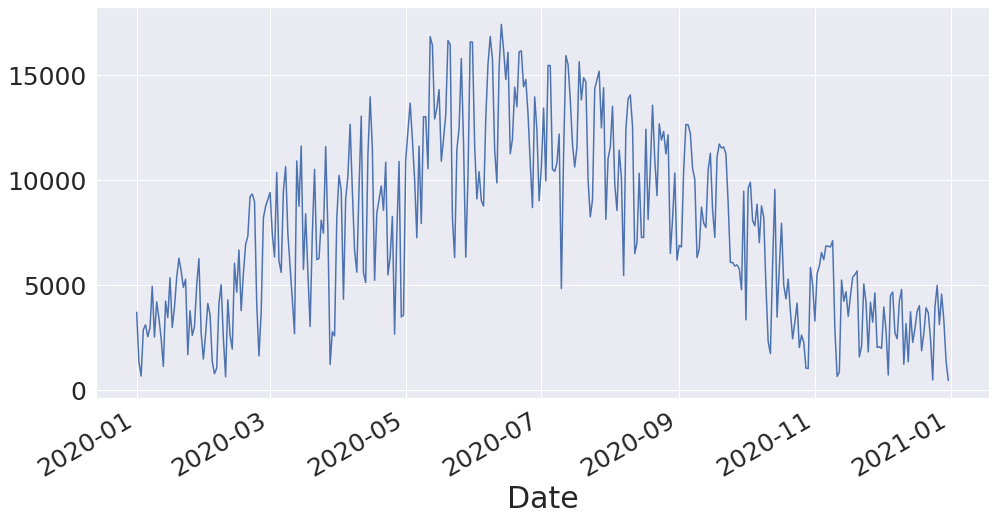

In [ ]:
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')

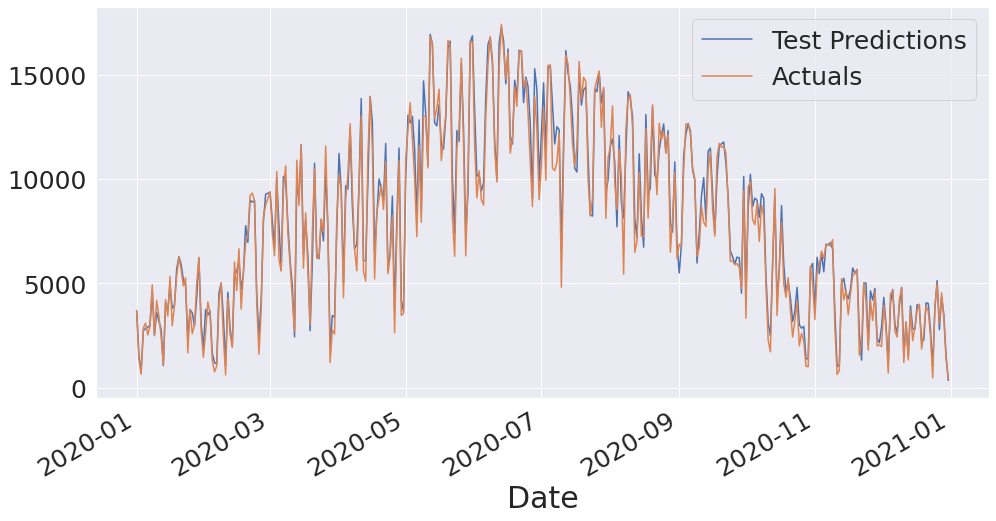

In [ ]:
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays3 = testyear3[testyear3.cluster == clus]
mixeddays3 = testyear3[testyear3.cluster == clum]
cloudydays3 = testyear3[testyear3.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-03-24,8359.119141,8081.0
2020-03-26,11280.944336,11583.0
2020-03-27,7806.396484,7635.0
2020-04-01,10660.000000,10215.0
2020-04-02,9743.969727,9489.0
2020-04-06,13022.356445,12651.0
2020-04-07,9309.625000,9473.0
2020-04-11,13687.242188,13035.0
2020-04-14,10689.446289,11178.0


In [ ]:
sunnyarrap3 = sunnydays3['Test Predictions'].to_numpy()
sunnyac3 = sunnydays3['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny3 =r2_score(sunnyac3, sunnyarrap3)
mapesunny3 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac3, sunnyarrap3)
maesunny3 = tf.keras.metrics.mean_absolute_error(sunnyac3, sunnyarrap3)

msunny3 = tf.keras.metrics.RootMeanSquaredError()
msunny3.update_state(sunnyac3, sunnyarrap3)
rmsesunny3 = msunny3.result().numpy()
meansunny3 =np.mean(sunnyac3)
print('Rsqrared: ', Rsquaredsunny3), print('MAPE: ',mapesunny3), print('MAE: ',maesunny3), print('RMSE: ',rmsesunny3), print('Mean: ',meansunny3)



Rsqrared:  0.8863331441991149
MAPE:  tf.Tensor(5.0346403, shape=(), dtype=float32)
MAE:  tf.Tensor(582.5148, shape=(), dtype=float32)
RMSE:  794.79645
Mean:  12701.165137614678


(None, None, None, None, None)

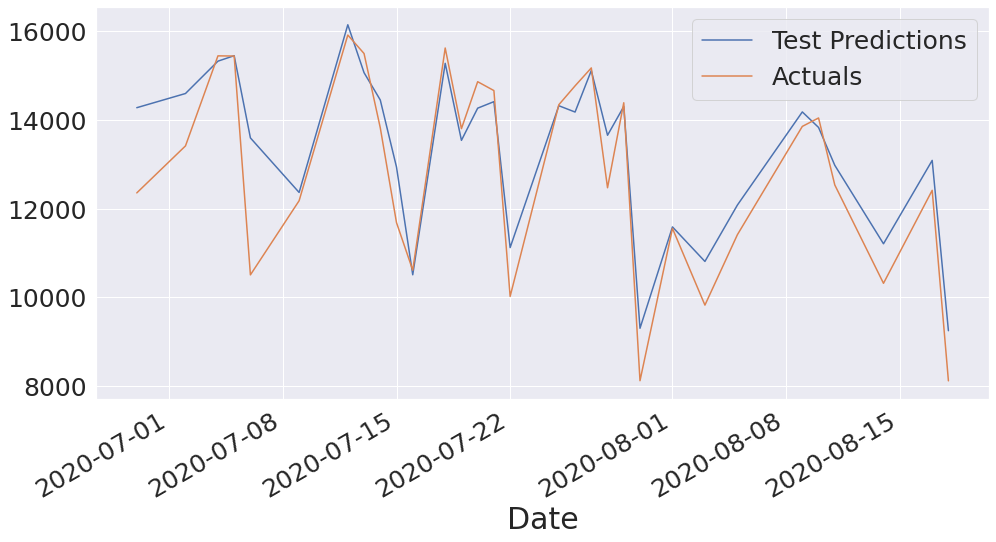

In [ ]:
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays3['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays3 = mixeddays3[['Test Predictions',	'Actuals']]
mixdays3

,Test Predictions,Actuals
Date,,
2020-01-15,3681.384766,3441.0
2020-01-17,3812.144531,2973.0
2020-01-20,6284.911133,6268.0
2020-01-21,5922.208496,5679.0
2020-01-22,5190.571777,4884.0
2020-01-24,2349.403809,1680.0
2020-01-29,6217.987305,6251.0
2020-01-30,3084.441406,2729.0
2020-02-03,3688.712158,3588.0


In [ ]:
mixarrap3 = mixeddays3['Test Predictions'].to_numpy()
mixac3 = mixeddays3['Actuals'].to_numpy()

In [ ]:
Rsquaredmix3 =r2_score(mixac3, mixarrap3)
mapemix3 = tf.keras.metrics.mean_absolute_percentage_error(mixac3, mixarrap3)
maemix3 = tf.keras.metrics.mean_absolute_error(mixac3, mixarrap3)

mmix3 = tf.keras.metrics.RootMeanSquaredError()
mmix3.update_state(mixac3, mixarrap3)
rmsemix3 = mmix3.result().numpy()
meanmix3 =np.mean(mixac3)
print('Rsqrared: ', Rsquaredmix3), print('MAPE: ',mapemix3), print('MAE: ',maemix3), print('RMSE: ',rmsemix3), print('Mean: ',meanmix3)



Rsqrared:  0.9002635135701921
MAPE:  tf.Tensor(9.916347, shape=(), dtype=float32)
MAE:  tf.Tensor(660.5059, shape=(), dtype=float32)
RMSE:  821.561
Mean:  7682.105263157895


(None, None, None, None, None)

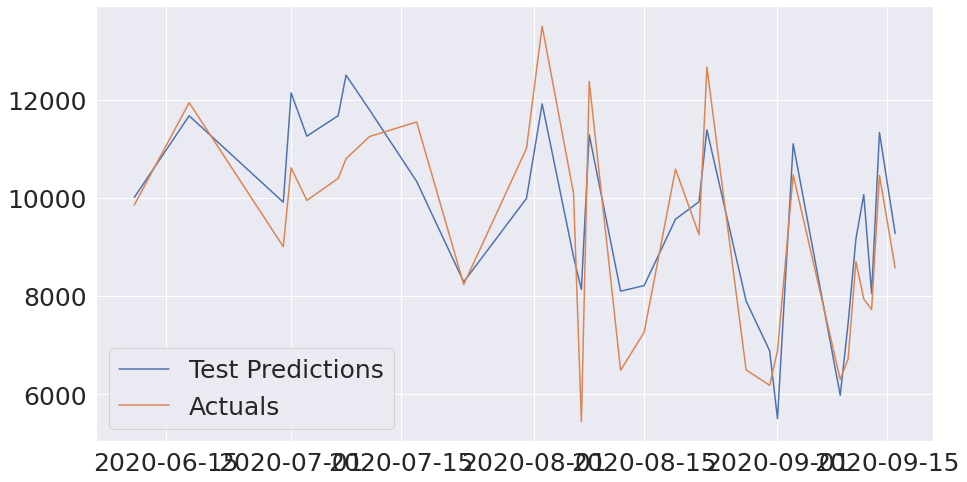

In [ ]:
plt.plot(mixeddays3['Test Predictions'][50:81], label='Test Predictions')
plt.plot(mixeddays3['Actuals'][50:81], label='Actuals')
plt.legend()

In [ ]:
cloudydays3 = cloudydays3[['Test Predictions',	'Actuals']]
cloudydays3

,Test Predictions,Actuals
Date,,
2020-01-01,3709.034668,3695.0
2020-01-02,1625.793701,1349.0
2020-01-03,744.099609,656.0
2020-01-04,2748.339355,2867.0
2020-01-05,2838.794189,3099.0
2020-01-06,2906.970947,2531.0
2020-01-07,2996.824951,2969.0
2020-01-08,4690.238770,4935.0
2020-01-09,2501.245850,2518.0


In [ ]:
cloudyarrap3 = cloudydays3['Test Predictions'].to_numpy()
cloudyac3 = cloudydays3['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy3 =r2_score(cloudyac3, cloudyarrap3)
mapecloudy3 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac3, cloudyarrap3)
maecloudy3 = tf.keras.metrics.mean_absolute_error(cloudyac3, cloudyarrap3)

mcloudy3 = tf.keras.metrics.RootMeanSquaredError()
mcloudy3.update_state(cloudyac3, cloudyarrap3)
rmsecloudy3 = mcloudy3.result().numpy()
meancloudy3 =np.mean(cloudyac3)
print('Rsqrared: ', Rsquaredcloudy3), print('MAPE: ',mapecloudy3), print('MAE: ',maecloudy3), print('RMSE: ',rmsecloudy3), print('Mean: ',meancloudy3)

Rsqrared:  0.9388958482462377
MAPE:  tf.Tensor(15.359989, shape=(), dtype=float32)
MAE:  tf.Tensor(407.01828, shape=(), dtype=float32)
RMSE:  523.5744
Mean:  3981.049295774648


(None, None, None, None, None)

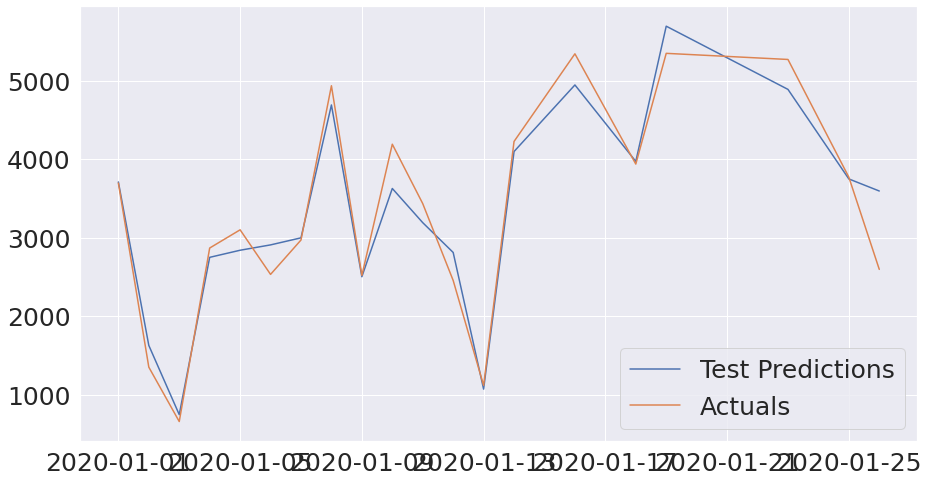

In [ ]:
plt.plot(cloudydays3['Test Predictions'][:20], label='Test Predictions')
plt.plot(cloudydays3['Actuals'][:20], label='Actuals')
plt.legend()

# **RNN**

In [ ]:
from tensorflow.keras.layers import SimpleRNN
model4 = Sequential()
model4.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model4.add(SimpleRNN(32, activation='relu', return_sequences=False))
model4.add(Dropout(0.1))
model4.add(Dense(32))
#model4.add(Dense(16))
#model4.add(Dense(8))
model4.add(Dense(y_train.shape[1]))
cp4 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/RNN3/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model4.summary()



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 69, 64)            5120      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 32)                3104      
                                                                 
 dropout_3 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                1056      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 9,313
Trainable params: 9,313
Non-trainable params: 0
_________________________________________________________________


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 69, 64)            5120      
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 32)                3104      
                                                                 
 dropout_3 (Dropout)         (None, 32)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                1056      
                                                                 
 dense_7 (Dense)             (None, 1)                 33        
                                                                 
Total params: 9,313
Trainable params: 9,313
Non-trainable params: 0
_________________________________________________________________
Epoch 1/30
45/45 [==============================] - 

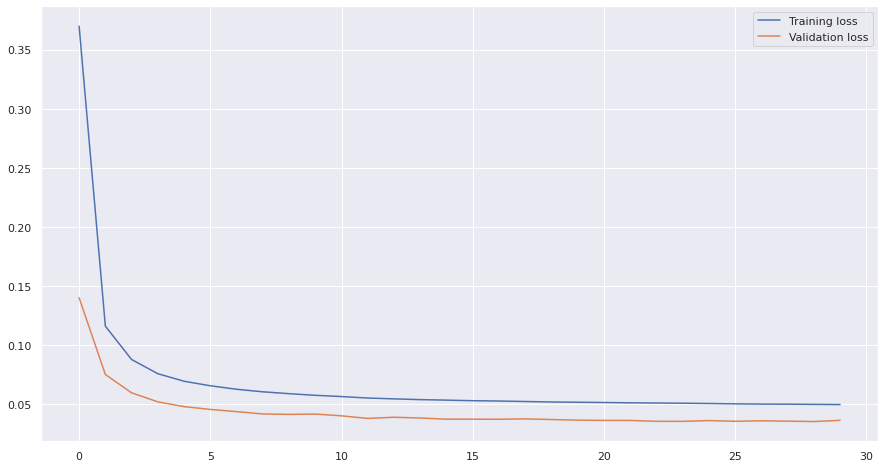

In [ ]:
model4.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model4.summary()
# fit the model
history4 = model4.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp4])
plt.plot(history4.history['loss'], label='Training loss')
plt.plot(history4.history['val_loss'], label='Validation loss')
plt.legend()

# **RNN analysis**

In [ ]:
from tensorflow.keras.models import load_model
model4 = load_model('/content/drive/MyDrive/FYP complete files/RNN3/')

dftrain4 = dftrain
X_train4 = X_train
train_predictions4 = model4.predict(X_train4)
prediction_copies4 = np.repeat(train_predictions4, dftrain4.shape[1], axis=-1)
train_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]

y_train4 = y_train
actual_copies4 = np.repeat(y_train4, dftrain4.shape[1], axis=-1)
y_train4 = Scaler.inverse_transform(actual_copies4)[:,0]

train_predictions4 = train_predictions4.flatten()
y_train4 = y_train4.flatten()

train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4})
train_results4.head()

5683/5683 [==============================] - 47s 8ms/step


,Train Predictions,Actuals
0,26.699827,62.0
1,137.702362,132.0
2,224.790985,57.0
3,136.062088,105.0
4,138.665192,121.0


In [ ]:
train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4, 'Date':traindates[69:]})
train_results4.set_index('Date', inplace = True)
train_results4.head()

,Train Predictions,Actuals
Date,,
1998-01-05 08:00:00,26.699827,62.0
1998-01-05 08:30:00,137.702362,132.0
1998-01-05 09:00:00,224.790985,57.0
1998-01-05 09:30:00,136.062088,105.0
1998-01-05 10:00:00,138.665192,121.0


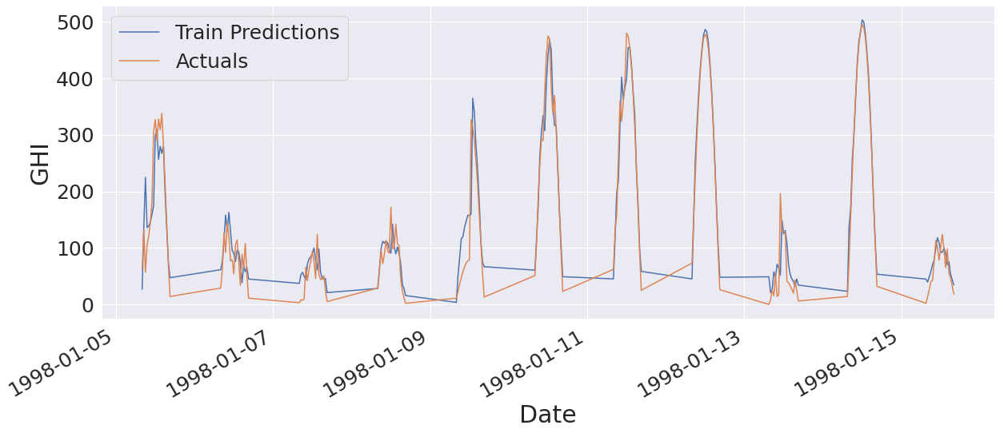

In [ ]:
train_results4['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval4 = dfval
X_val4 = X_val
val_predictions4 = model4.predict(X_val4)
prediction_copies4 = np.repeat(val_predictions4, dfval4.shape[1], axis=-1)
#val_predictions4 = Scalervl.inverse_transform(prediction_copies4)[:,0]
val_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_val4 = y_val
actual_copies4 = np.repeat(y_val4, dfval4.shape[1], axis=-1)
#y_val4 = Scalervl.inverse_transform(actual_copies4)[:,0]
y_val4 = Scaler.inverse_transform(actual_copies4)[:,0]

val_predictions4 = val_predictions4.flatten()
y_val4 = y_val4.flatten()

val_results4 = pd.DataFrame(data={'Val Predictions':val_predictions4, 'Actuals':y_val4, 'Date':valdates[69:]})
val_results4.set_index('Date', inplace = True)
val_results4.head()

282/282 [==============================] - 3s 11ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 13:30:00,380.290955,353.0
2019-01-01 14:00:00,310.798798,248.0
2019-01-01 14:30:00,218.178833,190.0
2019-01-01 15:00:00,140.895996,143.0
2019-01-01 15:30:00,87.642532,90.0


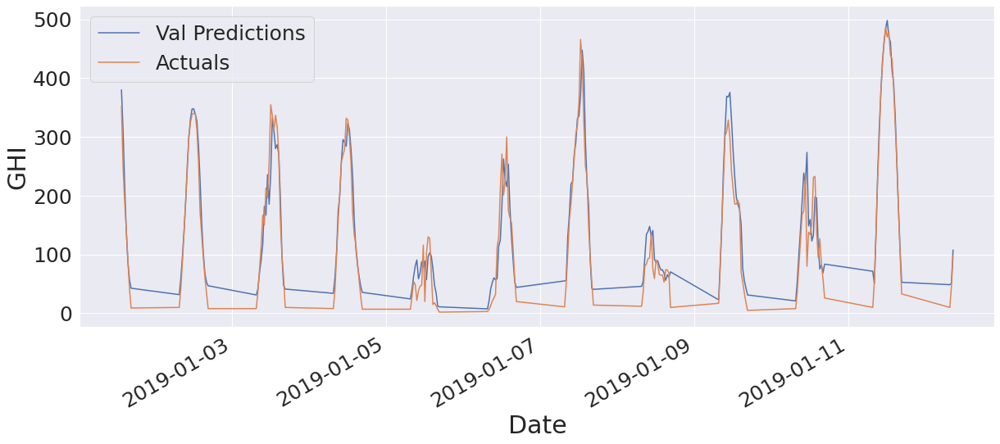

In [ ]:
val_results4['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest4 = dftest
X_test4 = X_test
test_predictions4 = model4.predict(X_test4)
prediction_copies4 = np.repeat(test_predictions4, dftest4.shape[1], axis=-1)
#test_predictions4 = Scalerts.inverse_transform(prediction_copies4)[:,0]
test_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_test4 = y_test
actual_copies4 = np.repeat(y_test4, dftest4.shape[1], axis=-1)
#y_test4 = Scalerts.inverse_transform(actual_copies4)[:,0]
y_test4 = Scaler.inverse_transform(actual_copies4)[:,0]


y_test4 = y_test4.flatten()

test_results4 = pd.DataFrame(data={'Test Predictions':test_predictions4, 'Actuals':y_test4.flatten(), 'Date':testdates[69:]})
test_results4.set_index('Date', inplace = True)
Rsquared4 =r2_score(y_test4, test_predictions4)
mape4 = tf.keras.metrics.mean_absolute_percentage_error(y_test4, test_predictions4)
mae4 = tf.keras.metrics.mean_absolute_error(y_test4, test_predictions4)

m4 = tf.keras.metrics.RootMeanSquaredError()
m4.update_state(y_test4, test_predictions4)
rmse4 = m4.result().numpy()

#rmse4 =  tf.keras.metrics.RootMeanSquaredError(y_test4, test_predictions4)
mean4 =np.mean(y_test4)
test_results4, print('Rsqrared: ', Rsquared4), print('MAPE: ',mape4), print('MAE: ',mae4), print('RMSE: ',rmse4), print('Mean: ',mean4)

284/284 [==============================] - 2s 8ms/step
Rsqrared:  0.9535995936937836
MAPE:  tf.Tensor(43320504.0, shape=(), dtype=float32)
MAE:  tf.Tensor(36.60564, shape=(), dtype=float32)
RMSE:  58.11391
Mean:  311.24653007270325


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 13:30:00         85.272598     69.0
 2020-01-01 14:00:00         79.216774     68.0
 2020-01-01 14:30:00         73.813889     76.0
 2020-01-01 15:00:00         76.986443     58.0
 2020-01-01 15:30:00         59.804115     35.0
 ...                               ...      ...
 2020-12-31 14:30:00         94.435814     53.0
 2020-12-31 15:00:00         58.409191     61.0
 2020-12-31 15:30:00         64.117958     31.0
 2020-12-31 16:00:00         44.246861     15.0
 2020-12-31 16:30:00         24.477604      4.0
 
 [9078 rows x 2 columns], None, None, None, None, None)

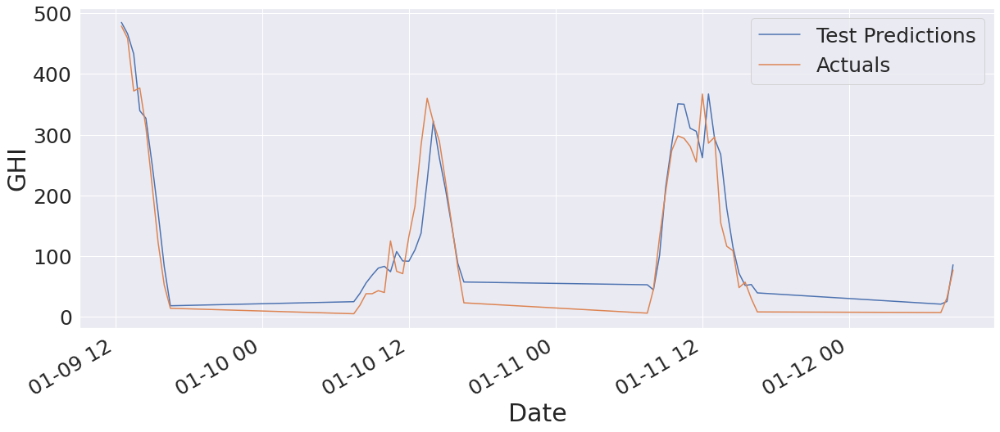

In [ ]:
test_results4['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

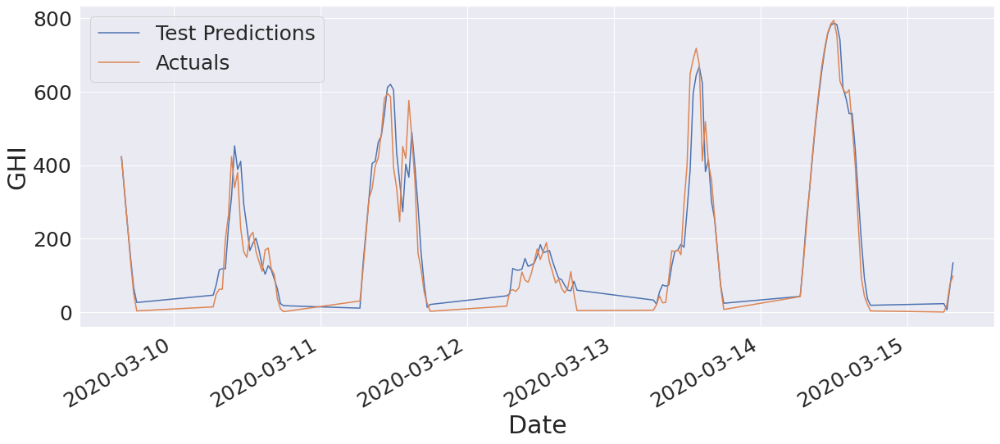

In [ ]:
test_results4['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

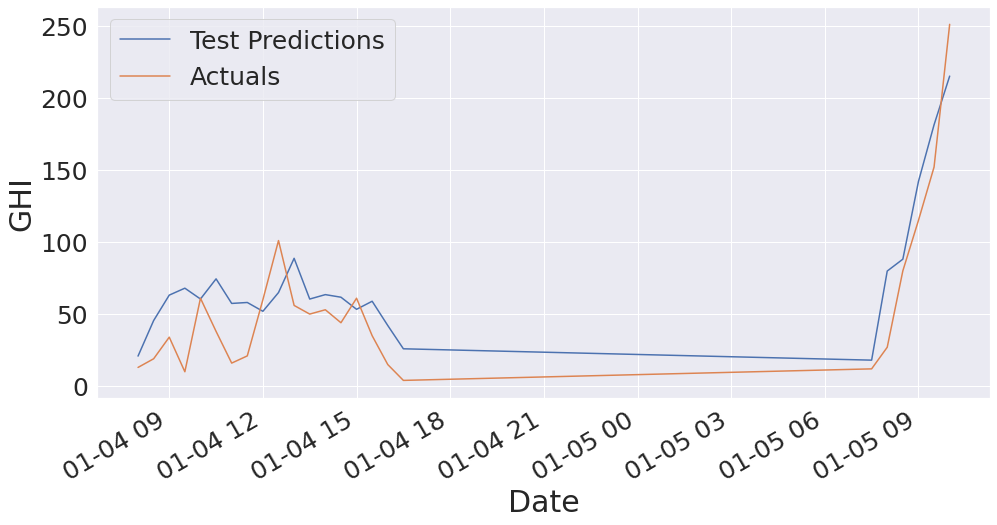

In [ ]:
test_results4['Test Predictions'][46:70].plot(figsize=(16,8), label='Test Predictions')
test_results4['Actuals'][46:70].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results40 = test_results4 
test_results4 = test_results4.reset_index()
test_results4 = test_results4.drop(['Date'], axis = 'columns')

# **Daily Reults RNN**

In [ ]:
testyear4 = pd.concat([testyear,test_results4], axis = 'columns')
testyear4.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:30:00,5,15,88.83,82.26,0.8,0,0,0,1,0,0,0,0,0,0.333333,85.272598,69.0
1,2020-01-01 08:00:00,34,72,84.38,81.59,1.2,0,0,0,1,0,0,0,0,0,0.472222,79.216774,68.0
2,2020-01-01 08:30:00,62,144,80.06,78.72,1.7,0,0,0,1,0,0,0,0,0,0.430556,73.813889,76.0
3,2020-01-01 09:00:00,59,218,76.08,74.77,2.3,0,0,0,1,0,0,0,0,0,0.270642,76.986443,58.0
4,2020-01-01 09:30:00,98,286,72.52,73.19,2.6,0,0,0,1,0,0,0,0,0,0.342657,59.804115,35.0


In [ ]:
testyear4 = testyear4.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4003.110596,3695.0,1
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1587.806030,1349.0,1
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,872.588806,656.0,1
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,2836.265137,2867.0,1
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3205.254883,3099.0,1


In [ ]:
#testyear4 = testyear4.dropna()
testyear4 = testyear4.drop("2020-02-29")
testyear4

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4097.975098,3695.0
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1670.563599,1349.0
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,1019.513672,656.0
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,3008.338867,2867.0
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3216.785645,3099.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,4833,5121,1404.19,1210.05,22.3,0,0,0,2,0,2,0,0,0,17.109916,3141.243896,3109.0
2020-12-28,3184,4958,1403.37,1665.58,122.5,0,0,1,9,0,1,0,0,0,12.876131,4839.983398,4558.0
2020-12-29,4474,5312,1402.29,1195.87,34.1,0,1,0,6,0,0,0,0,0,16.264681,3465.042236,3307.0


In [ ]:
testyear4['cluster'] = clusters
testyear4.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,1685,5143,1399.67,1338.69,50.9,0,0,0,19,0,0,0,0,0,6.119029,4097.975098,3695.0,1
2020-01-02,4205,5207,1398.23,1503.91,95.3,0,0,0,2,0,7,0,0,0,14.612414,1670.563599,1349.0,1
2020-01-03,739,4746,1396.74,1789.05,141.5,0,0,0,16,0,1,2,0,0,3.148376,1019.513672,656.0,1
2020-01-04,693,4809,1395.12,1821.20,168.9,0,0,0,10,0,7,2,0,0,3.178851,3008.338867,2867.0,1
2020-01-05,4057,5376,1393.29,1260.85,68.0,0,3,0,9,0,0,0,0,0,14.130642,3216.785645,3099.0,1


# **Dividing days according to clusters RNN**

In [ ]:
 Fullyear4= testyear4[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap4 =  Fullyear4['Test Predictions'].to_numpy()
Fullyearac4 =  Fullyear4['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear4 =r2_score(Fullyearac4, Fullyeararrap4)
mapeFullyear4 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac4, Fullyeararrap4)
maeFullyear4 = tf.keras.metrics.mean_absolute_error(Fullyearac4, Fullyeararrap4)

mFullyear4 = tf.keras.metrics.RootMeanSquaredError()
mFullyear4.update_state(Fullyearac4, Fullyeararrap4)
rmseFullyear4 = mFullyear4.result().numpy()
meanFullyear4 =np.mean(Fullyearac4)
print('Rsqrared: ', RsquaredFullyear4), print('MAPE: ',mapeFullyear4), print('MAE: ',maeFullyear4), print('RMSE: ',rmseFullyear4), print('Mean: ',meanFullyear4)



Rsqrared:  0.9898377425344005
MAPE:  tf.Tensor(7.7919126, shape=(), dtype=float32)
MAE:  tf.Tensor(348.2322, shape=(), dtype=float32)
RMSE:  432.02985
Mean:  7741.084931506849


(None, None, None, None, None)

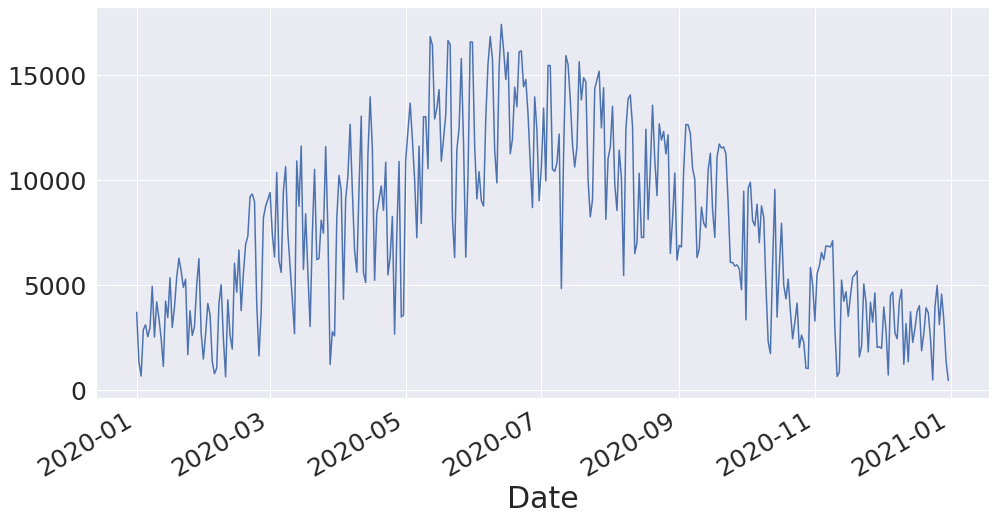

In [ ]:
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')

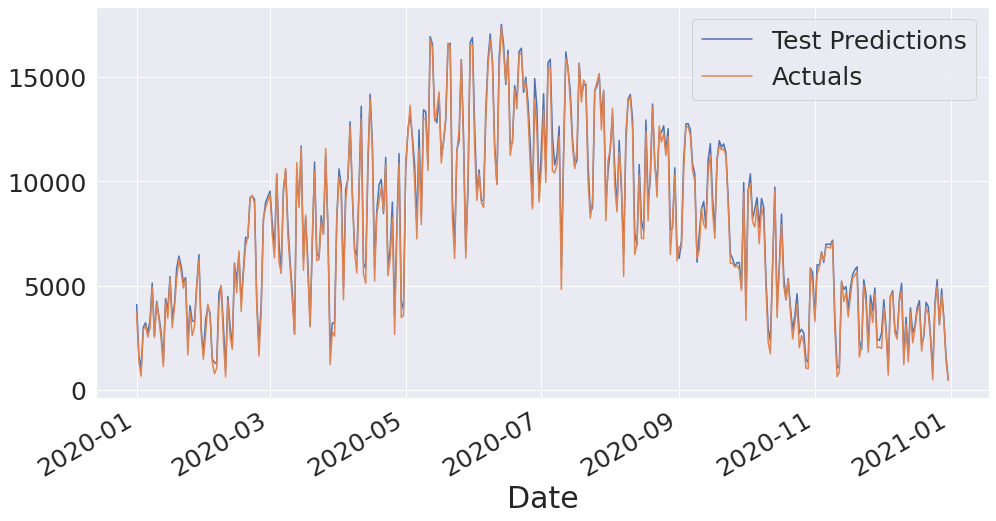

In [ ]:
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays4 = testyear4[testyear4.cluster == clus]
mixeddays4 = testyear4[testyear4.cluster == clum]
cloudydays4 = testyear4[testyear4.cluster == cluc]

In [ ]:
sunnydays4 = sunnydays4[['Test Predictions',	'Actuals']]
sunnydays4

,Test Predictions,Actuals
Date,,
2020-03-24,8354.754883,8081.0
2020-03-26,11262.933594,11583.0
2020-03-27,7854.434082,7635.0
2020-04-01,10603.298828,10215.0
2020-04-02,9791.027344,9489.0
2020-04-06,12866.366211,12651.0
2020-04-07,9343.583008,9473.0
2020-04-11,13607.878906,13035.0
2020-04-14,10637.378906,11178.0


In [ ]:
sunnyarrap4 = sunnydays4['Test Predictions'].to_numpy()
sunnyac4 = sunnydays4['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny4 =r2_score(sunnyac4, sunnyarrap4)
mapesunny4 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac4, sunnyarrap4)
maesunny4 = tf.keras.metrics.mean_absolute_error(sunnyac4, sunnyarrap4)

msunny4 = tf.keras.metrics.RootMeanSquaredError()
msunny4.update_state(sunnyac4, sunnyarrap4)
rmsesunny4 = msunny4.result().numpy()
meansunny4 =np.mean(sunnyac4)
print('Rsqrared: ', Rsquaredsunny4), print('MAPE: ',mapesunny4), print('MAE: ',maesunny4), print('RMSE: ',rmsesunny4), print('Mean: ',meansunny4)



Rsqrared:  0.9604683150460172
MAPE:  tf.Tensor(3.2193258, shape=(), dtype=float32)
MAE:  tf.Tensor(371.16428, shape=(), dtype=float32)
RMSE:  468.71805
Mean:  12701.165137614678


(None, None, None, None, None)

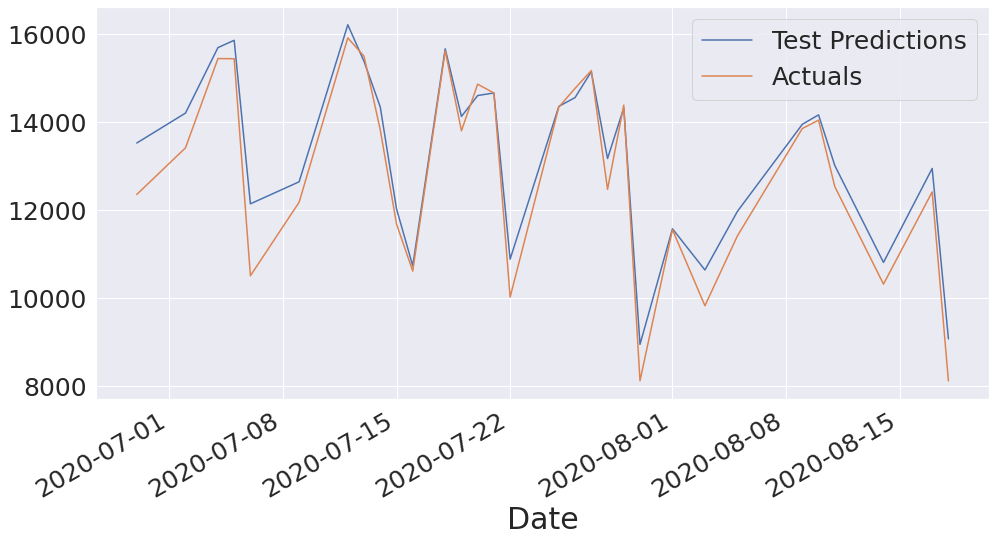

In [ ]:
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays4['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays4 = mixeddays4[['Test Predictions',	'Actuals']]
mixdays4

,Test Predictions,Actuals
Date,,
2020-01-15,3832.246582,3441.0
2020-01-17,3428.858398,2973.0
2020-01-20,6418.061035,6268.0
2020-01-21,5962.968262,5679.0
2020-01-22,5160.082031,4884.0
2020-01-24,2232.174805,1680.0
2020-01-29,6485.532227,6251.0
2020-01-30,3015.344238,2729.0
2020-02-03,3697.184326,3588.0


In [ ]:
mixarrap4 = mixeddays4['Test Predictions'].to_numpy()
mixac4 = mixeddays4['Actuals'].to_numpy()

In [ ]:
Rsquaredmix4 =r2_score(mixac4, mixarrap4)
mapemix4 = tf.keras.metrics.mean_absolute_percentage_error(mixac4, mixarrap4)
maemix4 = tf.keras.metrics.mean_absolute_error(mixac4, mixarrap4)

mmix4 = tf.keras.metrics.RootMeanSquaredError()
mmix4.update_state(mixac4, mixarrap4)
rmsemix4 = mmix4.result().numpy()
meanmix4 =np.mean(mixac4)
print('Rsqrared: ', Rsquaredmix4), print('MAPE: ',mapemix4), print('MAE: ',maemix4), print('RMSE: ',rmsemix4), print('Mean: ',meanmix4)



Rsqrared:  0.9682183536940562
MAPE:  tf.Tensor(6.181056, shape=(), dtype=float32)
MAE:  tf.Tensor(384.8615, shape=(), dtype=float32)
RMSE:  463.7682
Mean:  7682.105263157895


(None, None, None, None, None)

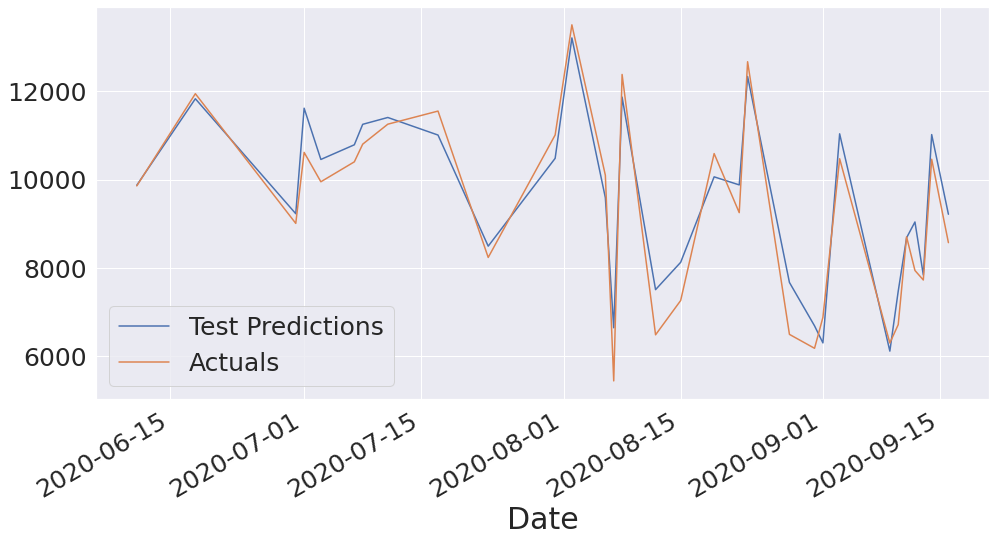

In [ ]:
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays4['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays4 = cloudydays4[['Test Predictions',	'Actuals']]
cloudydays4

,Test Predictions,Actuals
Date,,
2020-01-01,4097.975098,3695.0
2020-01-02,1670.563599,1349.0
2020-01-03,1019.513672,656.0
2020-01-04,3008.338867,2867.0
2020-01-05,3216.785645,3099.0
2020-01-06,2716.469238,2531.0
2020-01-07,3316.579346,2969.0
2020-01-08,5120.441895,4935.0
2020-01-09,2587.602783,2518.0


In [ ]:
cloudyarrap4 = cloudydays4['Test Predictions'].to_numpy()
cloudyac4 = cloudydays4['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy4 =r2_score(cloudyac4, cloudyarrap4)
mapecloudy4 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac4, cloudyarrap4)
maecloudy4 = tf.keras.metrics.mean_absolute_error(cloudyac4, cloudyarrap4)

mcloudy4 = tf.keras.metrics.RootMeanSquaredError()
mcloudy4.update_state(cloudyac4, cloudyarrap4)
rmsecloudy4 = mcloudy4.result().numpy()
meancloudy4 =np.mean(cloudyac4)
print('Rsqrared: ', Rsquaredcloudy4), print('MAPE: ',mapecloudy4), print('MAE: ',maecloudy4), print('RMSE: ',rmsecloudy4), print('Mean: ',meancloudy4)

Rsqrared:  0.9691374482053638
MAPE:  tf.Tensor(12.595078, shape=(), dtype=float32)
MAE:  tf.Tensor(301.2228, shape=(), dtype=float32)
RMSE:  372.09933
Mean:  3981.049295774648


(None, None, None, None, None)

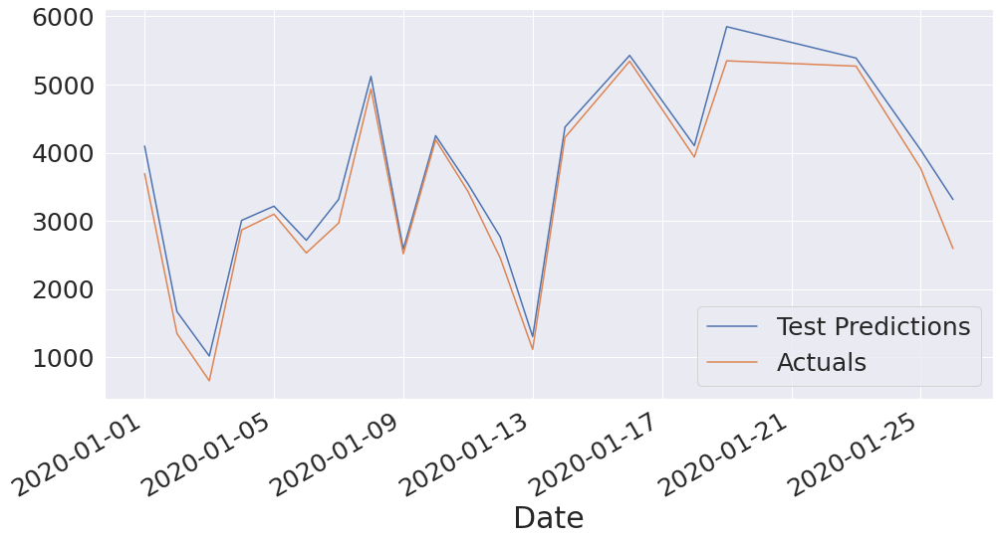

In [ ]:
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays4['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **COMPARISON**

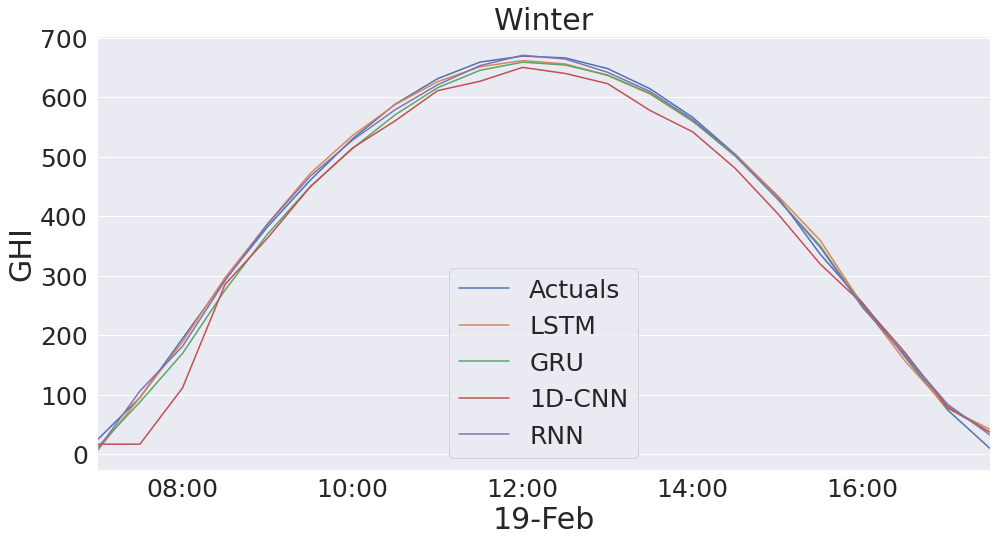

In [ ]:
test_results10['Actuals'][981:1003].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][981:1003].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][981:1003].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][981:1003].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][981:1003].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('19-Feb')
plt.ylabel('GHI')
plt.legend()

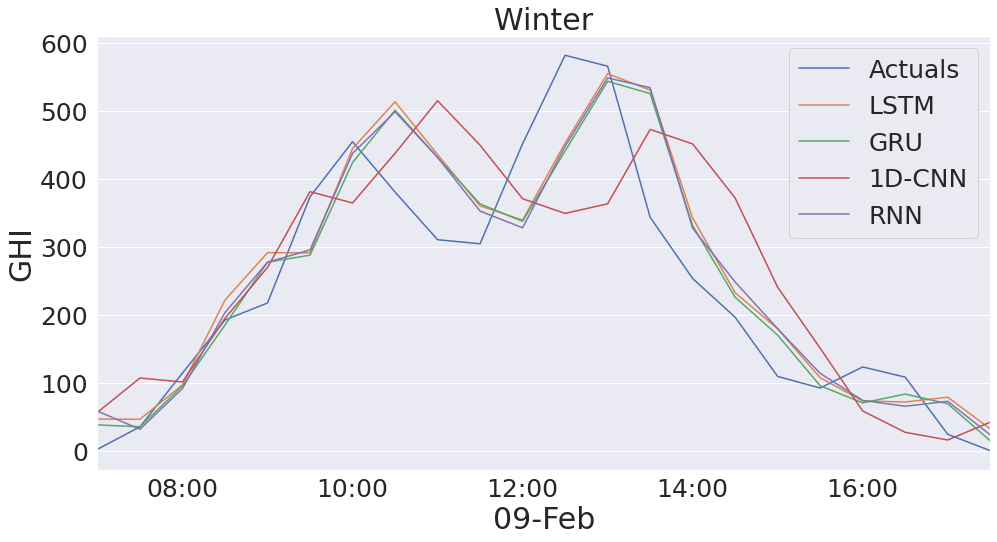

In [ ]:
test_results10['Actuals'][761:783].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][761:783].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][761:783].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][761:783].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][761:783].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('09-Feb')
plt.ylabel('GHI')
plt.legend()

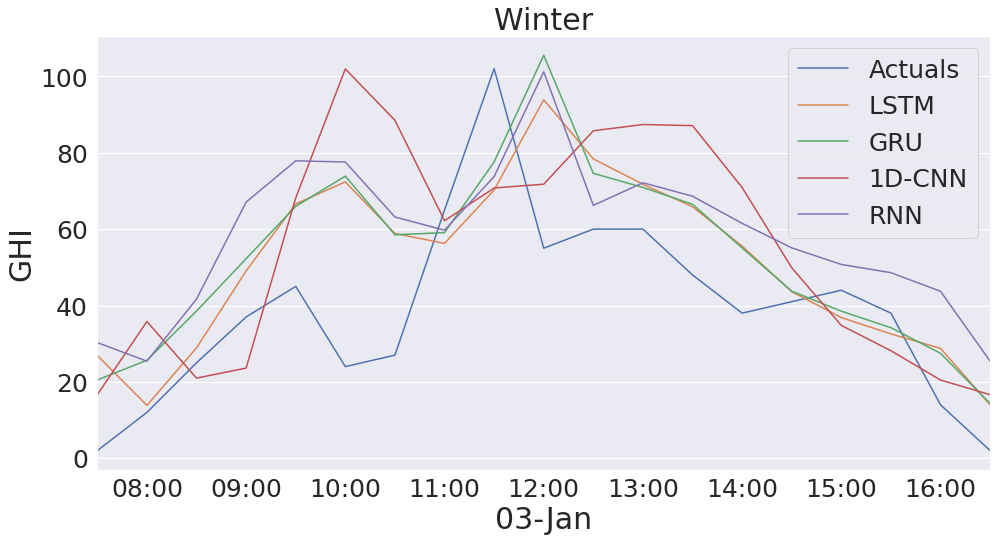

In [ ]:
test_results10['Actuals'][26:45].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][26:45].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][26:45].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][26:45].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][26:45].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('03-Jan')
plt.ylabel('GHI')
plt.legend()

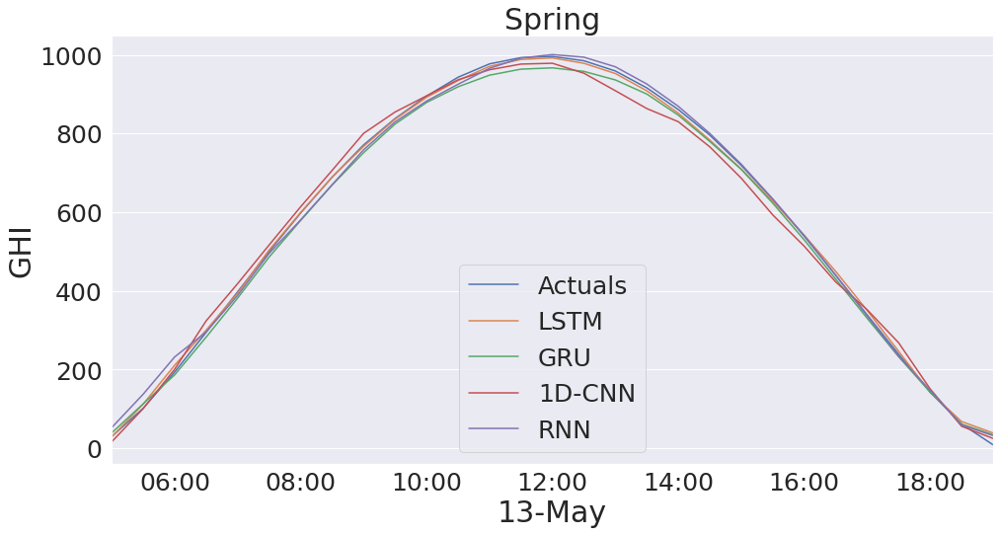

In [ ]:
test_results10['Actuals'][3124:3153].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3124:3153].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3124:3153].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3124:3153].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3124:3153].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('13-May')
plt.ylabel('GHI')
plt.legend()

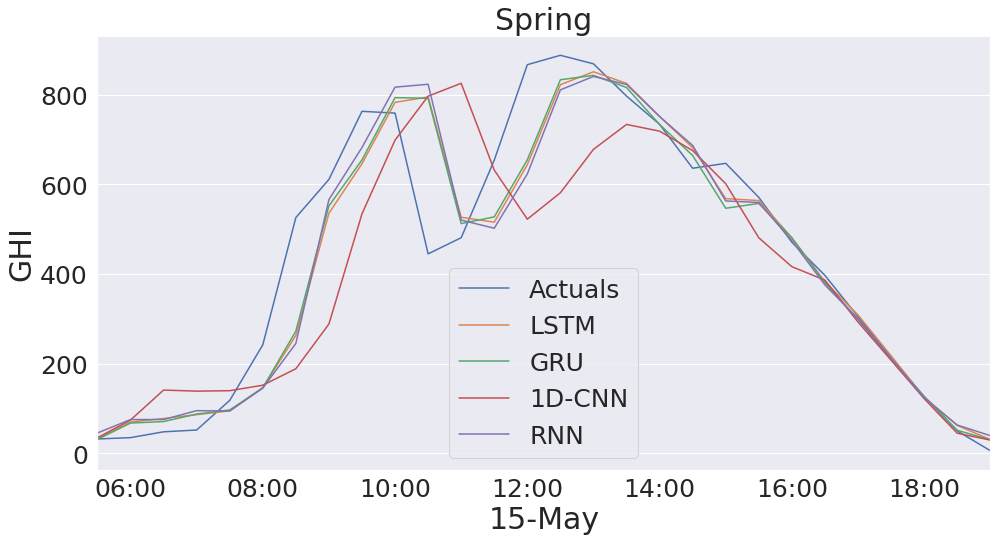

In [ ]:
test_results10['Actuals'][3183:3211].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3183:3211].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3183:3211].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3183:3211].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3183:3211].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('15-May')
plt.ylabel('GHI')
plt.legend()

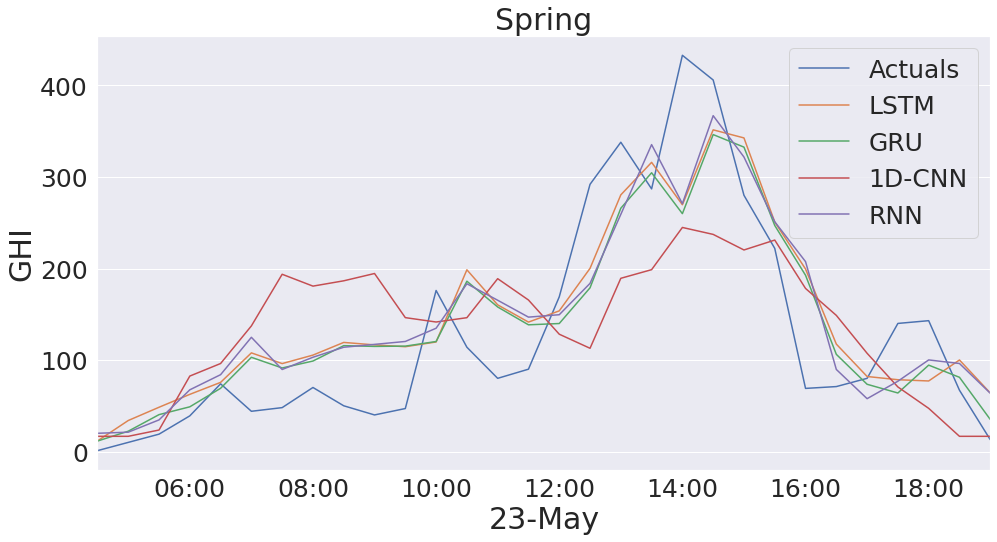

In [ ]:
test_results10['Actuals'][3419:3449].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3419:3449].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3419:3449].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3419:3449].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3419:3449].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('23-May')
plt.ylabel('GHI')
plt.legend()

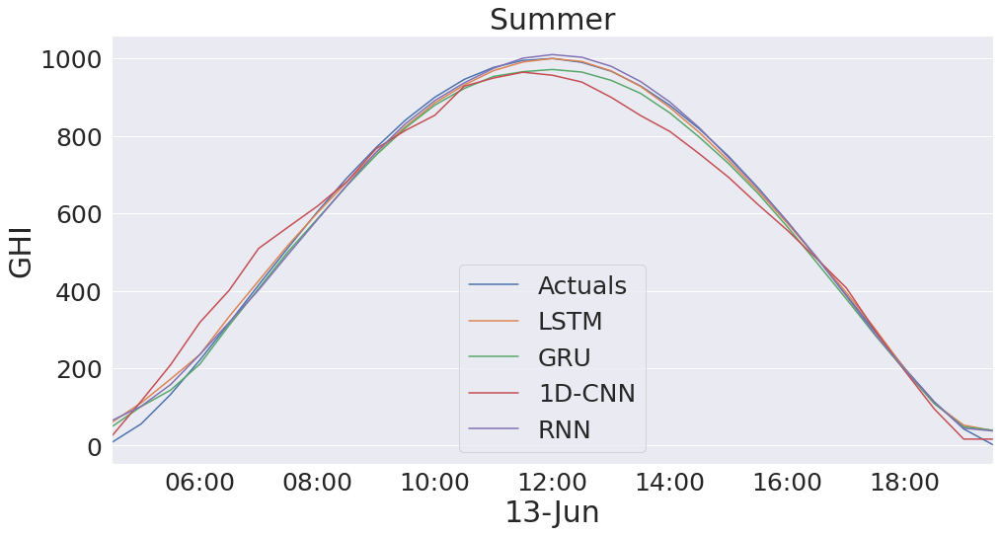

In [ ]:
test_results10['Actuals'][4057:4088].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4057:4088].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4057:4088].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4057:4088].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4057:4088].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('13-Jun')
plt.ylabel('GHI')
plt.legend()

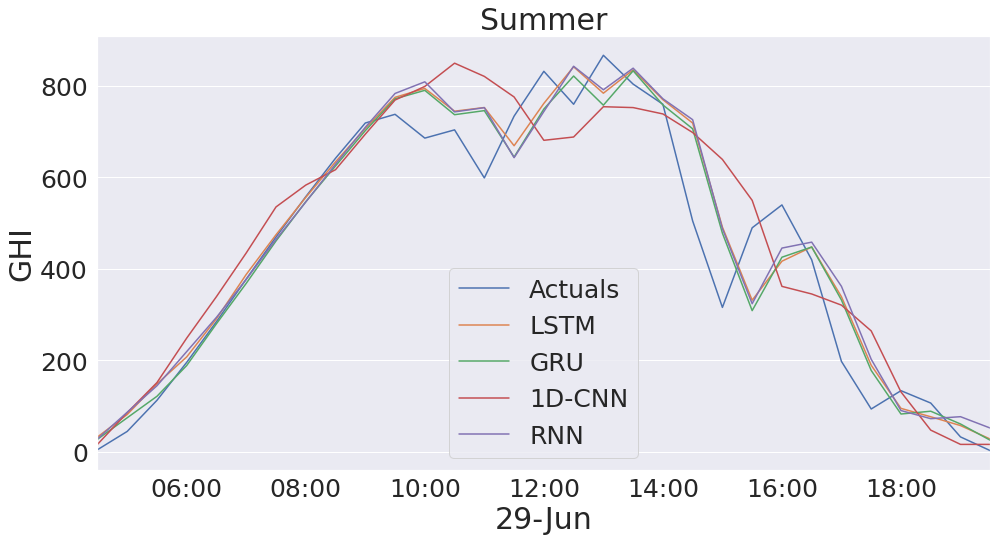

In [ ]:
test_results10['Actuals'][4553:4584].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4553:4584].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4553:4584].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4553:4584].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4553:4584].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('29-Jun')
plt.ylabel('GHI')
plt.legend()

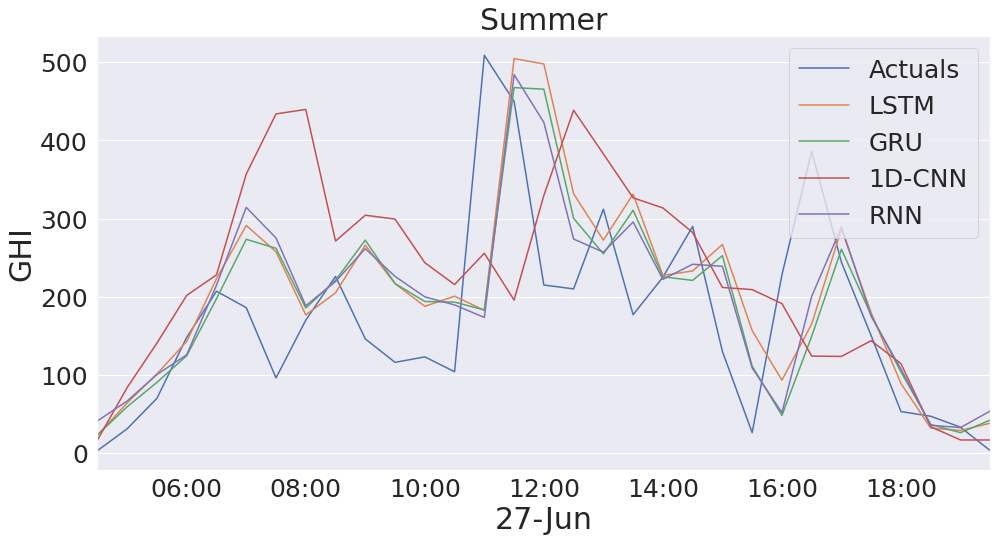

In [ ]:
test_results10['Actuals'][4491:4522].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][4491:4522].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][4491:4522].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][4491:4522].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][4491:4522].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('27-Jun')
plt.ylabel('GHI')
plt.legend()

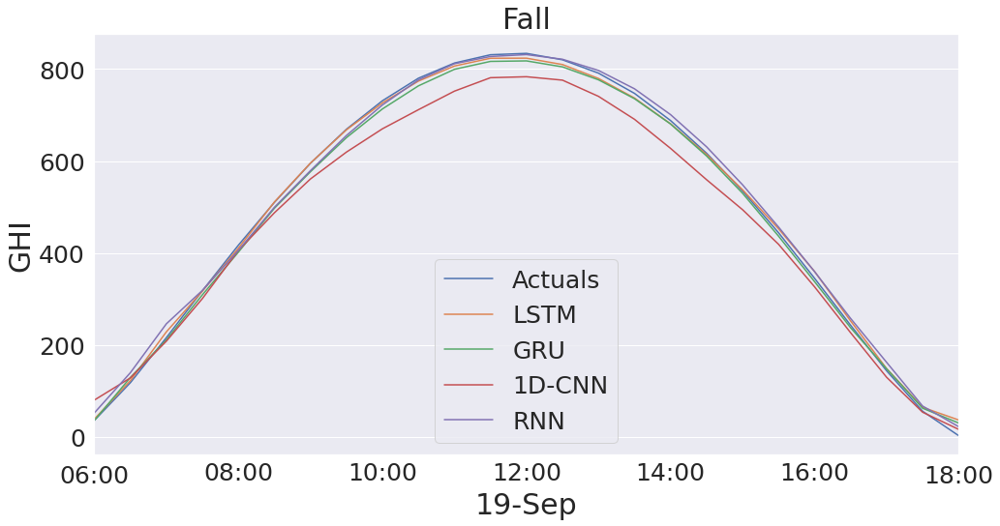

In [ ]:
test_results10['Actuals'][6878:6903].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][6878:6903].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][6878:6903].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][6878:6903].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][6878:6903].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('19-Sep')
plt.ylabel('GHI')
plt.legend()

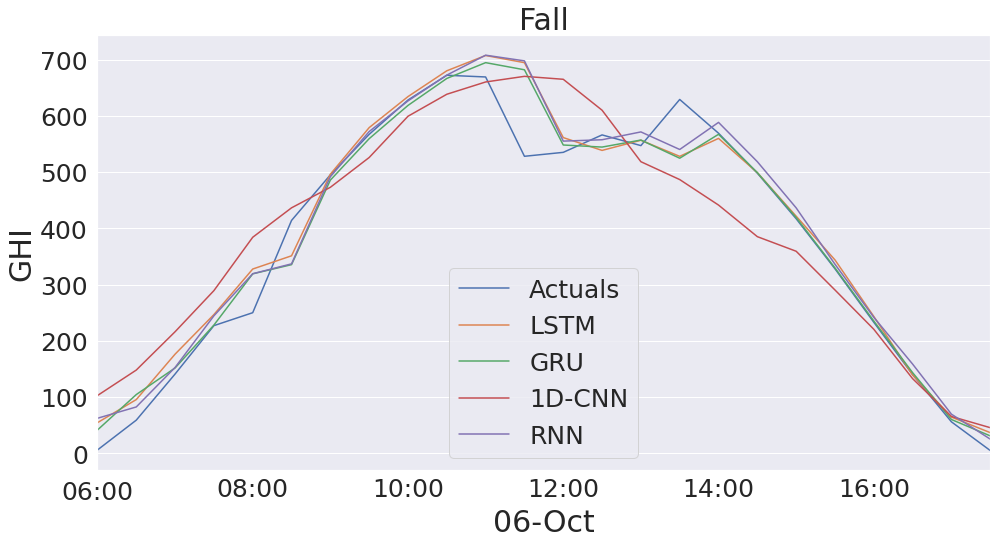

In [ ]:
test_results10['Actuals'][7289:7313].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][7289:7313].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][7289:7313].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][7289:7313].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][7289:7313].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('06-Oct')
plt.ylabel('GHI')
plt.legend()

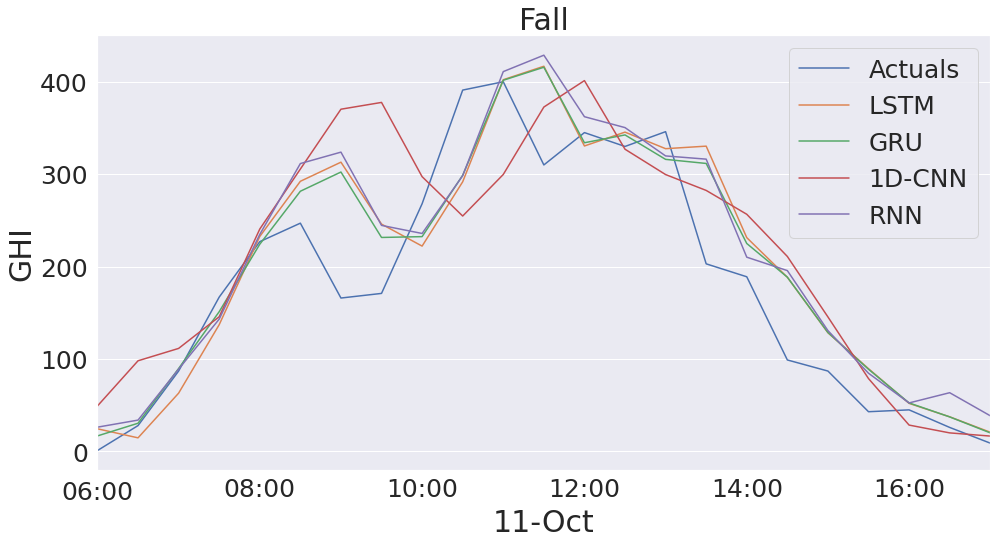

In [ ]:
test_results10['Actuals'][7408:7431].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][7408:7431].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][7408:7431].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][7408:7431].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][7408:7431].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('11-Oct')
plt.ylabel('GHI')
plt.legend()

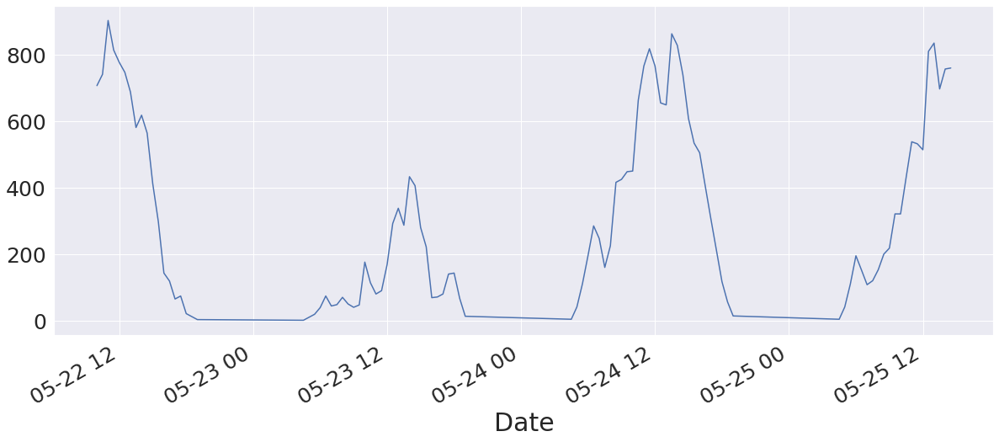

In [ ]:
test_results10['Actuals'][3400:3500].plot(figsize=(20,8), label='Actuals')

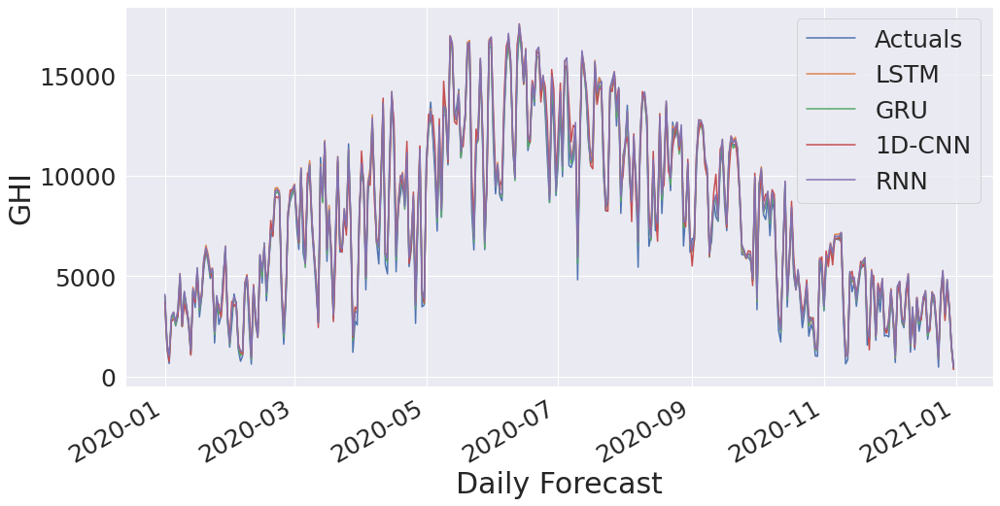

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='LSTM')
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='GRU')
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='1D-CNN')
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='RNN')
plt.xlabel('Daily Forecast')
plt.ylabel('GHI')
plt.legend()

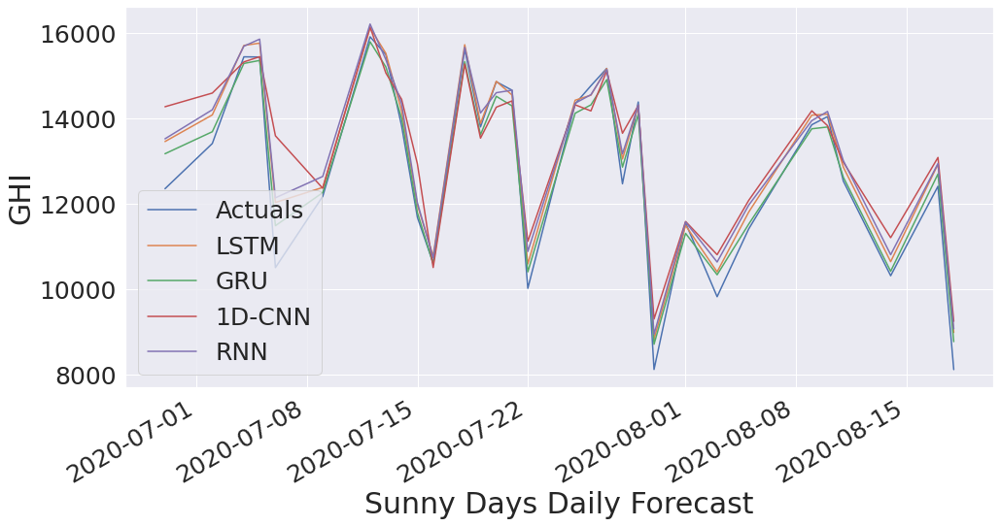

In [ ]:
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='LSTM')
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='GRU')
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='1D-CNN')
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='RNN')
plt.xlabel('Sunny Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

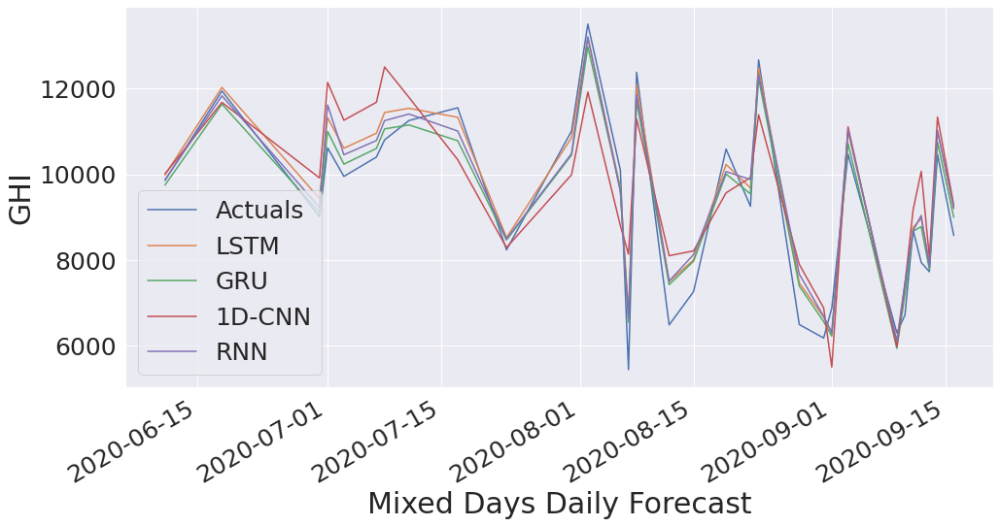

In [ ]:
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='LSTM')
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='GRU')
mixeddays3['Test Predictions'][50:81].plot(figsize=(16,8), label='1D-CNN')
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='RNN')
plt.xlabel('Mixed Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

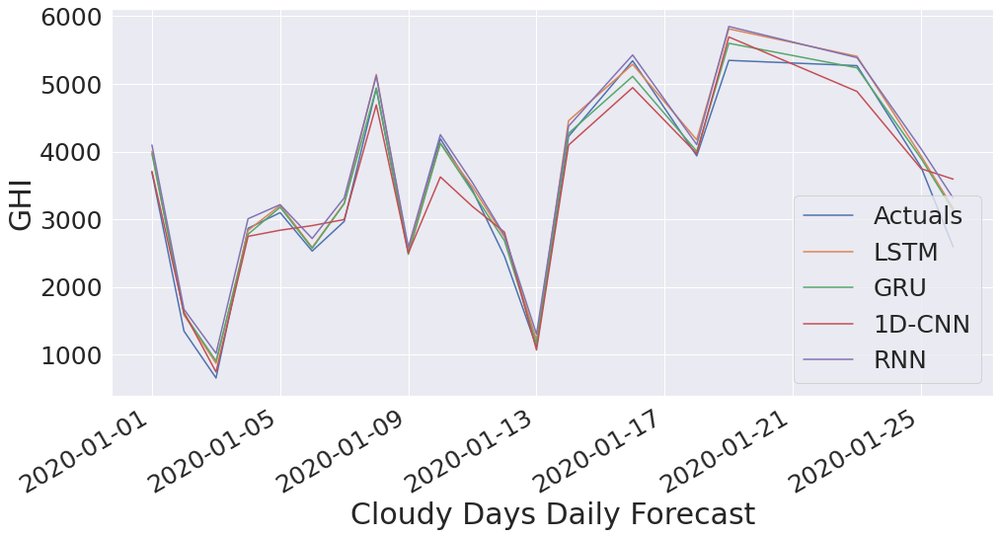

In [ ]:
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='LSTM')
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='GRU')
cloudydays3['Test Predictions'][:20].plot(figsize=(16,8), label='1D-CNN')
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='RNN')
plt.xlabel('Cloudy Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

# **Evaluation Parameters Barcharts**

In [ ]:

columns = ["Models", "R2_SCORE%", "MAE", "RMSE"]
HawaiiHourly = pd.DataFrame.from_records([("1D-CNN", Rsquared3*100, mae3.numpy(),rmse3),
                                          ("RNN", Rsquared4*100, mae4.numpy(), rmse4),
                                          ("LSTM", Rsquared1*100, mae1.numpy(), rmse1),
                                          ("GRU", Rsquared2*100, mae2.numpy(), rmse2)],
                                       columns=columns)
HawaiiHourlymelted = pd.melt(HawaiiHourly, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")


In [ ]:
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

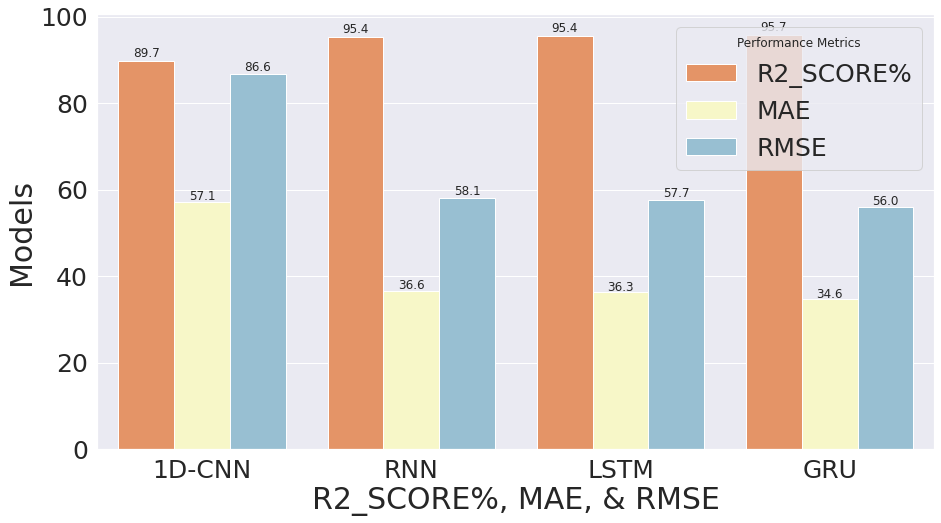

In [ ]:

a = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=HawaiiHourlymelted, errwidth=0, palette="RdYlBu", alpha=1)
a.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
a.set_ylabel("Models",fontsize=30)
a.tick_params(labelsize=25)

show_values(a)


In [ ]:
HawaiiHourly.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,89.692995,57.051231,86.613472
RNN,95.359959,36.605640,58.113911
LSTM,95.429486,36.306416,57.676876
GRU,95.697192,34.614811,55.962250


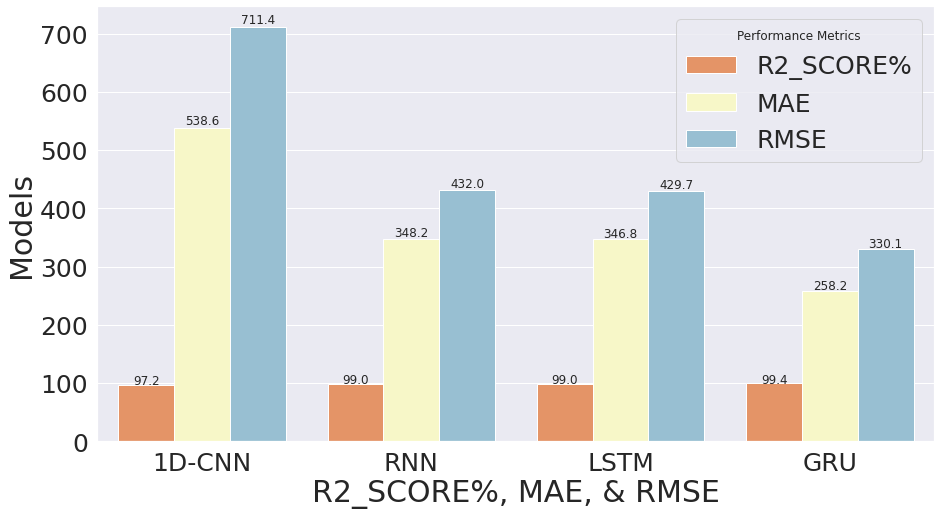

In [ ]:
columns1 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Daily = pd.DataFrame.from_records([("1D-CNN", RsquaredFullyear3*100, maeFullyear3.numpy(), rmseFullyear3),
                                          ("RNN", RsquaredFullyear4*100, maeFullyear4.numpy(), rmseFullyear4),
                                          ("LSTM", RsquaredFullyear1*100, maeFullyear1.numpy(), rmseFullyear1),
                                          ("GRU", RsquaredFullyear2*100, maeFullyear2.numpy(), rmseFullyear2)],
                                       columns=columns1)
Dailymelted = pd.melt(Daily, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

b = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Dailymelted, errwidth=0, palette="RdYlBu", alpha=1)
b.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
b.set_ylabel("Models",fontsize=30)
b.tick_params(labelsize=25)

show_values(b)

In [ ]:
Daily.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,97.244492,538.598267,711.409241
RNN,98.983774,348.232208,432.029846
LSTM,98.994513,346.750885,429.741089
GRU,99.406658,258.205383,330.119629


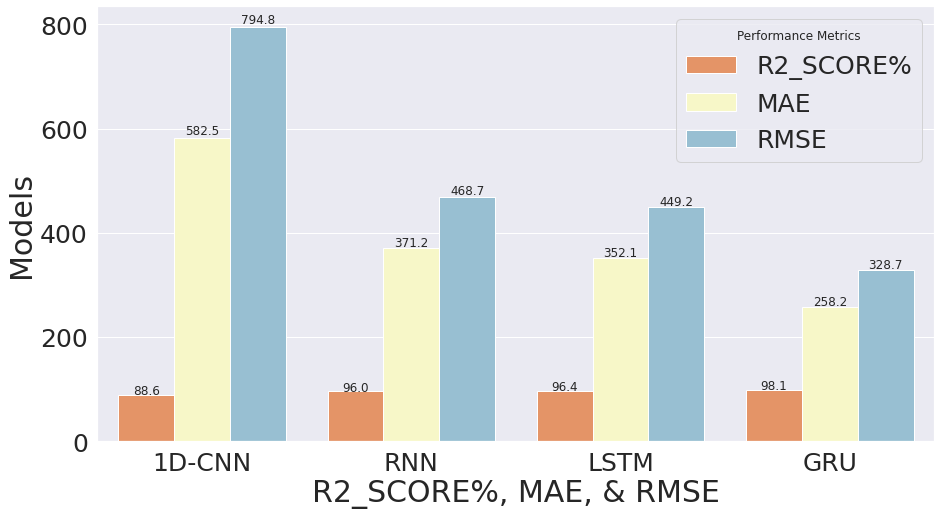

In [ ]:
columns2 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Sunny = pd.DataFrame.from_records([("1D-CNN", Rsquaredsunny3*100, maesunny3.numpy(), rmsesunny3),
                                          ("RNN", Rsquaredsunny4*100, maesunny4.numpy(), rmsesunny4),
                                          ("LSTM", Rsquaredsunny1*100, maesunny1.numpy(), rmsesunny1),
                                          ("GRU", Rsquaredsunny2*100, maesunny2.numpy(), rmsesunny2)],
                                       columns=columns2)
Sunnymelted = pd.melt(Sunny, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

c = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Sunnymelted, errwidth=0, palette="RdYlBu", alpha=1)
c.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
c.set_ylabel("Models",fontsize=30)
c.tick_params(labelsize=25)

show_values(c)

In [ ]:
Sunny.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,88.633314,582.514771,794.796448
RNN,96.046832,371.164276,468.718048
LSTM,96.369239,352.136536,449.198029
GRU,98.055611,258.203583,328.723389


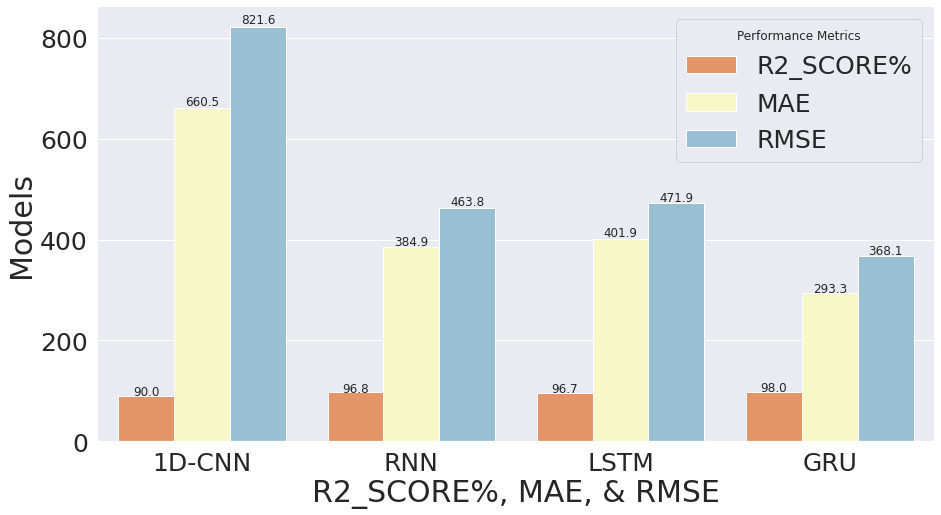

In [ ]:
columns3 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Mixed = pd.DataFrame.from_records([("1D-CNN", Rsquaredmix3*100, maemix3.numpy(), rmsemix3),
                                          ("RNN", Rsquaredmix4*100, maemix4.numpy(), rmsemix4),
                                          ("LSTM", Rsquaredmix1*100, maemix1.numpy(), rmsemix1),
                                          ("GRU", Rsquaredmix2*100, maemix2.numpy(), rmsemix2)],
                                       columns=columns3)
Mixedmelted = pd.melt(Mixed, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

d = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Mixedmelted, errwidth=0, palette="RdYlBu", alpha=1)
d.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
d.set_ylabel("Models",fontsize=30)
d.tick_params(labelsize=25)

show_values(d)

In [ ]:
Mixed.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,90.026351,660.505920,821.560974
RNN,96.821835,384.861511,463.768188
LSTM,96.708817,401.880676,471.942169
GRU,97.997708,293.324005,368.109009


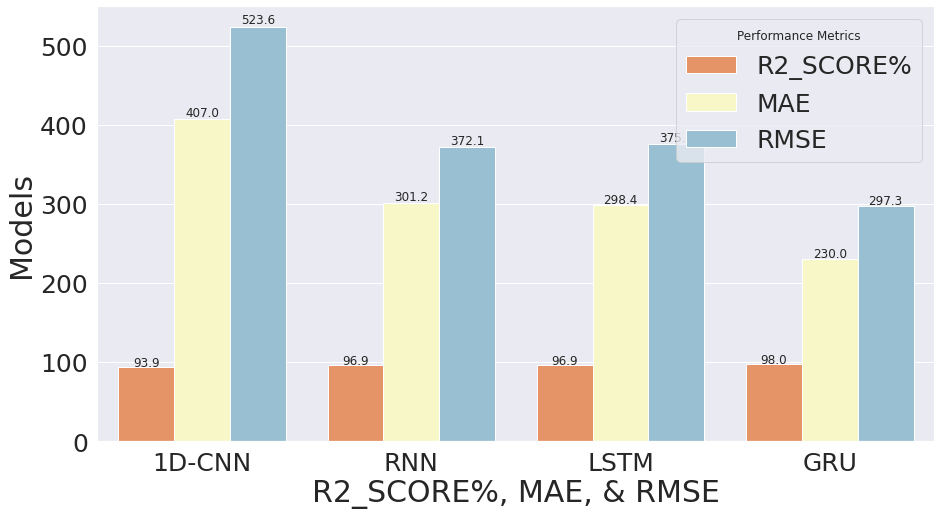

In [ ]:
columns4 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Cloudy = pd.DataFrame.from_records([("1D-CNN", Rsquaredcloudy3*100, maecloudy3.numpy(), rmsecloudy3),
                                          ("RNN", Rsquaredcloudy4*100, maecloudy4.numpy(), rmsecloudy4),
                                          ("LSTM", Rsquaredcloudy1*100, maecloudy1.numpy(), rmsecloudy1),
                                          ("GRU", Rsquaredcloudy2*100, maecloudy2.numpy(), rmsecloudy2)],
                                       columns=columns4)
Cloudymelted = pd.melt(Cloudy, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

e = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Cloudymelted, errwidth=0, palette="RdYlBu", alpha=1)

e.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
e.set_ylabel("Models",fontsize=30)
e.tick_params(labelsize=25)

show_values(e)

In [ ]:
Cloudy.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,93.889585,407.018280,523.574402
RNN,96.913745,301.222809,372.099335
LSTM,96.857049,298.357605,375.501617
GRU,98.029766,230.012924,297.304810
